In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import scipy.stats as stats
from datetime import datetime as dt

In [2]:
from wordcloud import WordCloud, STOPWORDS

In [3]:
import folium
from folium.plugins import HeatMap

from sklearn.preprocessing import StandardScaler, MinMaxScaler, PowerTransformer

from sklearn.model_selection import train_test_split

import statsmodels
import statsmodels.api as sm

from sklearn.preprocessing import StandardScaler, MinMaxScaler

from sklearn import metrics
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report, cohen_kappa_score, confusion_matrix, roc_auc_score, roc_curve, accuracy_score, precision_score, recall_score, f1_score
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier,GradientBoostingClassifier
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
from sklearn import tree

from sklearn.feature_selection import RFE

from warnings import filterwarnings
filterwarnings('ignore')



In [4]:
pd.set_option("display.max_columns",None)

In [5]:
#Olist E-Commerce datasets
customers = pd.read_csv("E:/archive_5/olist_customers_dataset.csv")
geolocation = pd.read_csv("E:/archive_5/olist_geolocation_dataset.csv")
orderItems = pd.read_csv("E:/archive_5/olist_order_items_dataset.csv")
payments = pd.read_csv("E:/archive_5/olist_order_payments_dataset.csv")
orderReviews = pd.read_csv("E:/archive_5/olist_order_reviews_dataset.csv")
orders = pd.read_csv("E:/archive_5/olist_orders_dataset.csv")
products = pd.read_csv("E:/archive_5/olist_products_dataset.csv")
sellers = pd.read_csv("E:/archive_5/olist_sellers_dataset.csv")
productCategoryTranslation = pd.read_csv("E:/archive_5/product_category_name_translation.csv")

In [6]:
orders.head(5)

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18 00:00:00
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13 00:00:00
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04 00:00:00
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15 00:00:00
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26 00:00:00


In [7]:
print('Number of Records:',orders.shape[0])
print('Number of Columns:',orders.shape[1])


Number of Records: 99441
Number of Columns: 8


In [8]:
orders['order_purchase_timestamp'] = pd.to_datetime(orders.order_purchase_timestamp)
orders['order_approved_at'] = pd.to_datetime(orders.order_approved_at)
orders['order_delivered_carrier_date'] = pd.to_datetime(orders.order_delivered_carrier_date)
orders['order_delivered_customer_date'] = pd.to_datetime(orders.order_delivered_customer_date)
orders['order_estimated_delivery_date'] = pd.to_datetime(orders.order_estimated_delivery_date)

In [9]:
orders.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 8 columns):
 #   Column                         Non-Null Count  Dtype         
---  ------                         --------------  -----         
 0   order_id                       99441 non-null  object        
 1   customer_id                    99441 non-null  object        
 2   order_status                   99441 non-null  object        
 3   order_purchase_timestamp       99441 non-null  datetime64[ns]
 4   order_approved_at              99281 non-null  datetime64[ns]
 5   order_delivered_carrier_date   97658 non-null  datetime64[ns]
 6   order_delivered_customer_date  96476 non-null  datetime64[ns]
 7   order_estimated_delivery_date  99441 non-null  datetime64[ns]
dtypes: datetime64[ns](5), object(3)
memory usage: 6.1+ MB


In [10]:
orders.isna().sum()


order_id                            0
customer_id                         0
order_status                        0
order_purchase_timestamp            0
order_approved_at                 160
order_delivered_carrier_date     1783
order_delivered_customer_date    2965
order_estimated_delivery_date       0
dtype: int64

In [11]:
orders.order_id.nunique()

99441

In [12]:
orders.dropna()['order_status'].value_counts()

delivered    96455
canceled         6
Name: order_status, dtype: int64

In [13]:
orders[orders.isna().any(axis = 1)]['order_status'].value_counts()

shipped        1107
canceled        619
unavailable     609
invoiced        314
processing      301
delivered        23
created           5
approved          2
Name: order_status, dtype: int64

In [14]:
orders['purchased_approved'] = (orders.order_approved_at -orders.order_purchase_timestamp).dt.seconds
orders['approved_carrier'] = (orders.order_delivered_carrier_date - orders.order_approved_at).dt.days
orders['carrier_delivered'] = (orders.order_delivered_customer_date - orders.order_delivered_carrier_date).dt.days
orders['delivered_estimated'] = (orders.order_estimated_delivery_date - orders.order_delivered_customer_date).dt.days
orders['purchased_delivered'] = (orders.order_delivered_customer_date - orders.order_purchase_timestamp).dt.days
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642.0,2.0,6.0,7.0,8.0
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170.0,0.0,12.0,5.0,13.0
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994.0,0.0,9.0,17.0,9.0
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073.0,3.0,9.0,12.0,13.0
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710.0,0.0,1.0,9.0,2.0


In [15]:
#after saving owr data 

In [16]:
orders.order_status.value_counts()

delivered      96478
shipped         1107
canceled         625
unavailable      609
invoiced         314
processing       301
created            5
approved           2
Name: order_status, dtype: int64

In [17]:
#New columns are created using the available datetime columns for easy analysis of the available data.
#Purchased_approved represents the seconds taken for an order to get approved after the customer purchases it.
#approved_carrier represents the days taken for the order to go to the delivery carrier after it being approved.
#carrier_delivered represents the days taken for the order to be delivered to the customer from the date it reaches the delivery carrier.
#delivered_estimated represents the date difference between the estimated delivery date and the actual delivery date.
#purchased_delivered represents the days taken for the order to be delivered to the customer from the date the customer made the purchase.

In [18]:
orders.describe(include = np.number)

,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
count,99281.000000,97644.000000,96475.000000,96476.000000,96476.000000
mean,14198.031496,2.301749,8.878310,10.876881,12.094086
std,23663.448160,3.560283,8.746088,10.183854,9.551746
min,0.000000,-172.000000,-17.000000,-189.000000,0.000000
25%,755.000000,0.000000,4.000000,6.000000,6.000000
50%,1169.000000,1.000000,7.000000,11.000000,10.000000
75%,17166.000000,3.000000,12.000000,16.000000,15.000000
max,86399.000000,125.000000,205.000000,146.000000,209.000000


In [19]:
falsifiedData = orders[orders.approved_carrier < 0].index
orders.drop(index = falsifiedData, inplace = True)

In [20]:
falsifiedData = orders[orders.carrier_delivered < 0].index
orders.drop(index = falsifiedData, inplace = True)

In [21]:
canceledIndex = orders.dropna()[orders.order_status == 'canceled'].index
orders.drop(index = canceledIndex, inplace = True)

In [22]:
#Orders which have carrier date prior to the date of order getting approved, and orders which have delivered date prior to the carrier date are considered to be falsified data, as it could not be logically true.
#Such records are dropped.
#Also the records which are cancelled and have no null values are also dropped as we consider only the records which have a order status of delivered.

In [23]:
orders.describe(include = np.number)

,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
count,97893.000000,96256.000000,95096.000000,95097.000000,95097.000000
mean,13950.420428,2.357224,8.910228,10.825568,12.153359
std,23484.689925,3.503335,8.755221,10.199320,9.577379
min,0.000000,0.000000,0.000000,-189.000000,0.000000
25%,752.000000,0.000000,4.000000,6.000000,6.000000
50%,1153.000000,1.000000,7.000000,11.000000,10.000000
75%,15785.000000,3.000000,12.000000,16.000000,15.000000
max,86399.000000,125.000000,205.000000,146.000000,209.000000


In [24]:
otherThanDelivered = orders[(orders.isna().any(axis = 1)) & (orders.order_status != 'delivered')].index
orders.drop(index = otherThanDelivered, inplace = True)

In [25]:
approvedAtNull = orders[orders.order_approved_at.isna()].index
orders.loc[approvedAtNull, 'order_approved_at'] = orders.loc[approvedAtNull, 'order_purchase_timestamp'] + pd.Timedelta(seconds = orders.purchased_approved.median())

In [26]:
deliveredCarrierNull = orders[orders.order_delivered_carrier_date.isna()].index
orders.loc[deliveredCarrierNull, 'order_delivered_carrier_date'] = orders.loc[deliveredCarrierNull, 'order_approved_at'] + pd.Timedelta(days = orders.approved_carrier.median())


In [27]:
deliveredCustomerNull = orders[orders.order_delivered_customer_date.isna()].index
orders.loc[deliveredCustomerNull, 'order_delivered_customer_date'] = orders.loc[deliveredCustomerNull, 'order_delivered_carrier_date'] + pd.Timedelta(days = orders.carrier_delivered.median())

In [28]:
#The null values are dropped which do not have the order status as delivered.
#The null values in the order_approved_at field is imputed by adding the median number of seconds it took for an order to get approved after it is purchased, with the order_purchase_timestamp.
#The null values in the order_delivered_carrier_date field is imputed by adding the median number of days it took for an order to reach the carrier after it is approved, with the order_approved_at timestamp.
#The null values in the order_delivered_customer_date field is imputed by adding the median number of days it took for an order to get delivered to the customer after it reaches the carrier, with the order_delivered_carrier_date timestamp.

In [29]:
orders['purchased_approved'] = (orders.order_approved_at -orders.order_purchase_timestamp).dt.seconds
orders['approved_carrier'] = (orders.order_delivered_carrier_date - orders.order_approved_at).dt.days
orders['carrier_delivered'] = (orders.order_delivered_customer_date - orders.order_delivered_carrier_date).dt.days
orders['delivered_estimated'] = (orders.order_estimated_delivery_date - orders.order_delivered_customer_date).dt.days
orders['purchased_delivered'] = (orders.order_delivered_customer_date - orders.order_purchase_timestamp).dt.days
orders.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642,2,6,7,8
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170,0,12,5,13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994,0,9,17,9
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710,0,1,9,2


In [30]:
orders.describe(include= np.number)

,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
count,95105.000000,95105.000000,95105.000000,95105.000000,95105.000000
mean,13904.246517,2.351853,8.910509,10.825793,12.153147
std,23444.451686,3.490348,8.755888,10.199025,9.577021
min,0.000000,0.000000,0.000000,-189.000000,0.000000
25%,753.000000,0.000000,4.000000,6.000000,6.000000
50%,1153.000000,1.000000,7.000000,11.000000,10.000000
75%,15479.000000,3.000000,12.000000,16.000000,15.000000
max,86399.000000,125.000000,205.000000,146.000000,209.000000


In [31]:
#From the summary statistics, we could infer that the it took an average(median is considered as it is highly right skewed) of 1153 seconds or over half an hour hours for the order to get approved after the customer purchased it.
#It took on an average of 12 days for the order to get delivered to the customer from the date of purchase.
# first order was placed on 15/09/2016 and the last order was placed on 29/08/2018, from the available dataset.
#On an average it took 11 days for an order to get delivered to the customer before the estimated date of delivery. There are many orders which were delivered late than the estimated date of delivery.


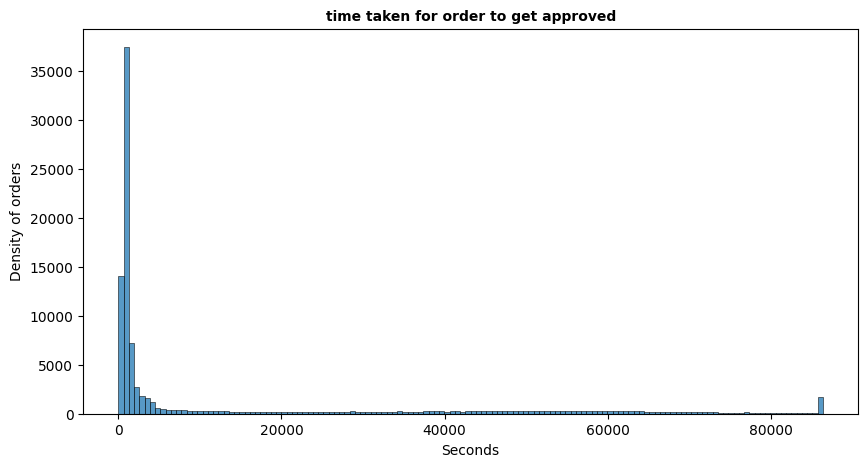

In [32]:
plt.figure(figsize=(10, 5))
sns.histplot(x='purchased_approved', data=orders)
plt.title('time taken for order to get approved',fontweight='bold',fontsize=10)
plt.xlabel('Seconds',fontsize=10)
plt.ylabel('Density of orders',fontsize=10)
plt.show()

In [33]:
#we have clearly see it is right side skewed

In [34]:
#we can clearly see it is rightly skewed so it is 
Q1 = np.quantile(orders.purchased_approved, 0.25)
Q3 = np.quantile(orders.purchased_approved, 0.75)
IQR = Q3 - Q1
purchasedApprovedDist = orders[~((orders.purchased_approved < Q1 - 1.5 * IQR) | (orders.purchased_approved > Q3 + 1.5 * IQR))]
purchasedApprovedDist.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642,2,6,7,8
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170,0,12,5,13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994,0,9,17,9
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710,0,1,9,2


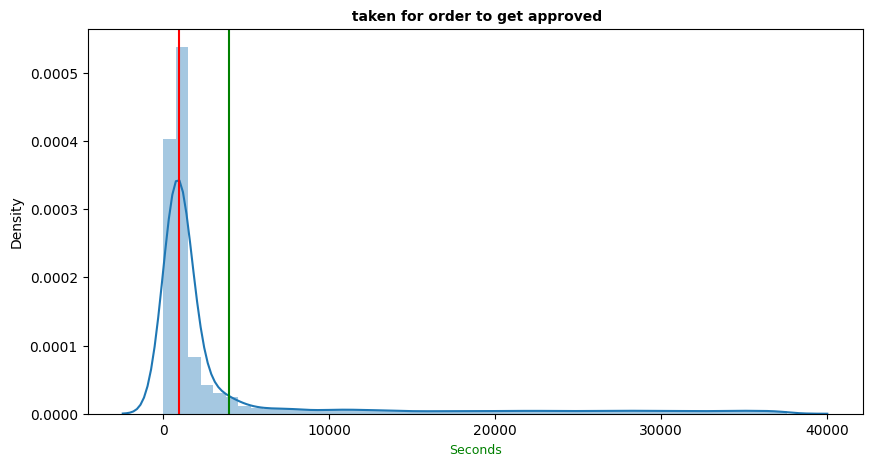

In [35]:

plt.figure(figsize=(10, 5))
sns.distplot(purchasedApprovedDist.purchased_approved)
plt.axvline(purchasedApprovedDist.purchased_approved.mean(), c = 'green')
plt.axvline(purchasedApprovedDist.purchased_approved.median(), c = 'red')
plt.xlabel('Seconds',color='green',fontsize=9)
plt.title(' taken for order to get approved',color='black',fontsize=10,fontweight='bold')
plt.show()

In [36]:
# middle values are look in the nearby 0 and mean is in the nearby 1500

In [37]:
purchasedApprovedDist.purchased_approved.describe()

count    78335.000000
mean      3944.854867
std       7741.478369
min          0.000000
25%        707.000000
50%        955.000000
75%       1940.000000
max      37563.000000
Name: purchased_approved, dtype: float64

In [38]:
#The approval time of orders within the interquartile range are spread mostly between 0 and 5000 seconds, which could be seen in the distribution plot.
#The average time taken for approval of the orders is 3944.85 seconds.

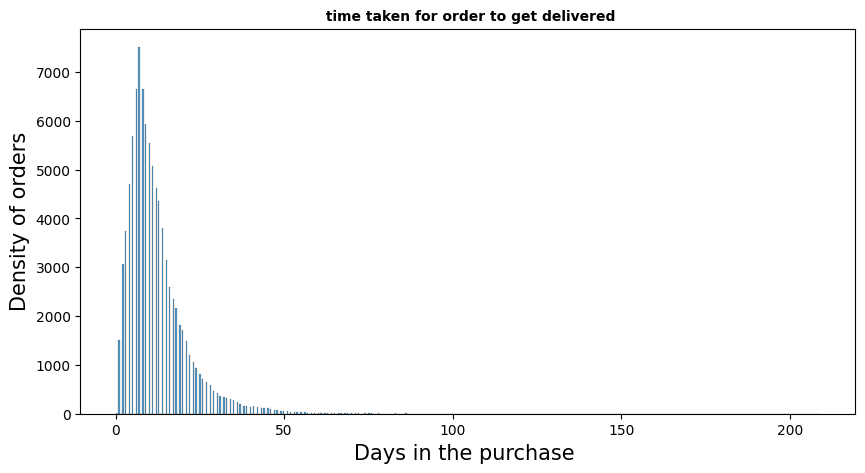

In [39]:
plt.figure(figsize=(10, 5))
sns.histplot(x='purchased_delivered', data=orders)
plt.title(' time taken for order to get delivered',fontweight='bold',fontsize=10)
plt.xlabel('Days in the purchase ',fontsize=15)
plt.ylabel('Density of orders',fontsize=15)
plt.show()

In [40]:
# we clearly see it is right skewed 

In [41]:
Q1 = np.quantile(orders.purchased_delivered, 0.25)
Q3 = np.quantile(orders.purchased_delivered, 0.75)
IQR = Q3 - Q1
purchasedDeliveredDist = orders[~((orders.purchased_delivered < Q1 - 1.5 * IQR) | (orders.purchased_delivered > Q3 + 1.5 * IQR))]
purchasedDeliveredDist.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642,2,6,7,8
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170,0,12,5,13
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994,0,9,17,9
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710,0,1,9,2


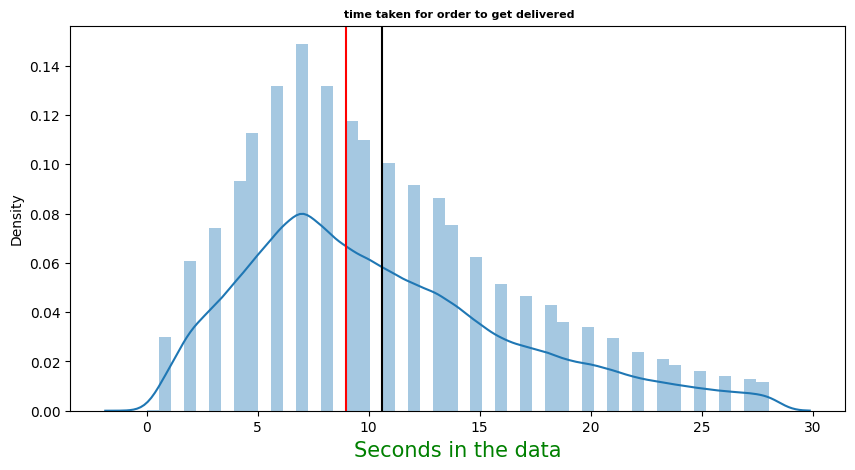

In [42]:
plt.figure(figsize=(10, 5))
sns.distplot(purchasedDeliveredDist.purchased_delivered)
plt.axvline(purchasedDeliveredDist.purchased_delivered.mean(), c = 'black')
plt.axvline(purchasedDeliveredDist.purchased_delivered.median(), c = 'red')
plt.xlabel('Seconds in the data',color='green',fontsize=15)
plt.title(' time taken for order to get delivered',color='black',fontsize=8,fontweight='bold')
plt.show()

In [43]:
purchasedDeliveredDist.purchased_delivered.describe()

count    90096.000000
mean        10.602968
std          6.064321
min          0.000000
25%          6.000000
50%          9.000000
75%         14.000000
max         28.000000
Name: purchased_delivered, dtype: float64

In [44]:
#The delivery days of orders within the interquartile range are spread mostly between 0 and 28 days, which could be seen in the distribution plot.
#The average days taken for delivery of the orders is 11 days.

In [45]:
customers.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP


In [46]:
print('Number of records:',customers.shape[0])
print('Number of columns:',customers.shape[1])

Number of records: 99441
Number of columns: 5


In [47]:
#Observations:

#The delivery days of orders within the interquartile range are spread mostly between 0 and 28 days, which could be seen in the distribution plot.
#The average days taken for delivery of the orders is 11 days.

In [48]:
customers.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99441 entries, 0 to 99440
Data columns (total 5 columns):
 #   Column                    Non-Null Count  Dtype 
---  ------                    --------------  ----- 
 0   customer_id               99441 non-null  object
 1   customer_unique_id        99441 non-null  object
 2   customer_zip_code_prefix  99441 non-null  int64 
 3   customer_city             99441 non-null  object
 4   customer_state            99441 non-null  object
dtypes: int64(1), object(4)
memory usage: 3.8+ MB


In [49]:
customers.isnull().sum()

customer_id                 0
customer_unique_id          0
customer_zip_code_prefix    0
customer_city               0
customer_state              0
dtype: int64

In [50]:
#there is no null value present in the dataset 

In [51]:
customers['customer_zip_code_prefix'] = customers['customer_zip_code_prefix'].astype(object)

In [52]:
customers.describe(include='object')

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state
count,99441,99441,99441,99441,99441
unique,99441,96096,14994,4119,27
top,06b8999e2fba1a1fbc88172c00ba8bc7,8d50f5eadf50201ccdcedfb9e2ac8455,22790,sao paulo,SP
freq,1,17,142,15540,41746


In [53]:
#The total count of customer unique ID is 99441, while the count of unique customer unique ID is 96096. We could observe that almost all of the customers are one time visitors, i.e., the frequency of their visit would be 1.
#The customers come from 14994 unique zip code locations, and the most number of customers, 142, belong to the zip code 22790, which is Rio de Janeiro, Brazil.
#The top city to which customers belong to is Sao Paulo and the top state to which our customers belong is Sao Paulo.

In [54]:
customercity=customers.customer_city.value_counts(normalize=True)[:12]*100

In [55]:
customercity

sao paulo                15.627357
rio de janeiro            6.920687
belo horizonte            2.788588
brasilia                  2.142979
curitiba                  1.529550
campinas                  1.452117
porto alegre              1.386752
salvador                  1.251999
guarulhos                 1.195684
sao bernardo do campo     0.943273
niteroi                   0.853773
santo andre               0.801480
Name: customer_city, dtype: float64

In [56]:
#sao paula take highest of all

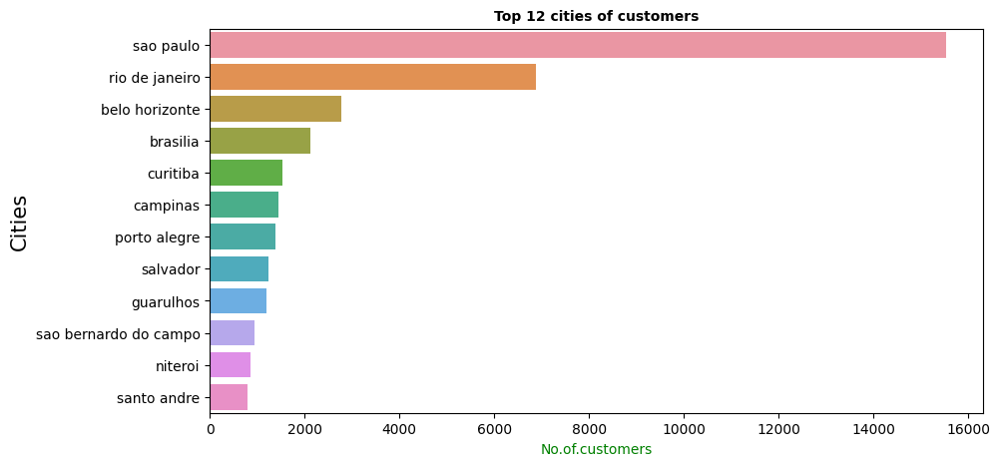

In [57]:
plt.figure(figsize=(10, 5))
sns.barplot(y = customers.customer_city.value_counts().index[:12], x = customers.customer_city.value_counts().values[:12])
plt.xlabel('No.of.customers',color='green',fontsize=10)
plt.ylabel('Cities',color='black',fontsize=15)
plt.title('Top 12 cities of customers',color='black',fontsize=10,fontweight='bold')
plt.show()

In [58]:
#The top city to which the customers belong is Sao Paulo, which account to 15.62% of customers.
#This is followed by Rio De Janeiro, which accounts to 6.92% of customers.
#The least city to which the customers belong to among the top 10 is from Sao Bernardo Do Campo, which accounts to just 0.94%.

In [59]:
customerState = customers.customer_state.value_counts(normalize=True)[:12] * 100
print('The top 10 cities from which customers come are: \n', customerState)

The top 10 cities from which customers come are: 
 SP    41.980672
RJ    12.924247
MG    11.700405
RS     5.496727
PR     5.073360
SC     3.657445
BA     3.399000
DF     2.152030
ES     2.044428
GO     2.031355
PE     1.661287
CE     1.343510
Name: customer_state, dtype: float64


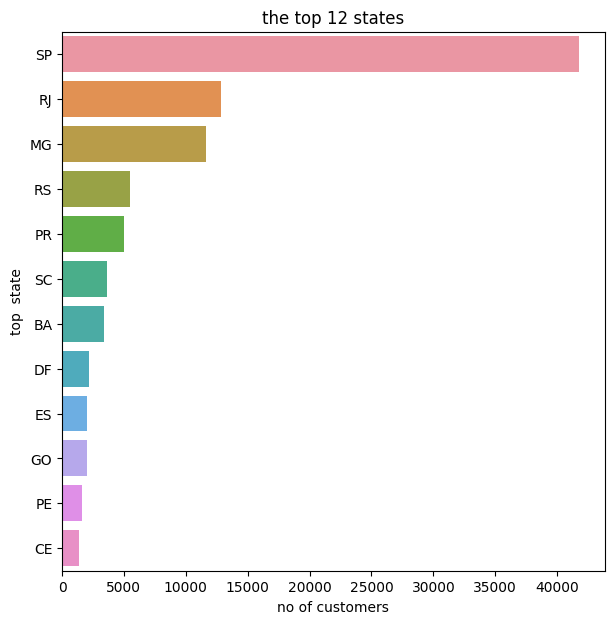

In [60]:
plt.figure(figsize=(7,7))
sns.barplot(y=customers.customer_state.value_counts().index[:12],x=customers.customer_state.value_counts().values[:12])
plt.xlabel("no of customers")
plt.ylabel("top  state")
plt.title("the top 12 states")
plt.show()

In [61]:
customers.customer_state.value_counts()

SP    41746
RJ    12852
MG    11635
RS     5466
PR     5045
SC     3637
BA     3380
DF     2140
ES     2033
GO     2020
PE     1652
CE     1336
PA      975
MT      907
MA      747
MS      715
PB      536
PI      495
RN      485
AL      413
SE      350
TO      280
RO      253
AM      148
AC       81
AP       68
RR       46
Name: customer_state, dtype: int64

In [62]:
#The top state to which customers belong is Sao Paulo, from where 41.98% of customers come from.
#This is followed by Rio De Janeiro, which accounts to 12.92% of customers.

In [63]:
#geo location values 

In [64]:
incorrectLocation = geolocation[(geolocation.geolocation_lat > 10) & (geolocation.geolocation_lng < -18)]
incorrectLocation

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,geolocation_city,geolocation_state
538512,29654,29.409252,-98.484121,santo antônio do canaã,ES
538557,29654,21.657547,-101.466766,santo antonio do canaa,ES
585242,35179,25.995203,-98.078544,santana do paraíso,MG
585260,35179,25.995245,-98.078533,santana do paraiso,MG


In [65]:
geolocation.drop(index = [538512, 538557, 585242, 585260], inplace = True)

In [66]:

#1. There are some records in the geolocation data for which the **geolocation latitude and longitude are pointing to locations in the sea**, which will lead to **inappropriate visualization of the geolocation**, when aggregation is applied to the fields. 
#2. So such records are alone **dropped** from the data. 
#3. Those records include **geolocation zipcodes 29654** and **35179**, for which the latitude and longitude values for certain records are incorrectly given.  
#4. **Latitude greater than 10 degrees** and **longitude lesser than -18 degrees** point to the sea. 

In [67]:
geolocationMean = geolocation.groupby('geolocation_zip_code_prefix', as_index = False).agg({'geolocation_lat'  : 'max',
                                                                                            'geolocation_lng'  : 'max'})
geolocationMean.head()

,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng
0,1001,-23.549292,-46.633559
1,1002,-23.544641,-46.633180
2,1003,-23.548901,-46.634862
3,1004,-23.549181,-46.634057
4,1005,-23.548758,-46.634768


In [68]:
customerDensity = customers.merge(geolocationMean, left_on = 'customer_zip_code_prefix', right_on = 'geolocation_zip_code_prefix', how = 'left')[['customer_unique_id', 'customer_zip_code_prefix', 'geolocation_lat', 'geolocation_lng']]
customerDensity.head()

,customer_unique_id,customer_zip_code_prefix,geolocation_lat,geolocation_lng
0,861eff4711a542e4b93843c6dd7febb0,14409,-20.468849,-47.382173
1,290c77bc529b7ac935b93aa66c333dc3,9790,-23.659702,-46.530264
2,060e732b5b29e8181a18229c7b0b2b5e,1151,-23.527788,-46.652997
3,259dac757896d24d7702b9acbbff3f3c,8775,-23.493944,-46.172406
4,345ecd01c38d18a9036ed96c73b8d066,13056,-22.961980,-47.125767


In [69]:
#ustomerDensity.to_csv('E:/archive_5/new_data for research/customerDensity.csv')

In [70]:
customerDensity.dropna(inplace = True)

In [71]:
#customerDensity.to_csv('E:/archive_5/new_data for research/customerDensity.csv')

In [72]:
#**observations:**
#1. The **customer zip codes are mapped with the geolocation zip code's latitude and longidute**, so as to visualise from which region our customers are more densly concentrated. 
#2. There are some **zip codes for which the latitude and longitude values are not available** in the data, so we **drop such records** for visualization. 

In [73]:
# create a map centered on your coordinates
m = folium.Map(location = customerDensity[['geolocation_lat', 'geolocation_lng']].values.tolist()[0], zoom_start = 13)

# create a list of coordinates
coordinates = customerDensity[['geolocation_lat', 'geolocation_lng']].values.tolist()

# create a heatmap layer with the list of coordinates
heat_layer = HeatMap(coordinates)

# add the heatmap layer to the map
heat_layer.add_to(m)

# display the map
m

In [74]:
# we clearly see most customer in brazil and europe 

In [75]:
orderItems.head(3)

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.9,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.9,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.0,17.87


In [76]:
orderItems.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 112650 entries, 0 to 112649
Data columns (total 7 columns):
 #   Column               Non-Null Count   Dtype  
---  ------               --------------   -----  
 0   order_id             112650 non-null  object 
 1   order_item_id        112650 non-null  int64  
 2   product_id           112650 non-null  object 
 3   seller_id            112650 non-null  object 
 4   shipping_limit_date  112650 non-null  object 
 5   price                112650 non-null  float64
 6   freight_value        112650 non-null  float64
dtypes: float64(2), int64(1), object(4)
memory usage: 6.0+ MB


In [77]:
orderItems['shipping_limit_date'] = pd.to_datetime(orderItems.shipping_limit_date)

In [78]:
orderItems.isna().sum() / len(orderItems) * 100

order_id               0.0
order_item_id          0.0
product_id             0.0
seller_id              0.0
shipping_limit_date    0.0
price                  0.0
freight_value          0.0
dtype: float64

In [79]:
orderItems.describe(exclude = np.number)

,order_id,product_id,seller_id,shipping_limit_date
count,112650,112650,112650,112650
unique,98666,32951,3095,93318
top,8272b63d03f5f79c56e9e4120aec44ef,aca2eb7d00ea1a7b8ebd4e68314663af,6560211a19b47992c3666cc44a7e94c0,2017-07-21 18:25:23
freq,21,527,2033,21
first,NaN,NaN,NaN,2016-09-19 00:15:34
last,NaN,NaN,NaN,2020-04-09 22:35:08


In [80]:
orderItems.describe()

,order_item_id,price,freight_value
count,112650.000000,112650.000000,112650.000000
mean,1.197834,120.653739,19.990320
std,0.705124,183.633928,15.806405
min,1.000000,0.850000,0.000000
25%,1.000000,39.900000,13.080000
50%,1.000000,74.990000,16.260000
75%,1.000000,134.900000,21.150000
max,21.000000,6735.000000,409.680000


In [81]:

#1. The order items dataframe consist of all the orders placed by the customers and the details of the products in that order. 
#2. There are **98666 unique orders** placed with the business and the order with **most number of items** is **8272b63d03f5f79c56e9e4120aec44ef**, which has **21 items in a single order**. 
#3. **32951 unique products** were ordered during the taken time period and the **most ordered product** is **aca2eb7d00ea1a7b8ebd4e68314663af**, which was ordered **527 times**. During the further stages of analysis, the product will be analysed mapping the ID with the products dataframe. 
#4. Similarly there are **3095 unique sellers** for the product and the **seller who sells most of the product** is **6560211a19b47992c3666cc44a7e94c0**. This data is also masked but we can combine this with geolocation and find which state or city the sellers belong to and do further analysis. 
#5. The **average price of the products** ordered is **120.65 Brazilian Reals**. The price of the products ordered is **highly right skewed**, as the **costliest product ordered** is priced at **6735 Brazilian Reals**. 
#6. Similarly the **freight value** of the order **on an average for each order** is **19.99 Brazilian Reals**, and the **expensive freight value** is **409.68 Brazilian Reals**. The particular orders whose freight values are higher will be studied later in the course of analysis. 

In [82]:
topOrders = orderItems.groupby('order_id', as_index = False).agg({'price'         : 'sum',
                                                                  'freight_value' : 'sum'})
topOrders['total_price'] = topOrders.price + topOrders.freight_value
top12Orders = topOrders.sort_values(by = 'total_price', ascending = False)[:12]
top12Orders

,order_id,price,freight_value,total_price
1455,03caa2c082116e1d31e67e9ae3700499,13440.00,224.08,13664.08
44467,736e1922ae60d0d6a89247b851902527,7160.00,114.88,7274.88
3130,0812eb902a67711a1cb742b3cdaa65ae,6735.00,194.31,6929.31
98298,fefacc66af859508bf1a7934eab1e97f,6729.00,193.21,6922.21
94439,f5136e38d1a14a4dbd87dff67da82701,6499.00,227.66,6726.66
17114,2cc9089445046817a7539d90805e6e5a,5934.60,146.94,6081.54
65046,a96610ab360d42a2e5335a3998b4718a,4799.00,151.34,4950.34
69531,b4c4b76c642808cbe472a32b86cddc95,4599.90,209.54,4809.44
9868,199af31afc78c699f0dbf71fb178d4d4,4690.00,74.34,4764.34
54353,8dbc85d1447242f3b127dda390d56e19,4590.00,91.78,4681.78


In [83]:
topSellers = orderItems.seller_id.value_counts()
topSellers.head()

6560211a19b47992c3666cc44a7e94c0    2033
4a3ca9315b744ce9f8e9374361493884    1987
1f50f920176fa81dab994f9023523100    1931
cc419e0650a3c5ba77189a1882b7556a    1775
da8622b14eb17ae2831f4ac5b9dab84a    1551
Name: seller_id, dtype: int64

In [84]:
topSellers = pd.DataFrame({'seller_id'     : topSellers.index,
                           'instances'     : topSellers.values})
topSellers.head()

,seller_id,instances
0,6560211a19b47992c3666cc44a7e94c0,2033
1,4a3ca9315b744ce9f8e9374361493884,1987
2,1f50f920176fa81dab994f9023523100,1931
3,cc419e0650a3c5ba77189a1882b7556a,1775
4,da8622b14eb17ae2831f4ac5b9dab84a,1551


In [85]:
topSellersOfOrders = topSellers.merge(sellers, on = 'seller_id').merge(geolocationMean, left_on = 'seller_zip_code_prefix', right_on = 'geolocation_zip_code_prefix').drop(columns = ['geolocation_zip_code_prefix'], axis = 1).sort_values('instances', ascending = False)
topSellersOfOrders.head()

,seller_id,instances,seller_zip_code_prefix,seller_city,seller_state,geolocation_lat,geolocation_lng
0,6560211a19b47992c3666cc44a7e94c0,2033,5849,sao paulo,SP,-23.649432,-46.753466
2,4a3ca9315b744ce9f8e9374361493884,1987,14940,ibitinga,SP,-21.734663,-48.809349
51,1f50f920176fa81dab994f9023523100,1931,15025,sao jose do rio preto,SP,-20.793902,-49.376768
55,cc419e0650a3c5ba77189a1882b7556a,1775,9015,santo andre,SP,-23.653394,-46.513267
58,da8622b14eb17ae2831f4ac5b9dab84a,1551,13405,piracicaba,SP,-22.692313,-47.653256


In [86]:
topSellersOfOrders.to_csv('E:/archive_5/new_data for research/topSellersOfOrders.csv')

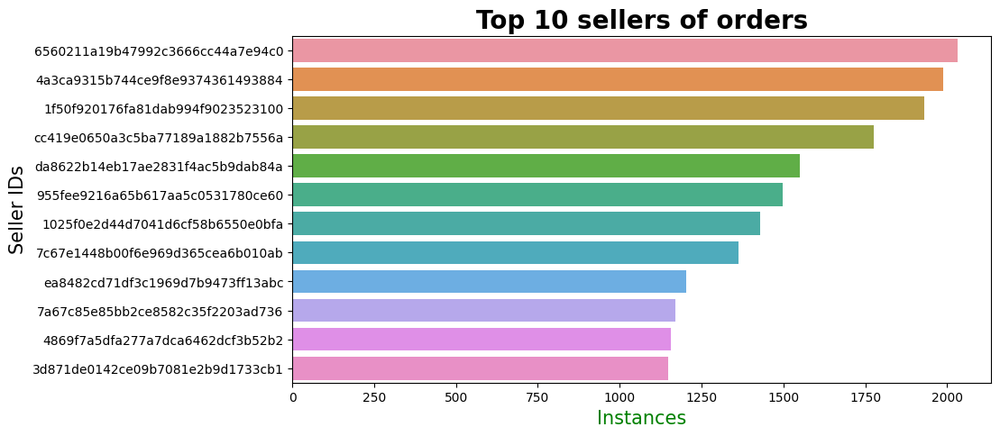

In [87]:
plt.figure(figsize=(10, 5))
sns.barplot(x = topSellers.instances[:12], y = topSellers.seller_id[:12])
plt.xlabel('Instances',color='green',fontsize=15)
plt.ylabel('Seller IDs',color='black',fontsize=15)
plt.title('Top 10 sellers of orders',color='black',fontsize=20,fontweight='bold')
plt.show()

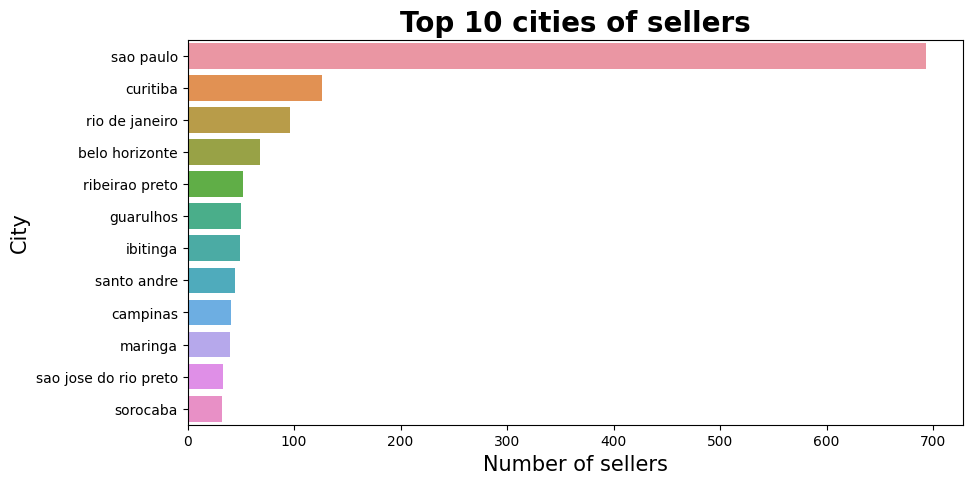

In [88]:
plt.figure(figsize=(10, 5))
sns.barplot(y = topSellersOfOrders.seller_city.value_counts().index[:12], x = topSellersOfOrders.seller_city.value_counts().values[:12])
plt.xlabel('Number of sellers',color='black',fontsize=15)
plt.ylabel('City',color='black',fontsize=15)
plt.title('Top 10 cities of sellers',color='black',fontsize=20,fontweight='bold')
plt.show()

In [89]:
#**Observations:**
#1. The **sellers of orders** are mostly from the **city** of **Sao Paulo**, followed by **Curitiba** and **Rio De Janeiro**. 
#2. The sellers of orders are mostly from the **state** of **Sao Paulo**. 
#3. This is obvious as most of the customers are from the same state and city of Sao Paulo. 

In [90]:
# create a map centered on your coordinates# create a map centered on your coordinates
m = folium.Map(location = topSellersOfOrders[['geolocation_lat', 'geolocation_lng']].values.tolist()[0], zoom_start = 13)

# create a list of coordinates
coordinates = topSellersOfOrders[['geolocation_lat', 'geolocation_lng']].values.tolist()

# create a heatmap layer with the list of coordinates
heat_layer = HeatMap(coordinates)

# add the heatmap layer to the map
heat_layer.add_to(m)

# display the map
m

In [91]:
#sellers are only in south america 

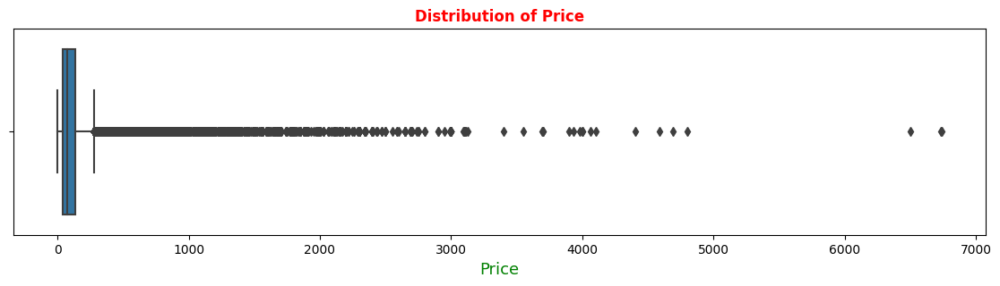

In [92]:
plt.figure(figsize=(14,3,))
sns.boxplot(x='price', data=orderItems)
plt.xlabel('Price',color='green',fontsize=13)
plt.title('Distribution of Price',color='red',fontsize=12,fontweight='bold')
plt.show()

In [93]:
#its right skewed 

In [94]:
Q1 = np.quantile(orderItems.price, 0.25)
Q3 = np.quantile(orderItems.price, 0.75)
IQR = Q3 - Q1
priceDistribution = orderItems[~((orderItems.price < Q1 - 1.5 * IQR) | (orderItems.price > Q3 + 1.5 * IQR))]
priceDistribution.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


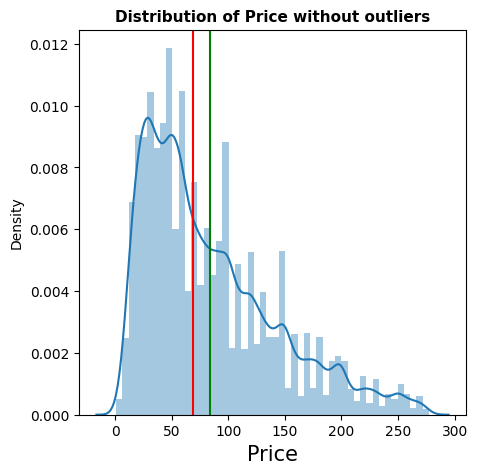

In [95]:
plt.figure(figsize=(5, 5))
sns.distplot(priceDistribution.price)
plt.axvline(priceDistribution.price.mean(), c = 'green')
plt.axvline(priceDistribution.price.median(), c = 'red')
plt.xlabel('Price',color='black',fontsize=15)
plt.title('Distribution of Price without outliers',color='black',fontsize=11,fontweight='bold')
plt.show()

In [96]:
priceDistribution.price.describe()

count    104223.000000
mean         83.974668
std          58.580002
min           0.850000
25%          38.500000
50%          69.000000
75%         118.990000
max         277.300000
Name: price, dtype: float64

In [97]:
#average price is 83

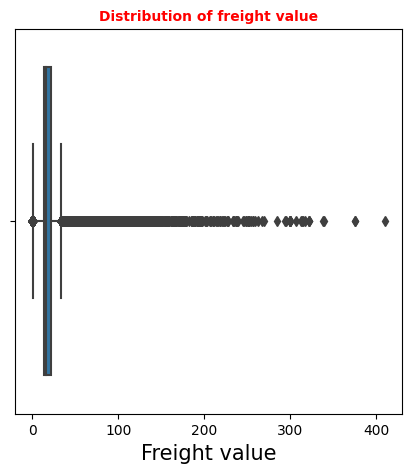

In [98]:
plt.figure(figsize=(5, 5))
sns.boxplot(x='freight_value', data=orderItems)
plt.xlabel('Freight value',color='black',fontsize=15)
plt.title('Distribution of freight value',color='red',fontsize=10,fontweight='bold')
plt.show()

In [99]:
#freight value alse righrt skewed 

In [100]:
Q1 = np.quantile(orderItems.freight_value, 0.25)
Q3 = np.quantile(orderItems.freight_value, 0.75)
IQR = Q3 - Q1
freightValueDistribution = orderItems[~((orderItems.freight_value < Q1 - 1.5 * IQR) | (orderItems.freight_value > Q3 + 1.5 * IQR))]
freightValueDistribution.head()

,order_id,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value
0,00010242fe8c5a6d1ba2dd792cb16214,1,4244733e06e7ecb4970a6e2683c13e61,48436dade18ac8b2bce089ec2a041202,2017-09-19 09:45:35,58.90,13.29
1,00018f77f2f0320c557190d7a144bdd3,1,e5f2d52b802189ee658865ca93d83a8f,dd7ddc04e1b6c2c614352b383efe2d36,2017-05-03 11:05:13,239.90,19.93
2,000229ec398224ef6ca0657da4fc703e,1,c777355d18b72b67abbeef9df44fd0fd,5b51032eddd242adc84c38acab88f23d,2018-01-18 14:48:30,199.00,17.87
3,00024acbcdf0a6daa1e931b038114c75,1,7634da152a4610f1595efa32f14722fc,9d7a1d34a5052409006425275ba1c2b4,2018-08-15 10:10:18,12.99,12.79
4,00042b26cf59d7ce69dfabb4e55b4fd9,1,ac6c3623068f30de03045865e4e10089,df560393f3a51e74553ab94004ba5c87,2017-02-13 13:57:51,199.90,18.14


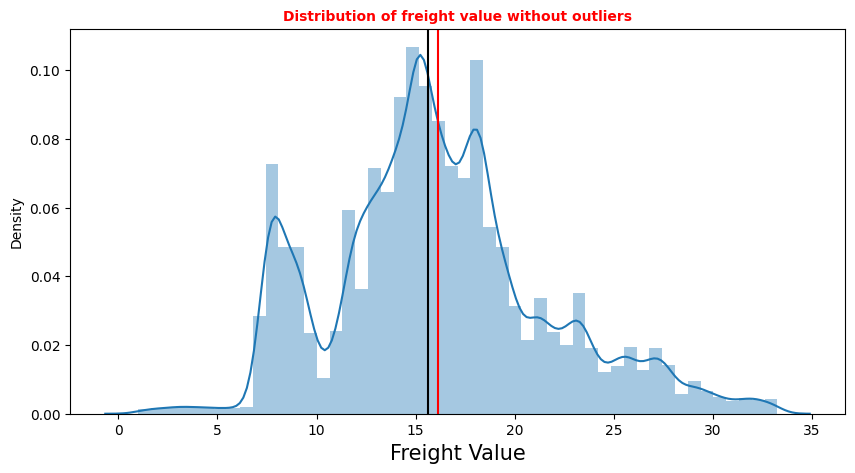

In [101]:
plt.figure(figsize=(10, 5))
sns.distplot(freightValueDistribution.freight_value)
plt.axvline(freightValueDistribution.freight_value.mean(), c = 'red')
plt.axvline(freightValueDistribution.freight_value.median(), c = 'black')
plt.xlabel('Freight Value',color='black',fontsize=15)
plt.title('Distribution of freight value without outliers',color='red',fontsize=10,fontweight='bold')
plt.show()

In [102]:
freightValueDistribution.freight_value.describe()

count    100516.000000
mean         16.125685
std           5.468564
min           0.980000
25%          12.760000
50%          15.620000
75%          18.800000
max          33.250000
Name: freight_value, dtype: float64

In [103]:
#**Observations:**
#1. The freight values of the products within the interquartile range are spread mostly between 5 and 25, which could be seen in the distribution plot. We could infer that such orders were within the continent of South America.
#2. The **average freight value** of the products is **16.12 Brazilian Reals**. 

In [104]:
payments.head(3)

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71


In [105]:
print('Number of Records:',payments.shape[0])
print('Number of Columns:',payments.shape[1])

Number of Records: 103886
Number of Columns: 5


In [106]:
payments.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 103886 entries, 0 to 103885
Data columns (total 5 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   order_id              103886 non-null  object 
 1   payment_sequential    103886 non-null  int64  
 2   payment_type          103886 non-null  object 
 3   payment_installments  103886 non-null  int64  
 4   payment_value         103886 non-null  float64
dtypes: float64(1), int64(2), object(2)
memory usage: 4.0+ MB


In [107]:
payments.isna().sum()


order_id                0
payment_sequential      0
payment_type            0
payment_installments    0
payment_value           0
dtype: int64

In [108]:
payments.describe(include = np.number)

,payment_sequential,payment_installments,payment_value
count,103886.000000,103886.000000,103886.000000
mean,1.092679,2.853349,154.100380
std,0.706584,2.687051,217.494064
min,1.000000,0.000000,0.000000
25%,1.000000,1.000000,56.790000
50%,1.000000,1.000000,100.000000
75%,1.000000,4.000000,171.837500
max,29.000000,24.000000,13664.080000


In [109]:
payments.describe(exclude = np.number)

,order_id,payment_type
count,103886,103886
unique,99440,5
top,fa65dad1b0e818e3ccc5cb0e39231352,credit_card
freq,29,76795


In [110]:
#there is no null value in this 
#majority payment is in credit card and 1 installment is high and max is 24 
#there is the 154 brazillian dollars 

In [111]:
payments.payment_type.value_counts(normalize = True) * 100

credit_card    73.922376
boleto         19.043952
voucher         5.558978
debit_card      1.471806
not_defined     0.002888
Name: payment_type, dtype: float64

In [112]:
payments.payment_installments.value_counts(normalize = True)[:12] * 100 

1     50.580444
2     11.948675
3     10.069692
4      6.832489
10     5.128699
5      5.043028
8      4.108350
6      3.773367
7      1.565177
9      0.619910
12     0.128025
15     0.071232
Name: payment_installments, dtype: float64

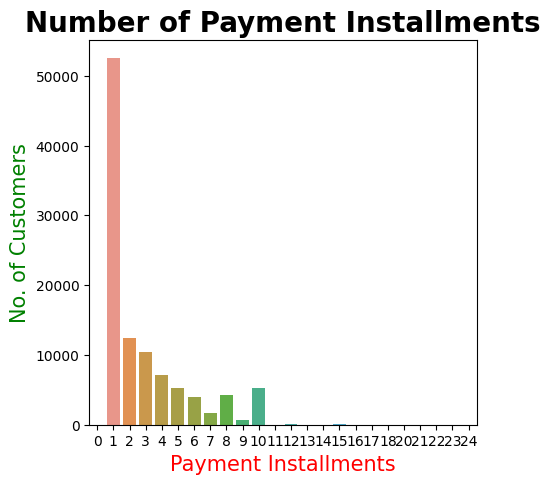

([<matplotlib.patches.Wedge at 0x1b413283940>,
 [Text(-0.02584652686655301, 1.099696302189353, '1'),
  Text(-1.002767471436311, -0.45216965646671514, '2'),
  Text(-0.4815869966523837, -0.9889762204701068, '3'),
  Text(0.08746686430344112, -1.0965170074599497, '4'),
  Text(0.48500462472622596, -0.9873046713118362, '10'),
  Text(0.7714372614749141, -0.7841457464069325, '5'),
  Text(0.9626300738964627, -0.5323000477457155, '8'),
  Text(1.0639607085799452, -0.279262619407004, '6'),
  Text(1.095703465773782, -0.09712834339842574, '7'),
  Text(1.099790016982387, -0.021492290382380996, '9')])

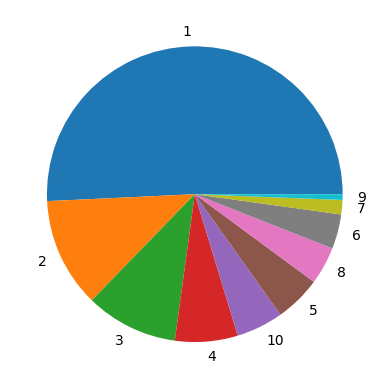

In [113]:
plt.figure(figsize=(5, 5))
sns.countplot(x='payment_installments',data=payments)
plt.title('Number of Payment Installments',fontweight='bold',fontsize=20)
plt.xlabel('Payment Installments',fontsize=15,color='red')
plt.ylabel('No. of Customers',fontsize=15,color='green')
plt.show()
plt.pie(payments.payment_installments.value_counts()[:10],labels=payments.payment_installments.value_counts()[:10].index)

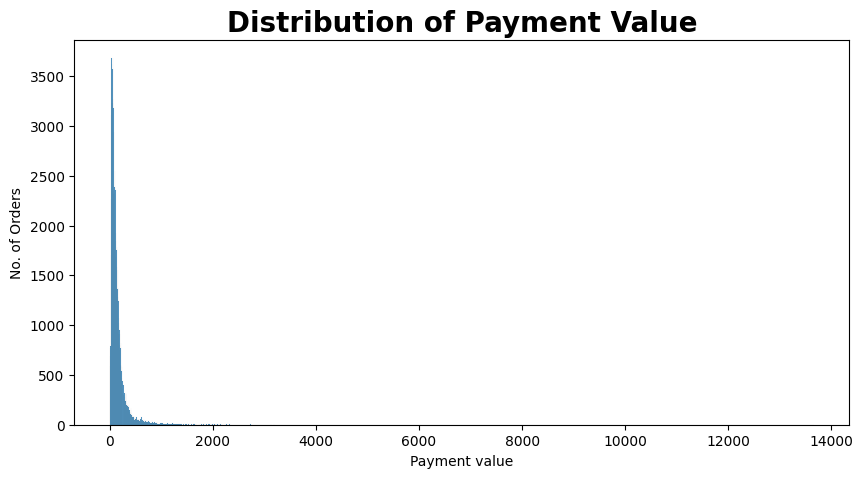

In [114]:
plt.figure(figsize=(10, 5))
sns.histplot(x='payment_value', data=payments)
plt.title('Distribution of Payment Value',fontweight='bold',fontsize=20)
plt.xlabel('Payment value',fontsize=10)
plt.ylabel('No. of Orders',fontsize=10)
plt.show()

In [115]:
#the data is right skewed 

In [116]:
Q1 = np.quantile(payments.payment_value, 0.25)
Q3 = np.quantile(payments.payment_value, 0.75)
IQR = Q3 - Q1
paymentValueDistribution = payments[~((payments.payment_value < Q1 - 1.5 * IQR) | (payments.payment_value > Q3 + 1.5 * IQR))]
paymentValueDistribution.head()

,order_id,payment_sequential,payment_type,payment_installments,payment_value
0,b81ef226f3fe1789b1e8b2acac839d17,1,credit_card,8,99.33
1,a9810da82917af2d9aefd1278f1dcfa0,1,credit_card,1,24.39
2,25e8ea4e93396b6fa0d3dd708e76c1bd,1,credit_card,1,65.71
3,ba78997921bbcdc1373bb41e913ab953,1,credit_card,8,107.78
4,42fdf880ba16b47b59251dd489d4441a,1,credit_card,2,128.45


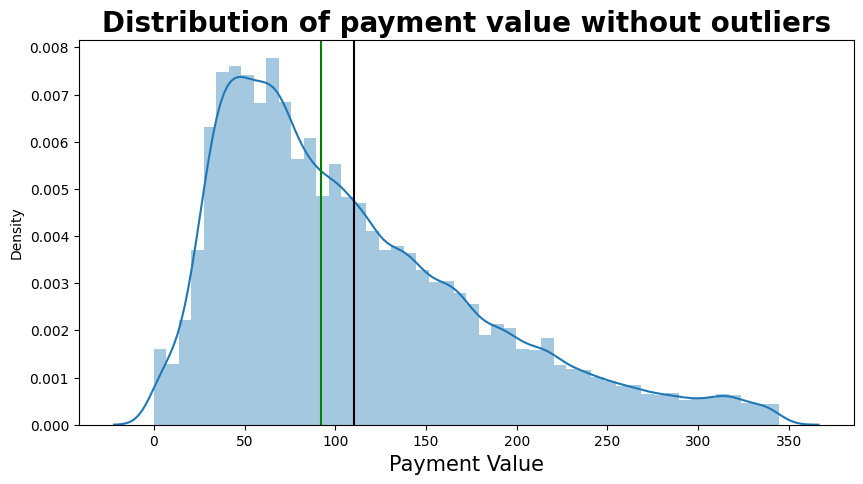

In [117]:
plt.figure(figsize=(10, 5))
sns.distplot(paymentValueDistribution.payment_value)
plt.axvline(paymentValueDistribution.payment_value.mean(), c = 'black')
plt.axvline(paymentValueDistribution.payment_value.median(), c = 'green')
plt.xlabel('Payment Value',color='black',fontsize=15)
plt.title('Distribution of payment value without outliers',color='black',fontsize=20,fontweight='bold')
plt.show()


In [118]:
paymentValueDistribution.payment_value.describe()

count    95905.000000
mean       110.062133
std         72.785054
min          0.000000
25%         54.000000
50%         92.200000
75%        150.580000
max        344.340000
Name: payment_value, dtype: float64

In [119]:
orderReviews.head(3)

,review_id,order_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,7bc2406110b926393aa56f80a40eba40,73fc7af87114b39712e6da79b0a377eb,4,NaN,NaN,2018-01-18 00:00:00,2018-01-18 21:46:59
1,80e641a11e56f04c1ad469d5645fdfde,a548910a1c6147796b98fdf73dbeba33,5,NaN,NaN,2018-03-10 00:00:00,2018-03-11 03:05:13
2,228ce5500dc1d8e020d8d1322874b6f0,f9e4b658b201a9f2ecdecbb34bed034b,5,NaN,NaN,2018-02-17 00:00:00,2018-02-18 14:36:24


In [120]:
print('Number of records:',orderReviews.shape[0])
print('number of columns:',orderReviews.shape[1])

Number of records: 99224
number of columns: 7


In [121]:
orderReviews['review_answer_timestamp'] = pd.to_datetime(orderReviews.review_answer_timestamp)
orderReviews['review_creation_date'] = pd.to_datetime(orderReviews.review_creation_date)

In [122]:
orderReviews.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 99224 entries, 0 to 99223
Data columns (total 7 columns):
 #   Column                   Non-Null Count  Dtype         
---  ------                   --------------  -----         
 0   review_id                99224 non-null  object        
 1   order_id                 99224 non-null  object        
 2   review_score             99224 non-null  int64         
 3   review_comment_title     11568 non-null  object        
 4   review_comment_message   40977 non-null  object        
 5   review_creation_date     99224 non-null  datetime64[ns]
 6   review_answer_timestamp  99224 non-null  datetime64[ns]
dtypes: datetime64[ns](2), int64(1), object(4)
memory usage: 5.3+ MB


In [123]:
orderReviews.isna().sum()[orderReviews.isna().sum() > 0] / len(orderReviews) * 100

review_comment_title      88.341530
review_comment_message    58.702532
dtype: float64

In [124]:
#89% of review title is null
#58 message are also null

In [125]:
reviewScore = orderReviews.review_score.value_counts(normalize = True) * 100
reviewScore

5    57.776344
4    19.291704
1    11.513344
3     8.242965
2     3.175643
Name: review_score, dtype: float64

In [126]:
#**Observations:**
#1. From the count plot of review score, we could clearly see that for about **57.77%** of orders, the **review score is 5**, which is the maximum review score. 
#2. From this we could clearly see that customers were mostly satisfied by the products and the business. 

In [127]:
reviewScoreAnalysis = orderReviews[['order_id', 'review_score']].merge(orders[['order_id', 'purchased_approved', 'approved_carrier', 'carrier_delivered', 'delivered_estimated', 'purchased_delivered']], on = 'order_id')
reviewScoreAnalysis.head()

,order_id,review_score,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered
0,73fc7af87114b39712e6da79b0a377eb,4,1030,1,4,15,6
1,a548910a1c6147796b98fdf73dbeba33,5,1400,2,7,4,9
2,f9e4b658b201a9f2ecdecbb34bed034b,5,2239,3,10,20,13
3,658677c97b385a9be170737859d3511b,5,846,0,9,19,10
4,8e6bfb81e283fa7e4f11123a3fb894f1,5,17358,5,12,8,18


In [128]:
ontimeDelivery_review = reviewScoreAnalysis[reviewScoreAnalysis.delivered_estimated > 0][['review_score', 'purchased_approved', 'approved_carrier', 'carrier_delivered', 'delivered_estimated', 'purchased_delivered']].mean()
lateDelivery_review = reviewScoreAnalysis[reviewScoreAnalysis.delivered_estimated < 0][['review_score', 'purchased_approved', 'approved_carrier', 'carrier_delivered', 'delivered_estimated', 'purchased_delivered']].mean()
comparision_review = pd.DataFrame([ontimeDelivery_review, lateDelivery_review]).T
comparision_review.rename(columns = {0 : 'on time delivery', 1 : 'late delivery'}, inplace = True)
comparision_review

,on time delivery,late delivery
review_score,4.295638,2.564497
purchased_approved,13698.077141,15812.153645
approved_carrier,2.111246,4.832007
carrier_delivered,7.373943,25.082170
delivered_estimated,12.892131,-9.768749
purchased_delivered,10.361973,30.946524


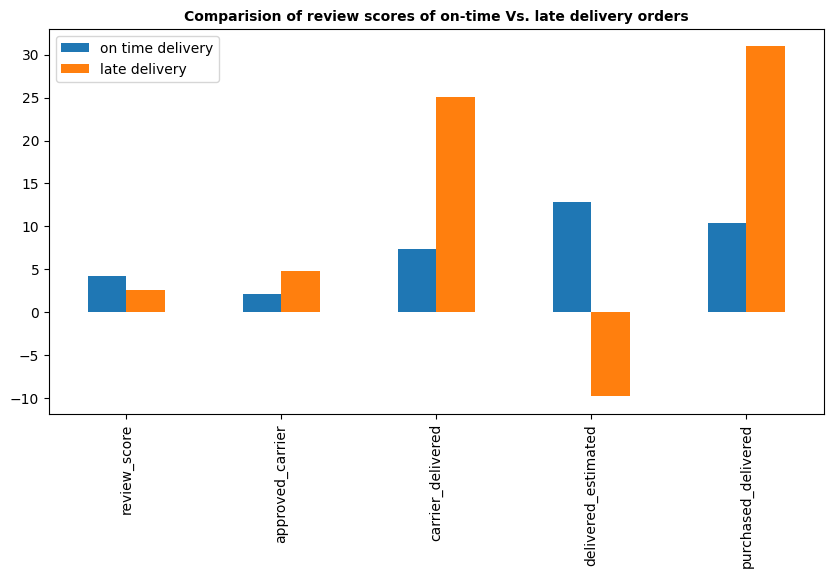

In [129]:
comparision_review.drop('purchased_approved').plot(kind = 'bar', figsize = (10, 5))
plt.title('Comparision of review scores of on-time Vs. late delivery orders',fontweight='bold',fontsize=10)
plt.show()

In [130]:
#**Observations:**
#1. The **review scores of late deliveries was 2.5** while for **on-time deliveries it was 4** on an average. 
#2. It took **25 days on an average** for the **orders to get delivered** to the customers for **late delivery orders**, while it took just **9 days** for **on-time delivery orders**.
#3. On an average, orders were delivered **14 days before the estimated date of delivery** for **on-time delivered orders**. 
#4. It also took **extra hour** for the **orders to get approved** for orders which were **delivered late**. 

In [131]:
topComments = orderReviews.review_comment_title.value_counts()[:10]
print('The top 10 comments by the customer are:',topComments,sep='\n')

The top 10 comments by the customer are:
Recomendo          423
recomendo          345
Bom                293
super recomendo    270
Excelente          248
Muito bom          247
Ótimo              240
Super recomendo    217
Ótimo              207
Otimo              174
Name: review_comment_title, dtype: int64


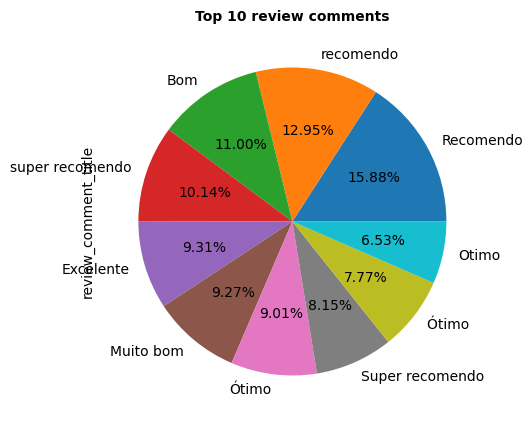

<Axes: >

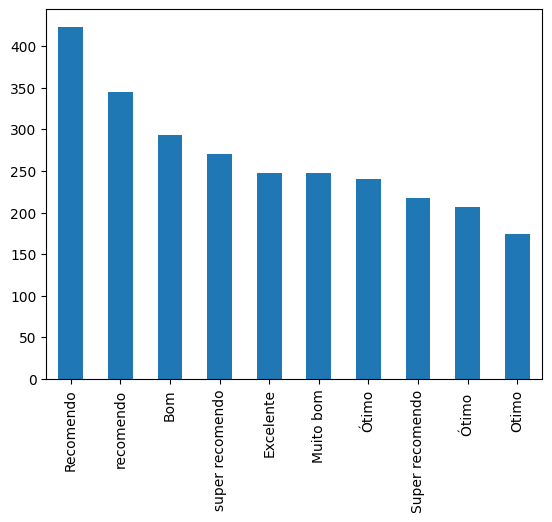

In [132]:
topComments.plot(kind="pie",autopct="%2.2f%%",figsize=(5, 5))
plt.title('Top 10 review comments',fontweight='bold',fontsize=10)
plt.show()
topComments.plot(kind='bar')

In [133]:
#**Observations:**
#1. The most occuring comment is **Recomendo**, **Bom**, **super recomendo** and **excelente**.
#2. **Recommedo** is about **11.93%**.
def partition(x):
    if x < 3:
        return 0
    return 1

orderReviewsAnalysis = orderReviews.copy()
orderReviewsAnalysis['review_score']=orderReviewsAnalysis['review_score'].map(lambda cw : partition(cw) ) 
    
# checking the review score now
orderReviewsAnalysis.review_score.value_counts()

1    84649
0    14575
Name: review_score, dtype: int64

Total Positive Reviews : 84649 , ( 85.3110134644844 %)
Total Negative Reviews : 14575 , ( 14.688986535515603 %)




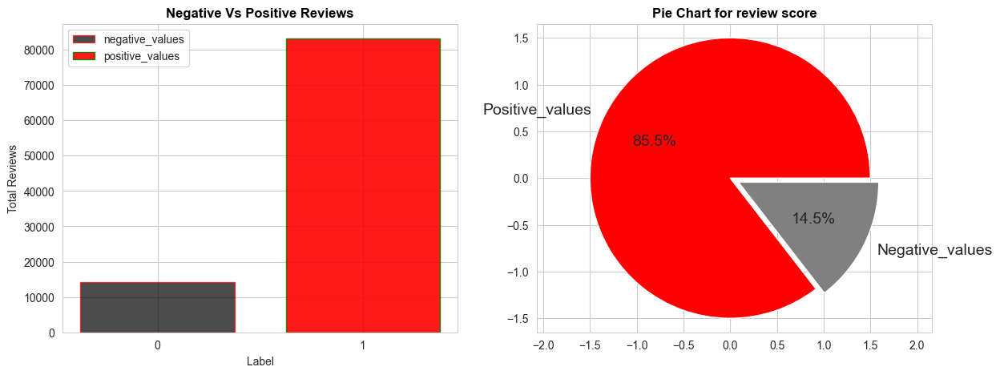

1    84649
0    14575
Name: review_score, dtype: int64

In [134]:
def partition(x):
    if x < 3:
        return 0
    return 1

orderReviewsAnalysis = orderReviews.copy()
orderReviewsAnalysis['review_score']=orderReviewsAnalysis['review_score'].map(lambda cw : partition(cw) ) 
    
# checking the review score now
#counting the review score with 1 and 0
y_value_counts = orderReviewsAnalysis.review_score.value_counts()

#calculating the percentage of each review type
print("Total Positive Reviews :", y_value_counts[1], ", (", (y_value_counts[1]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")
print("Total Negative Reviews :", y_value_counts[0], ", (", (y_value_counts[0]/(y_value_counts[1]+y_value_counts[0]))*100,"%)")
print('\n')

#plotting bar-plot and pie chart
%matplotlib inline
sns.set_style("whitegrid")
plt.figure(figsize=(14,5))
plt.subplot(1,2,1)
plt.ylabel('Total Reviews')
plt.xlabel('Label')
plt.title('Negative Vs Positive Reviews',color='black',fontweight='bold')
plt.xticks([10,10.20],['0','1'])
#creating bar plots
plt.bar(10,14112, color = 'black', width = 0.15,alpha=0.7,label='negative_values',edgecolor='red')
plt.bar(10.20,83143,color = 'red', width = 0.15,alpha=0.9,label='positive_values',edgecolor='green')
plt.legend()

plt.subplot(1,2,2)
labels = ['Positive_values','Negative_values']
sizes = [83143,14112]
explode = (0, 0.1)  # only "explode" the 2nd slice (i.e. 'Hogs')
color={'Red','grey'}
plt.pie(sizes,explode=explode ,colors=color,labels=labels, autopct='%1.1f%%',shadow=False, startangle=0,radius=1.5,labeldistance=1.1,textprops={'fontsize': 14},frame=True, )
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle.
plt.title('Pie Chart for review score',color='black',fontweight='bold')
plt.show()
orderReviewsAnalysis.review_score.value_counts()

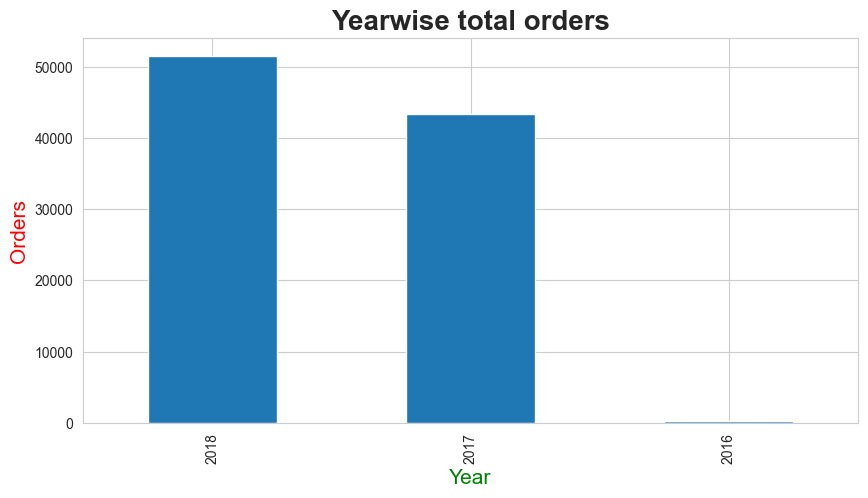

([<matplotlib.patches.Wedge at 0x1b426de2e50>,
 [Text(-0.14360726558501996, 1.0905856010745758, '2018'),
  Text(0.13412726252760046, -1.0917920486277835, '2017'),
  Text(1.0999584875157458, -0.009556450286236418, '2016')])

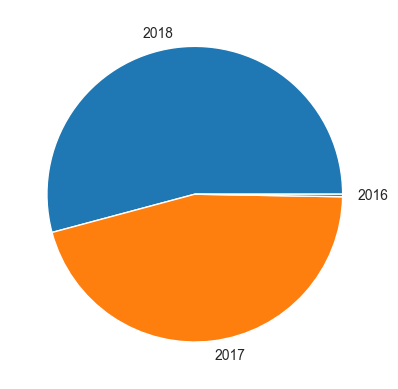

In [135]:
plt.figure(figsize=(10, 5))
pd.to_datetime(orders.order_purchase_timestamp).dt.year.value_counts().plot(kind='bar')
plt.title('Yearwise total orders',fontweight='bold',fontsize=20)
plt.xlabel('Year',fontsize=15,color='green')
plt.ylabel('Orders',fontsize=15,color='red')
plt.show()
plt.pie(orders.order_purchase_timestamp.dt.year.value_counts(),labels=orders.order_purchase_timestamp.dt.year.value_counts().index)


In [136]:
#2018 is the  most delivery taken 

In [137]:
def is_late_delivery(Days):
    if Days < 0:
        return 1
    else:
        return 0

In [138]:
def is_ontime_delivery(Days):
    if Days > 0:
        return 1
    else:
        return 0

In [139]:
year2016 = orders[orders.order_purchase_timestamp.dt.year == 2016].merge(orderItems, on = 'order_id')
year2016['Month'] = year2016.order_purchase_timestamp.dt.month
year2016['isLateDelivery'] = year2016['delivered_estimated'].apply(is_late_delivery)
year2016['isOnTimeDelivery'] = year2016['delivered_estimated'].apply(is_ontime_delivery)
revenue2016 = year2016.groupby('Month').agg({'order_id' : 'nunique', 'price' : 'sum', 'freight_value' : 'sum', 'purchased_approved' : 'mean', 'carrier_delivered' : 'mean', 'delivered_estimated' : 'mean', 'purchased_delivered' : 'mean', 'isLateDelivery' : 'sum', 'isOnTimeDelivery' : 'sum'})
revenue2016['total_revenue'] = revenue2016.price + revenue2016.freight_value
revenue2016['lateDeliveryRate'] = revenue2016['isLateDelivery'] / (revenue2016['isLateDelivery'] + revenue2016['isOnTimeDelivery'])
revenue2016

,order_id,price,freight_value,purchased_approved,carrier_delivered,delivered_estimated,purchased_delivered,isLateDelivery,isOnTimeDelivery,total_revenue,lateDeliveryRate
Month,,,,,,,,,,,
9,1,134.97,8.49,0.000000,1.00000,-37.000000,54.000000,3,0,143.46,1.000000
10,261,39738.17,6093.65,31555.386364,5.62013,35.798701,19.198052,3,304,45831.82,0.009772
12,1,10.90,8.72,890.000000,1.00000,21.000000,4.000000,0,1,19.62,0.000000


In [140]:
#revenue2016.to_csv('E:/research_data/revenue_2016/revenue_2016.csv')

In [141]:
year2017 = orders[orders.order_purchase_timestamp.dt.year == 2017].merge(orderItems, on = 'order_id')
year2017['Month'] = year2017.order_purchase_timestamp.dt.month
year2017['isLateDelivery'] = year2017['delivered_estimated'].apply(is_late_delivery)
year2017['isOnTimeDelivery'] = year2017['delivered_estimated'].apply(is_ontime_delivery)
revenue2017 = year2017.groupby('Month').agg({'order_id' : 'nunique', 'price' : 'sum', 'freight_value' : 'sum', 'purchased_approved' : 'mean', 'carrier_delivered' : 'mean', 'delivered_estimated' : 'mean', 'purchased_delivered' : 'mean', 'isLateDelivery' : 'sum', 'isOnTimeDelivery' : 'sum'})
revenue2017['total_revenue'] = revenue2017.price + revenue2017.freight_value
revenue2017['lateDeliveryRate'] = revenue2017['isLateDelivery'] / (revenue2017['isLateDelivery'] + revenue2017['isOnTimeDelivery'])
revenue2017

,order_id,price,freight_value,purchased_approved,carrier_delivered,delivered_estimated,purchased_delivered,isLateDelivery,isOnTimeDelivery,total_revenue,lateDeliveryRate
Month,,,,,,,,,,,
1,749,111609.71,15666.01,14288.871570,8.701427,26.734358,12.072448,26,885,127275.72,0.028540
2,1650,233716.91,36938.42,11139.714517,9.002698,18.165677,12.634107,62,1787,270655.33,0.033532
3,2545,359109.85,55107.03,6177.327807,9.364421,11.439724,12.427634,163,2717,414216.88,0.056597
4,2279,338839.16,49652.13,13151.595351,10.679669,12.108747,14.328211,191,2322,388491.29,0.076005
5,3531,488010.45,77258.11,13569.175069,7.937296,12.395535,10.899172,151,3810,565268.56,0.038122
6,3130,421310.97,68013.90,13466.575079,8.357450,11.719782,11.451622,130,3332,489324.87,0.037551
7,3841,478598.50,83898.01,13519.357536,7.850893,11.586578,11.021530,160,4175,562496.51,0.036909
8,4190,553928.41,90976.11,12527.191103,7.345447,12.344612,10.482038,151,4603,644904.52,0.031763
9,4137,604764.74,93400.02,12330.243381,8.105910,10.435077,11.404787,242,4414,698164.76,0.051976


In [142]:
#revenue2017.to_csv('E:/research_data/revenue_2016/revenue_2017.csv')

In [143]:
year2018 = orders[orders.order_purchase_timestamp.dt.year == 2018].merge(orderItems, on = 'order_id')
year2018['Month'] = year2018.order_purchase_timestamp.dt.month
year2018['isLateDelivery'] = year2018['delivered_estimated'].apply(is_late_delivery)
year2018['isOnTimeDelivery'] = year2018['delivered_estimated'].apply(is_ontime_delivery)
revenue2018 = year2018.groupby('Month').agg({'order_id' : 'nunique', 'price' : 'sum', 'freight_value' : 'sum', 'purchased_approved' : 'mean', 'carrier_delivered' : 'mean', 'delivered_estimated' : 'mean', 'purchased_delivered' : 'mean', 'isLateDelivery' : 'sum', 'isOnTimeDelivery' : 'sum'})
revenue2018['total_revenue'] = revenue2018.price + revenue2018.freight_value
revenue2018['lateDeliveryRate'] = revenue2018['isLateDelivery'] / (revenue2018['isLateDelivery'] + revenue2018['isOnTimeDelivery'])
revenue2018

,order_id,price,freight_value,purchased_approved,carrier_delivered,delivered_estimated,purchased_delivered,isLateDelivery,isOnTimeDelivery,total_revenue,lateDeliveryRate
Month,,,,,,,,,,,
1,7045,922192.60,152670.38,15841.367146,9.854841,12.010618,13.656090,525,7405,1074862.98,0.066204
2,6543,824207.87,139455.59,14366.830757,12.700693,7.361940,16.481210,1183,6173,963663.46,0.160821
3,7001,953311.25,167215.46,13605.120274,12.128759,5.799750,15.604741,1641,6190,1120526.71,0.209552
4,6409,923081.83,150642.10,17088.306233,8.035366,11.935772,11.014770,368,6948,1073723.93,0.050301
5,6681,966547.76,149446.94,14948.900233,8.282220,11.342262,10.878106,618,6980,1115994.70,0.081337
6,5976,840156.23,152896.15,12594.163708,6.197031,18.297293,8.667055,93,6771,993052.38,0.013549
7,5596,797173.38,146234.44,17851.038383,5.668773,10.189228,8.623914,294,5949,943407.82,0.047093
8,6265,828540.84,144748.47,14523.856960,4.817653,7.402441,7.262097,735,5908,973289.31,0.110643


In [144]:
#revenue2018.to_csv('E:/research_data/revenue_2016/revenue_2018.csv')

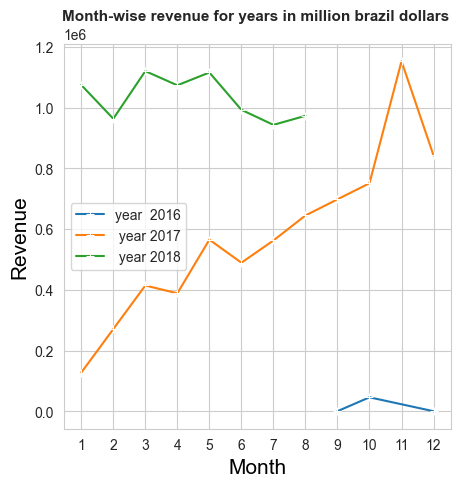

In [145]:
plt.figure(figsize=(5, 5))
sns.lineplot(y = revenue2016['total_revenue'], x = revenue2016.index, marker = '+', label = 'year  2016')
sns.lineplot(y = revenue2017['total_revenue'], x = revenue2017.index, marker = '+', label = ' year 2017')
sns.lineplot(y = revenue2018['total_revenue'], x = revenue2018.index, marker = '+', label = ' year 2018')
plt.title('Month-wise revenue for years in million brazil dollars ',fontweight='bold',fontsize=11)
plt.xlabel('Month',fontsize=15,color='black')
plt.ylabel('Revenue',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

In [146]:
#**Observations:**
#1. There are **not many records available for the year 2016**, so the revenue is also less. Therefore we consider only the records from the year 2017 to the available records upto August of 2018 for our analysis. 
#2. From the available data, it is clearly evident that the revenue grew constantly all throughout the year 2017, starting from **127K Brazilian Real** all the way upto **1.15M Brazilian Real** during the month of **November 2017**. 
#3. There was a dip in the revenue of around **310K Brazilian Real** in the month of **December 2017**. 
#4. The year **2018 saw a constant revenue flow** which was in the range of **966K - 1.13M Brazilian Real**.
#5. The revenue is in **correspondance with the number of orders placed**.

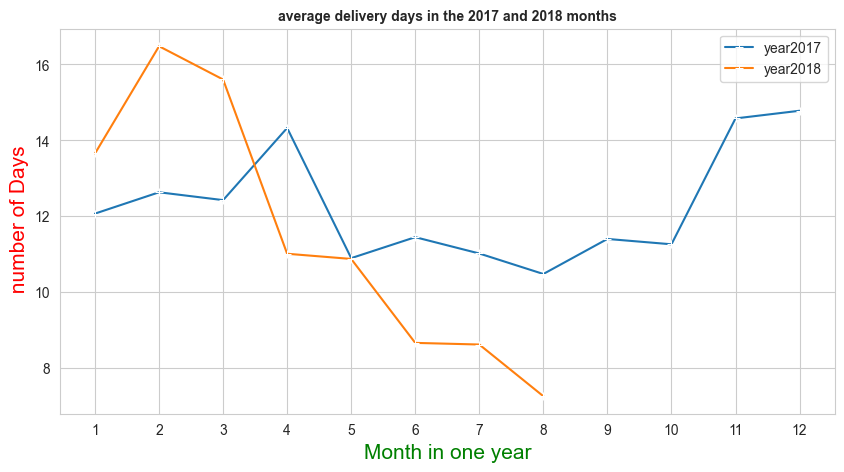

In [147]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2017['purchased_delivered'], x = revenue2017.index, marker = '+', label = 'year2017')
sns.lineplot(y = revenue2018['purchased_delivered'], x = revenue2018.index, marker = '+', label = 'year2018')
plt.title('average delivery days in the 2017 and 2018 months',fontweight='bold',fontsize=10)
plt.xlabel('Month in one year',fontsize=15,color='green')
plt.ylabel(' number of Days',fontsize=15,color='red')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

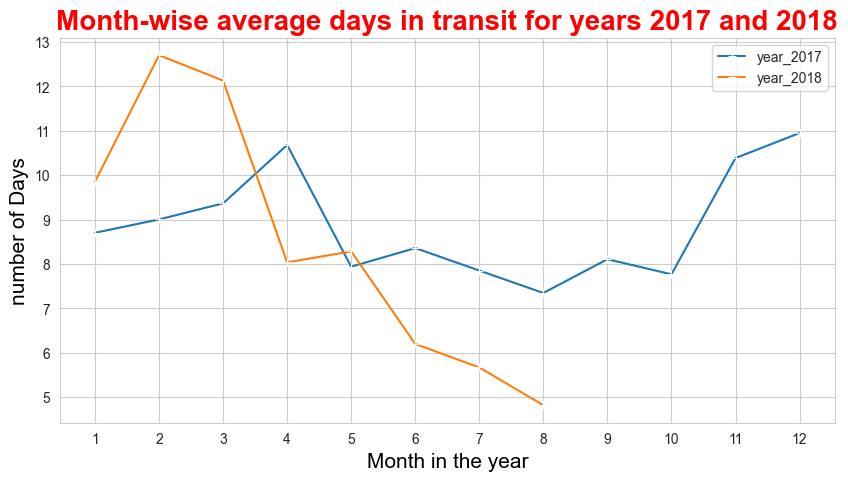

In [148]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2017['carrier_delivered'], x = revenue2017.index, marker = '+', label = 'year_2017')
sns.lineplot(y = revenue2018['carrier_delivered'], x = revenue2018.index, marker = '+', label = 'year_2018')
plt.title('Month-wise average days in transit for years 2017 and 2018',fontweight='bold',fontsize=20 ,color='red')
plt.xlabel('Month in the year',fontsize=15,color='black')
plt.ylabel('number of Days',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

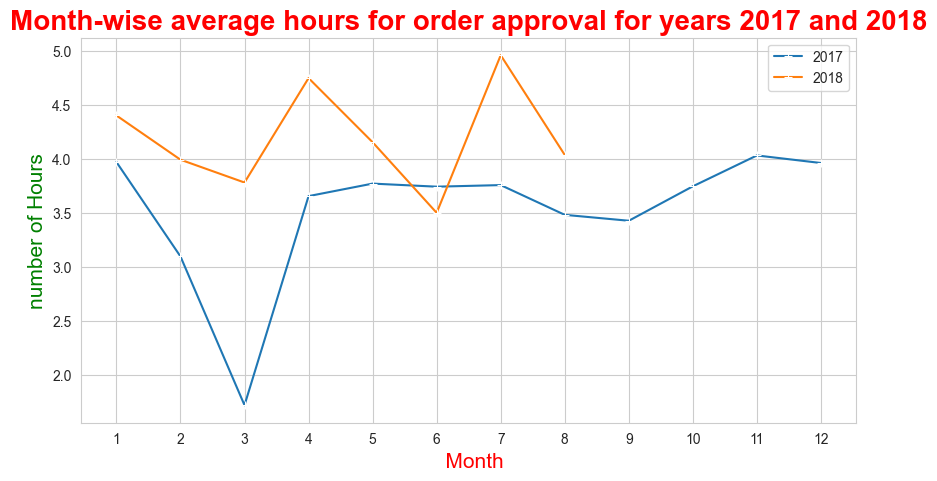

In [149]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2017['purchased_approved']/3600, x = revenue2017.index, marker = '+', label = '2017')
sns.lineplot(y = revenue2018['purchased_approved']/3600, x = revenue2018.index, marker = '+', label = '2018')
plt.title('Month-wise average hours for order approval for years 2017 and 2018',fontweight='bold',fontsize=20,color='red')
plt.xlabel('  Month',fontsize=15,color='red')
plt.ylabel('number of Hours',fontsize=15,color='green')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

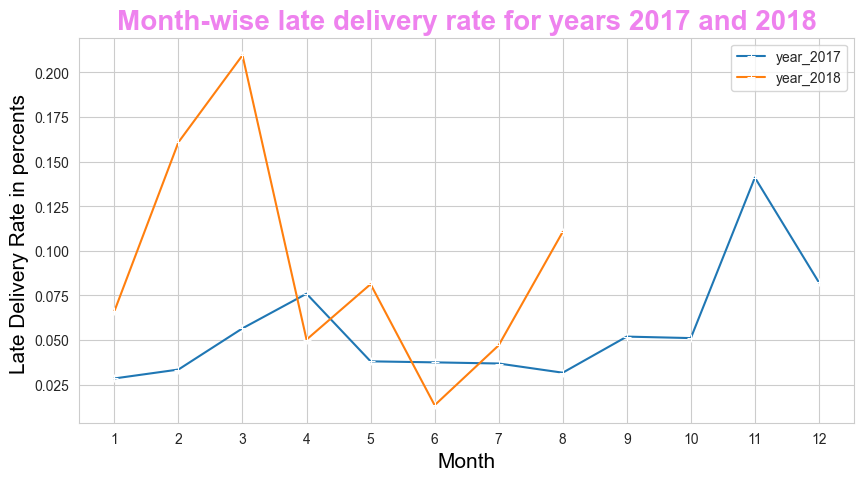

In [150]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = revenue2017['lateDeliveryRate'], x = revenue2017.index, marker = '+', label = 'year_2017')
sns.lineplot(y = revenue2018['lateDeliveryRate'], x = revenue2018.index, marker = '+', label = 'year_2018')
plt.title('Month-wise late delivery rate for years 2017 and 2018',fontweight='bold',fontsize=20,color='violet')
plt.xlabel('Month',fontsize=15,color='black')
plt.ylabel('Late Delivery Rate in percents ',fontsize=15,color='black')
plt.xticks([1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12])
plt.legend()
plt.show()

In [151]:
#**Observations:**
#1. The data for the **year 2016 was very less** so we do **not consider** it for interpretation. 
#2. The rise in revenue is in **accordance with the number of days** it took on an average for the **orders to get delivered** to the customers and also the **number of days** it took on an average **while the orders were in transit**.
#3. This clearly indicates that the **business thrives only based on the less number of days it takes for the order to get delivered**. 
#4. **Optimising the delivery days** would actually help in **increasing the revenue** and help sustain the business over years. 
#5. The graphs clearly indicate that on periods **when there were huge numbers of orders**, the **average delivery time was also comparatively high**, which indicates that proper measures should be undertaken to carter fast delivery of products. 
#6. The only viable method would be to **invest in transit and delivery partners**. 
#7. Hours taken for the order to get approved does not have any impact on the business.

In [152]:
#there is no known inventory management and no know target customer quarters2017.loc['Q1'] = [sum(revenue2017.total_revenue[:3])]


In [153]:
quarters2017 = pd.DataFrame(columns = ['total_revenue'])
quarters2018 = pd.DataFrame(columns = ['total_revenue'])
quarters2017.loc['Q1'] = [sum(revenue2017.total_revenue[:3])]
quarters2017.loc['Q2'] = [sum(revenue2017.total_revenue[3:6])]
quarters2017.loc['Q3'] = [sum(revenue2017.total_revenue[6:9])]
quarters2017.loc['Q4'] = [sum(revenue2017.total_revenue[9:])]
quarters2018.loc['Q1'] = [sum(revenue2018.total_revenue[:3])]
quarters2018.loc['Q2'] = [sum(revenue2018.total_revenue[3:6])]

In [154]:
quarters2017

,total_revenue
Q1,812147.93
Q2,1443084.72
Q3,1905565.79
Q4,2746723.25


In [155]:
quarters2018

,total_revenue
Q1,3159053.15
Q2,3182771.01


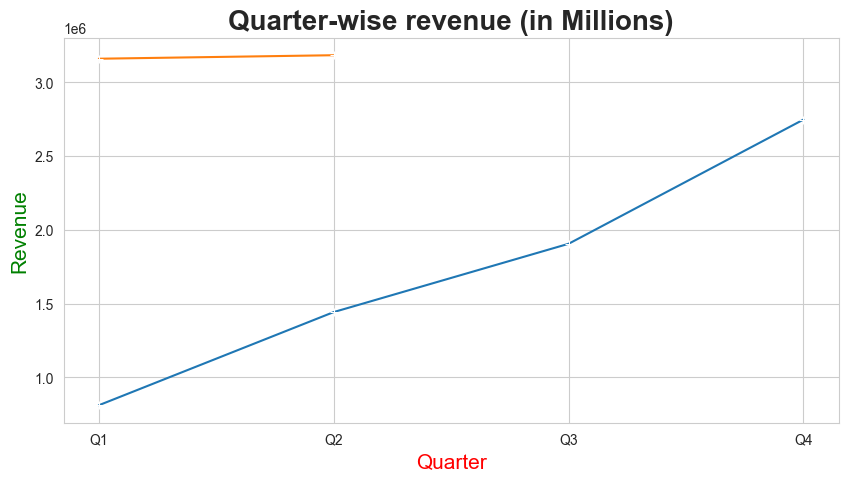

In [156]:
plt.figure(figsize=(10, 5))
sns.lineplot(y = quarters2017['total_revenue'], x = quarters2017.index, marker = '+')
sns.lineplot(y = quarters2018['total_revenue'], x = quarters2018.index, marker = '+')
plt.title('Quarter-wise revenue (in Millions)',fontweight='bold',fontsize=20)
plt.xlabel('Quarter',fontsize=15,color='red')
plt.ylabel('Revenue',fontsize=15,color='green')
plt.show()

In [157]:
november2017 = year2017[year2017.order_purchase_timestamp.dt.month == 11]
november2017['Date'] = november2017.order_purchase_timestamp.dt.day
november2017.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,Month,isLateDelivery,isOnTimeDelivery,Date
1,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.0,27.20,11,0,1,18
10,85ce859fd6dc634de8d2f1e290444043,059f7fc5719c7da6cbafe370971a8d70,delivered,2017-11-21 00:03:41,2017-11-21 00:14:22,2017-11-23 21:32:26,2017-11-27 18:28:00,2017-12-11,641,2,3,13,6,1,cce679660c66e6fbd5c8091dfd29e9cd,d2374cbcbb3ca4ab1086534108cc3ab7,2017-11-29 00:14:22,17.9,11.85,11,0,1,21
17,6ea2f835b4556291ffdc53fa0b3b95e8,c7340080e394356141681bd4c9b8fe31,delivered,2017-11-24 21:27:48,2017-11-25 00:21:09,2017-12-13 21:14:05,2017-12-28 18:59:23,2017-12-21,10401,18,14,-8,33,1,be021417a6acb56b9b50d3fd2714baa8,f5f46307a4d15880ca14fab4ad9dfc9b,2017-11-30 00:21:09,339.0,17.12,11,1,0,24
26,68873cf91053cd11e6b49a766db5af1a,4632eb5a8f175f6fe020520ae0c678f3,delivered,2017-11-30 22:02:15,2017-12-02 02:51:18,2017-12-04 22:07:01,2017-12-05 20:28:40,2017-12-18,17343,2,0,12,4,1,15a9e834e89eab39d973492882c658d6,a673821011d0cec28146ea42f5ab767f,2017-12-07 02:51:18,79.9,11.76,11,0,1,30
27,8f06cc6465925031568537b815f1198d,9916715c2ab6ee1710c9c32f0a534ad2,delivered,2017-11-15 11:31:41,2017-11-15 11:46:42,2017-11-16 22:03:00,2017-11-22 22:41:07,2017-12-05,901,1,6,12,7,1,12087840651e83b48206b82c213b76fd,5b925e1d006e9476d738aa200751b73b,2017-11-21 11:46:42,299.0,18.34,11,0,1,15


In [158]:
#noveember dataset

In [159]:
blackfriday = november2017[november2017['Date']==24]
blackfriday.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,Month,isLateDelivery,isOnTimeDelivery,Date
17,6ea2f835b4556291ffdc53fa0b3b95e8,c7340080e394356141681bd4c9b8fe31,delivered,2017-11-24 21:27:48,2017-11-25 00:21:09,2017-12-13 21:14:05,2017-12-28 18:59:23,2017-12-21,10401,18,14,-8,33,1,be021417a6acb56b9b50d3fd2714baa8,f5f46307a4d15880ca14fab4ad9dfc9b,2017-11-30 00:21:09,339.0,17.12,11,1,0,24
59,b01875821b8dcb6abc61776f0f971bce,818596f5b68adfe2c11498ebb6d39e02,delivered,2017-11-24 21:55:22,2017-11-25 01:31:43,2017-11-28 22:37:15,2017-12-01 21:11:40,2017-12-15,12981,3,2,13,6,1,a6ad77b15e566298a4e8ee2011ab1255,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-01 00:38:17,31.8,39.28,11,0,1,24
60,b01875821b8dcb6abc61776f0f971bce,818596f5b68adfe2c11498ebb6d39e02,delivered,2017-11-24 21:55:22,2017-11-25 01:31:43,2017-11-28 22:37:15,2017-12-01 21:11:40,2017-12-15,12981,3,2,13,6,2,a6ad77b15e566298a4e8ee2011ab1255,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-01 00:38:17,31.8,39.28,11,0,1,24
115,c263211bd219538f7c031591e87ef0d7,ed8c52327eecff596e141636d5b556d2,delivered,2017-11-24 16:56:46,2017-11-28 03:48:24,2017-12-08 23:28:26,2017-12-18 20:24:54,2017-12-19,39098,10,9,0,24,1,028b0b0277744a9eaa2c4f57c24dcb68,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-05 03:48:24,359.7,17.27,11,0,0,24
116,c263211bd219538f7c031591e87ef0d7,ed8c52327eecff596e141636d5b556d2,delivered,2017-11-24 16:56:46,2017-11-28 03:48:24,2017-12-08 23:28:26,2017-12-18 20:24:54,2017-12-19,39098,10,9,0,24,2,028b0b0277744a9eaa2c4f57c24dcb68,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-05 03:48:24,359.7,17.27,11,0,0,24


In [160]:
revenueNovember2017 = november2017.groupby('Date').agg({'order_id' : 'nunique', 'price' : 'sum', 'freight_value' : 'sum'})
revenueNovember2017['total_revenue'] = revenueNovember2017.price + revenueNovember2017.freight_value

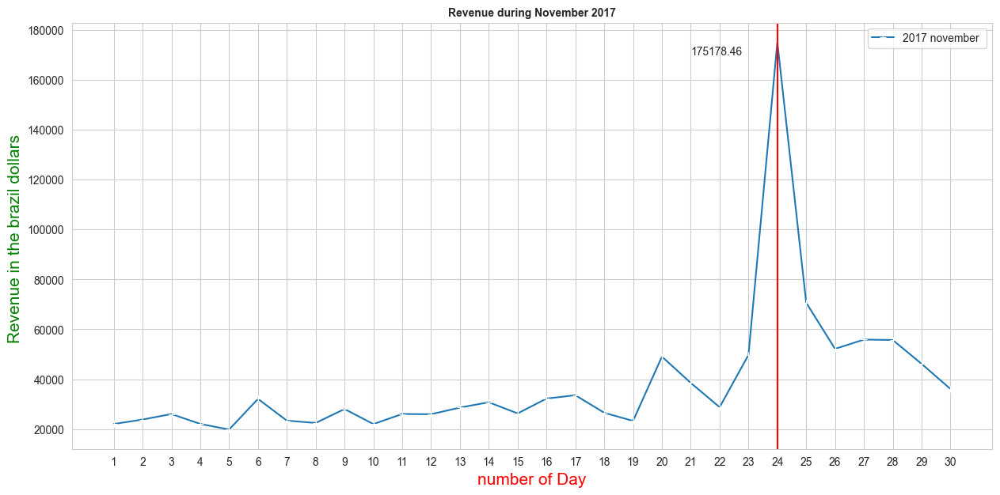

In [161]:
plt.figure(figsize=(15, 7))
sns.lineplot(y = revenueNovember2017['total_revenue'], x = revenueNovember2017.index, marker = '+', label = '2017 november ')
plt.title('Revenue during November 2017',fontweight='bold',fontsize=10)
plt.axvline(24, c = 'r')
plt.annotate(revenueNovember2017.loc[24].total_revenue, (21, 170000))
plt.xlabel('number of Day',fontsize=15,color='red')
plt.ylabel('Revenue in the brazil dollars ',fontsize=15,color='green')
plt.xticks(range(1, 31))
plt.legend()
plt.show()

In [162]:
#**Observations:**
#1. **Black Friday Sale** fell on **24th of November** during the year **2017**, during which the highest number of orders, **1147 orders were placed**. 
#2. This generated the **maximum revenue for a single day**, which was around **175K Brazilian Real**.
#. During the further sales in later years, this should be tapped in to increase the revenue and compare with other players in the same industry.
#4. The **peak and trought seen in the revenue** during the months of November and December corresponds to Black Friday Sale, and the dip in sales is not necessarily due to any specific reasons. This is said because the December's revenue is still higher than that of November's. So the **trought is not due to any wrongdoings in the business**. 

In [163]:
def deliveryType(Date):
    if Date < 0:
        return 'Late'
    else:
        return 'OnTime'

In [164]:
blackFriday = november2017[november2017.Date == 24]
blackFriday['Delivery'] = blackFriday['delivered_estimated'].apply(deliveryType)
blackFriday.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,Month,isLateDelivery,isOnTimeDelivery,Date,Delivery
17,6ea2f835b4556291ffdc53fa0b3b95e8,c7340080e394356141681bd4c9b8fe31,delivered,2017-11-24 21:27:48,2017-11-25 00:21:09,2017-12-13 21:14:05,2017-12-28 18:59:23,2017-12-21,10401,18,14,-8,33,1,be021417a6acb56b9b50d3fd2714baa8,f5f46307a4d15880ca14fab4ad9dfc9b,2017-11-30 00:21:09,339.0,17.12,11,1,0,24,Late
59,b01875821b8dcb6abc61776f0f971bce,818596f5b68adfe2c11498ebb6d39e02,delivered,2017-11-24 21:55:22,2017-11-25 01:31:43,2017-11-28 22:37:15,2017-12-01 21:11:40,2017-12-15,12981,3,2,13,6,1,a6ad77b15e566298a4e8ee2011ab1255,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-01 00:38:17,31.8,39.28,11,0,1,24,OnTime
60,b01875821b8dcb6abc61776f0f971bce,818596f5b68adfe2c11498ebb6d39e02,delivered,2017-11-24 21:55:22,2017-11-25 01:31:43,2017-11-28 22:37:15,2017-12-01 21:11:40,2017-12-15,12981,3,2,13,6,2,a6ad77b15e566298a4e8ee2011ab1255,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-01 00:38:17,31.8,39.28,11,0,1,24,OnTime
115,c263211bd219538f7c031591e87ef0d7,ed8c52327eecff596e141636d5b556d2,delivered,2017-11-24 16:56:46,2017-11-28 03:48:24,2017-12-08 23:28:26,2017-12-18 20:24:54,2017-12-19,39098,10,9,0,24,1,028b0b0277744a9eaa2c4f57c24dcb68,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-05 03:48:24,359.7,17.27,11,0,0,24,OnTime
116,c263211bd219538f7c031591e87ef0d7,ed8c52327eecff596e141636d5b556d2,delivered,2017-11-24 16:56:46,2017-11-28 03:48:24,2017-12-08 23:28:26,2017-12-18 20:24:54,2017-12-19,39098,10,9,0,24,2,028b0b0277744a9eaa2c4f57c24dcb68,1025f0e2d44d7041d6cf58b6550e0bfa,2017-12-05 03:48:24,359.7,17.27,11,0,0,24,OnTime


In [165]:
blackFriday.order_id.nunique()

1147

In [166]:
lateDeliveringSellers_blackFriday = blackFriday[blackFriday.delivered_estimated < 0]['seller_id']
lateDeliveringSellers_blackFriday.value_counts().to_frame()

,seller_id
8160255418d5aaa7dbdc9f4c64ebda44,22
1f50f920176fa81dab994f9023523100,18
1025f0e2d44d7041d6cf58b6550e0bfa,18
4a3ca9315b744ce9f8e9374361493884,12
54965bbe3e4f07ae045b90b0b8541f52,11
...,...
1da3aeb70d7989d1e6d9b0e887f97c23,1
7b07b3c7487f0ea825fc6df75abd658b,1
c864036feaab8c1659f65ea4faebe1da,1
712e6ed8aa4aa1fa65dab41fed5737e4,1


In [167]:
print('Number of sellers who delivered late during black friday: ', blackFriday[blackFriday.delivered_estimated < 0]['seller_id'].nunique())

Number of sellers who delivered late during black friday:  114


In [168]:
averageLateDeliveringSellers = november2017[november2017.delivered_estimated < 0].groupby('Date').agg({'seller_id' : 'nunique'}).drop(24).seller_id.mean()
print('Average late delivering sellers over the months: ', round(averageLateDeliveringSellers))

Average late delivering sellers over the months:  22


In [169]:
lateDeliveringSellers_blackFriday = blackFriday[blackFriday.delivered_estimated < 0]['seller_id']
lateDeliveringSellers_blackFriday.value_counts()[lateDeliveringSellers_blackFriday.value_counts() > 5]

8160255418d5aaa7dbdc9f4c64ebda44    22
1f50f920176fa81dab994f9023523100    18
1025f0e2d44d7041d6cf58b6550e0bfa    18
4a3ca9315b744ce9f8e9374361493884    12
54965bbe3e4f07ae045b90b0b8541f52    11
ea8482cd71df3c1969d7b9473ff13abc    10
Name: seller_id, dtype: int64

In [170]:
#as the number of order increased we clearly see the late delivery 


In [171]:
ontimeDelivery_bf = blackFriday[blackFriday.delivered_estimated > 0][['purchased_approved', 'approved_carrier', 'carrier_delivered', 'delivered_estimated', 'purchased_delivered']].mean()
lateDelivery_bf = blackFriday[blackFriday.delivered_estimated < 0][['purchased_approved', 'approved_carrier', 'carrier_delivered', 'delivered_estimated', 'purchased_delivered']].mean()
comparision = pd.DataFrame([ontimeDelivery_bf, lateDelivery_bf]).T
comparision.rename(columns = {0 : 'on time delivery', 1 : 'late delivery'}, inplace = True)
comparision

,on time delivery,late delivery
purchased_approved,15799.711174,18235.150000
approved_carrier,3.282197,7.869231
carrier_delivered,8.235795,23.346154
delivered_estimated,9.737689,-9.788462
purchased_delivered,12.554924,32.380769


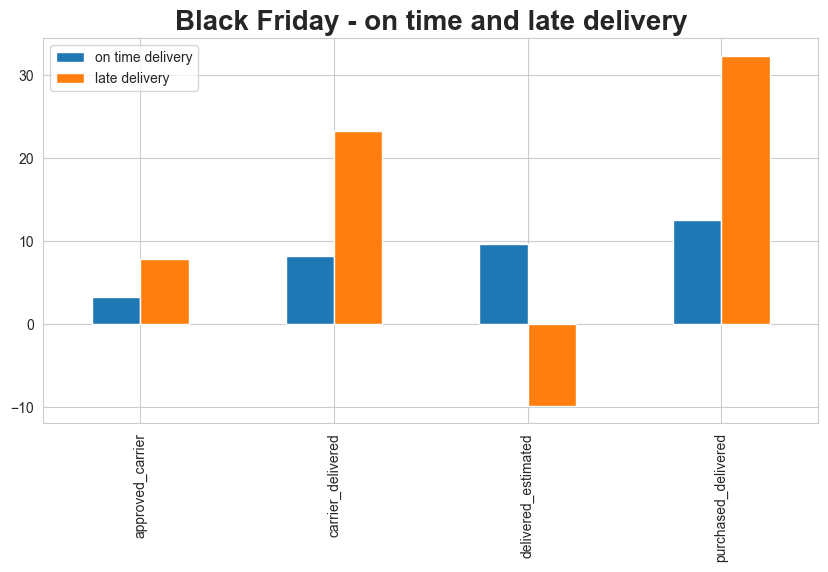

In [172]:
comparision.drop('purchased_approved').plot(kind = 'bar', figsize = (10, 5))
plt.title('Black Friday - on time and late delivery',fontweight='bold',fontsize=20)
plt.show()

In [173]:
blackFriday.Delivery.value_counts(normalize = True) * 100

OnTime    80.669145
Late      19.330855
Name: Delivery, dtype: float64

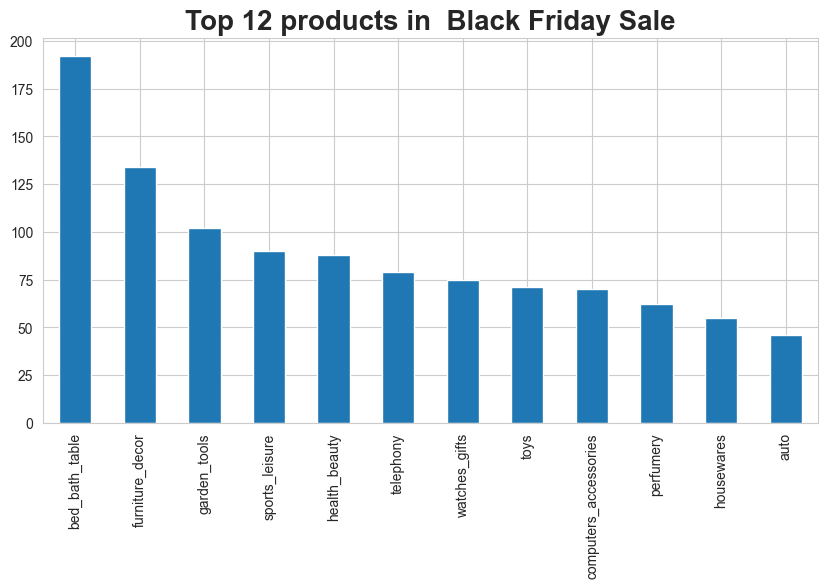

([<matplotlib.patches.Wedge at 0x1b429fe5040>,
 [Text(0.9279244445921351, 0.5907251688631338, 'bed_bath_table'),
  Text(0.04545750416889092, 1.0990603328820194, 'furniture_decor'),
  Text(-0.6704961175215431, 0.8720292176232041, 'garden_tools'),
  Text(-1.033908494805831, 0.3755439047146697, 'sports_leisure'),
  Text(-1.0827834867576496, -0.19385541211157098, 'health_beauty'),
  Text(-0.8620359551941873, -0.683296430513467, 'telephony'),
  Text(-0.47434386920530797, -0.9924706009486316, 'watches_gifts'),
  Text(-0.016238938344316375, -1.0998801284146604, 'toys'),
  Text(0.4299370313984402, -1.0124989624845533, 'computers_accessories'),
  Text(0.782397023066031, -0.7732107722331685, 'perfumery'),
  Text(0.9980034965811063, -0.46258947330423106, 'housewares'),
  Text(1.0898695779589649, -0.14894395939261104, 'auto')],
 [Text(0.5061406061411645, 0.32221372847080015, '18.05%'),
  Text(0.0247950022739405, 0.5994874542992833, '12.59%'),
  Text(-0.36572515501175074, 0.47565230052174756, '9.59

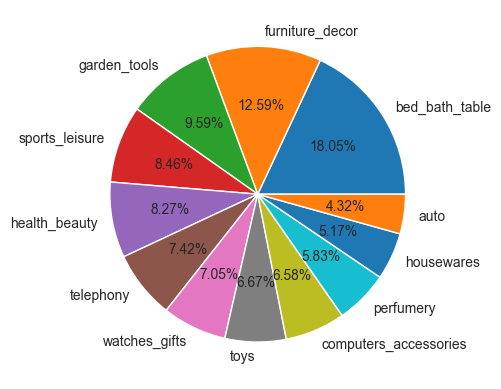

In [174]:
blackFridayProducts = blackFriday.merge(products[['product_id', 'product_category_name']], on = 'product_id').merge(productCategoryTranslation, on = 'product_category_name')
plt.figure(figsize = (10, 5))
blackFridayProducts.product_category_name_english.value_counts()[:12].plot(kind = 'bar')
plt.title('Top 12 products in  Black Friday Sale',fontweight='bold',fontsize=20)
plt.show()
plt.pie(blackFridayProducts.product_category_name_english.value_counts()[:12], autopct = '%0.2f%%', labels = blackFridayProducts.product_category_name_english.value_counts()[:12].index)

In [175]:
def is_late(Days):
    if Days < -10:
        return 'delayed by more than 10 days'
    elif Days < -5 and Days >= -10:
        return 'delayed between 6 to 10 days'
    elif Days < 0 and Days >= -5:
        return 'delayed delayed between  1 to 5 days'
    else:
        return 'on time'

In [176]:
lateDelivery = orders[['order_id', 'order_purchase_timestamp', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'delivered_estimated']].merge(orderReviews[['order_id', 'review_score']], on = 'order_id', how = 'left')
lateDelivery['is_late'] = lateDelivery['delivered_estimated'].apply(is_late)
lateDelivery.head()

,order_id,order_purchase_timestamp,order_delivered_customer_date,order_estimated_delivery_date,delivered_estimated,review_score,is_late
0,e481f51cbdc54678b7cc49136f2d6af7,2017-10-02 10:56:33,2017-10-10 21:25:13,2017-10-18,7,4.0,on time
1,53cdb2fc8bc7dce0b6741e2150273451,2018-07-24 20:41:37,2018-08-07 15:27:45,2018-08-13,5,4.0,on time
2,47770eb9100c2d0c44946d9cf07ec65d,2018-08-08 08:38:49,2018-08-17 18:06:29,2018-09-04,17,5.0,on time
3,949d5b44dbf5de918fe9c16f97b45f8a,2017-11-18 19:28:06,2017-12-02 00:28:42,2017-12-15,12,5.0,on time
4,ad21c59c0840e6cb83a9ceb5573f8159,2018-02-13 21:18:39,2018-02-16 18:17:02,2018-02-26,9,5.0,on time


In [177]:
lateDelivery.is_late.value_counts()

on time                                 87800
delayed delayed between  1 to 5 days     3611
delayed by more than 10 days             2308
delayed between 6 to 10 days             1913
Name: is_late, dtype: int64

In [178]:
lateDelivery.is_late.value_counts(normalize = True) * 100

on time                                 91.810273
delayed delayed between  1 to 5 days     3.775933
delayed by more than 10 days             2.413418
delayed between 6 to 10 days             2.000376
Name: is_late, dtype: float64

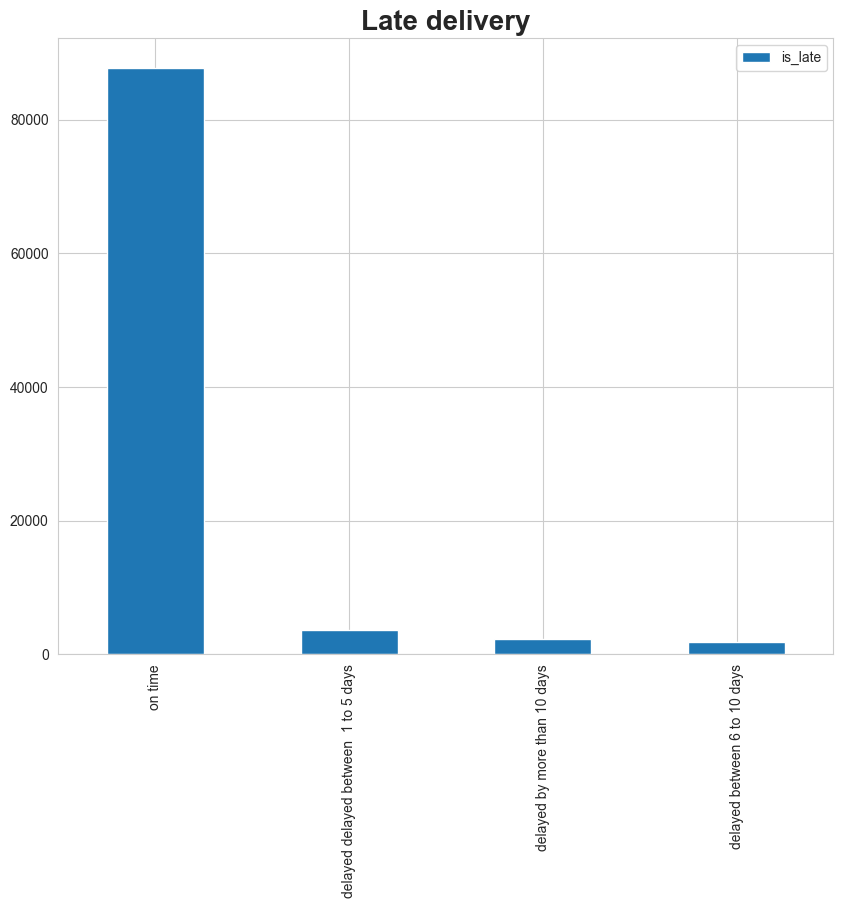

In [179]:
plt.figure(figsize = (10, 8))
lateDelivery.is_late.value_counts().plot(kind='bar')
plt.title('Late delivery',fontweight='bold',fontsize=20)
plt.legend()
plt.show()

In [180]:
reviewScore_lateDelivery = lateDelivery.groupby('is_late').agg({'review_score' : 'mean'})
reviewScore_lateDelivery

,review_score
is_late,
delayed between 6 to 10 days,1.894737
delayed by more than 10 days,1.699241
delayed delayed between 1 to 5 days,3.458474
on time,4.293223


In [181]:
#there will be the strong correlation between delivery and review score

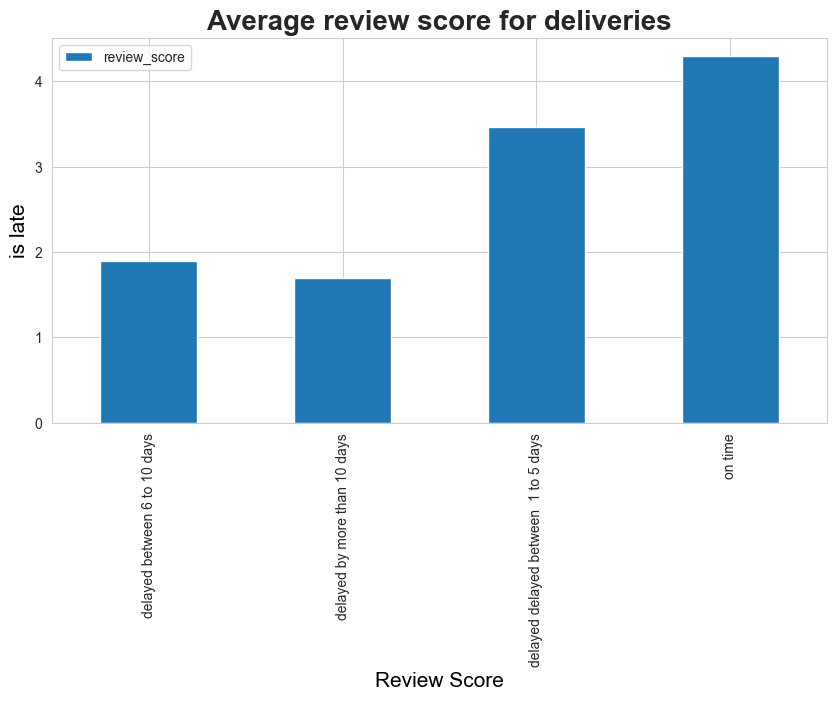

In [182]:
reviewScore_lateDelivery.plot(kind = 'bar', figsize = (10, 5))
plt.title('Average review score for deliveries',fontweight='bold',fontsize=20)
plt.xlabel('Review Score',fontsize=15,color='black')
plt.ylabel('is late',fontsize=15,color='black')
plt.show()


In [183]:
lateDeliveringSellers = lateDelivery[lateDelivery.is_late != 'on time'].merge(orderItems[['seller_id', 'product_id', 'order_id', 'product_id']], on = 'order_id', how = 'left')
lateDeliveringSellersAnalysis = lateDeliveringSellers.groupby('seller_id').agg({'order_id' : 'count', 'delivered_estimated' : 'mean'}).sort_values(by = 'order_id', ascending = False)[:11]
lateDeliveringSellersAnalysis['delivered_estimated'] = lateDeliveringSellersAnalysis['delivered_estimated'].round()
lateDeliveringSellersAnalysis

,order_id,delivered_estimated
seller_id,,
4a3ca9315b744ce9f8e9374361493884,216,-11.0
1f50f920176fa81dab994f9023523100,184,-10.0
4869f7a5dfa277a7dca6462dcf3b52b2,133,-9.0
7c67e1448b00f6e969d365cea6b010ab,131,-11.0
1025f0e2d44d7041d6cf58b6550e0bfa,130,-6.0
6560211a19b47992c3666cc44a7e94c0,123,-7.0
ea8482cd71df3c1969d7b9473ff13abc,123,-8.0
955fee9216a65b617aa5c0531780ce60,119,-7.0
da8622b14eb17ae2831f4ac5b9dab84a,114,-10.0


In [184]:
def weekend(dayName):
    if dayName == 'Saturday' or dayName == 'Sunday':
        return 'weekend'
    else:
        return 'weekday'

In [185]:
ordersTimeAnalysis = orders.copy().merge(orderItems, on = 'order_id')
ordersTimeAnalysis['Hour'] = ordersTimeAnalysis.order_purchase_timestamp.dt.hour
ordersTimeAnalysis['day_name'] = ordersTimeAnalysis.order_purchase_timestamp.dt.day_name()
ordersTimeAnalysis['is_weekend'] = ordersTimeAnalysis.day_name.apply(weekend)
ordersTimeAnalysis['total_revenue'] = ordersTimeAnalysis.price + ordersTimeAnalysis.freight_value
ordersTimeAnalysis.head()

,order_id,customer_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,Hour,day_name,is_weekend,total_revenue
0,e481f51cbdc54678b7cc49136f2d6af7,9ef432eb6251297304e76186b10a928d,delivered,2017-10-02 10:56:33,2017-10-02 11:07:15,2017-10-04 19:55:00,2017-10-10 21:25:13,2017-10-18,642,2,6,7,8,1,87285b34884572647811a353c7ac498a,3504c0cb71d7fa48d967e0e4c94d59d9,2017-10-06 11:07:15,29.99,8.72,10,Monday,weekday,38.71
1,53cdb2fc8bc7dce0b6741e2150273451,b0830fb4747a6c6d20dea0b8c802d7ef,delivered,2018-07-24 20:41:37,2018-07-26 03:24:27,2018-07-26 14:31:00,2018-08-07 15:27:45,2018-08-13,24170,0,12,5,13,1,595fac2a385ac33a80bd5114aec74eb8,289cdb325fb7e7f891c38608bf9e0962,2018-07-30 03:24:27,118.70,22.76,20,Tuesday,weekday,141.46
2,47770eb9100c2d0c44946d9cf07ec65d,41ce2a54c0b03bf3443c3d931a367089,delivered,2018-08-08 08:38:49,2018-08-08 08:55:23,2018-08-08 13:50:00,2018-08-17 18:06:29,2018-09-04,994,0,9,17,9,1,aa4383b373c6aca5d8797843e5594415,4869f7a5dfa277a7dca6462dcf3b52b2,2018-08-13 08:55:23,159.90,19.22,8,Wednesday,weekday,179.12
3,949d5b44dbf5de918fe9c16f97b45f8a,f88197465ea7920adcdbec7375364d82,delivered,2017-11-18 19:28:06,2017-11-18 19:45:59,2017-11-22 13:39:59,2017-12-02 00:28:42,2017-12-15,1073,3,9,12,13,1,d0b61bfb1de832b15ba9d266ca96e5b0,66922902710d126a0e7d26b0e3805106,2017-11-23 19:45:59,45.00,27.20,19,Saturday,weekend,72.20
4,ad21c59c0840e6cb83a9ceb5573f8159,8ab97904e6daea8866dbdbc4fb7aad2c,delivered,2018-02-13 21:18:39,2018-02-13 22:20:29,2018-02-14 19:46:34,2018-02-16 18:17:02,2018-02-26,3710,0,1,9,2,1,65266b2da20d04dbe00c5c2d3bb7859e,2c9e548be18521d1c43cde1c582c6de8,2018-02-19 20:31:37,19.90,8.72,21,Tuesday,weekday,28.62


In [186]:
#ordersTimeAnalysis.to_csv("E:/ordersTimeAnalaysis.csv")

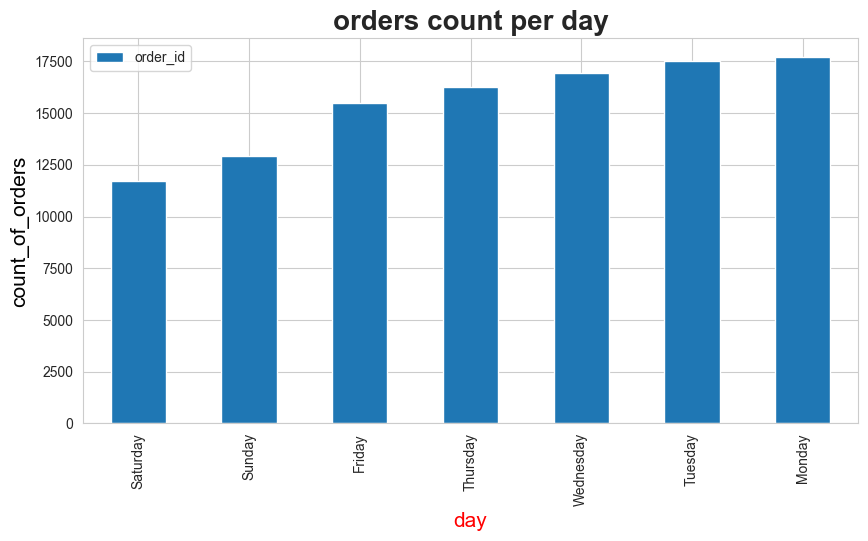

In [187]:
ordersTimeAnalysis.groupby(['day_name']).agg({'order_id' : 'count'}).sort_values('order_id').plot(kind = 'bar', figsize = (10, 5))
plt.title('orders count per day',fontweight='bold',fontsize=20)
plt.xlabel('day',fontsize=15,color='red')
plt.ylabel('count_of_orders',fontsize=15,color='black')
plt.show()

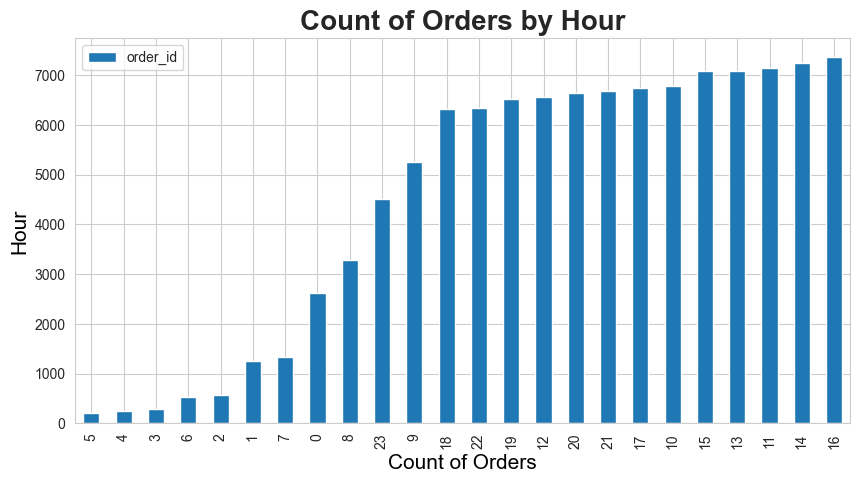

In [188]:
ordersTimeAnalysis.groupby(['Hour']).agg({'order_id' : 'count'}).sort_values('order_id').plot(kind = 'bar', figsize = (10, 5))
plt.title('Count of Orders by Hour',fontweight='bold',fontsize=20)
plt.xlabel('Count of Orders',fontsize=15,color='black')
plt.ylabel('Hour',fontsize=15,color='black')
plt.show()

In [189]:
#**Observations:**
#1. The above plots represent the **peak hours** and **peak days** during which the customers order products. 
#2. The **customer traffic is more during the weekdays compared to the weekends**, with **Monday** and **Tuesday** being the days when most orders were placed. 
#3. Similarly, the **peak time** during which most number of orders were placed were between **11 AM** to **4 PM** in the afternoon. 
#4. We could improve our sales and revenue if we could tap in this information and target the customers with attractive offers. 

In [190]:
products.head()

,product_id,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumaria,40.0,287.0,1.0,225.0,16.0,10.0,14.0
1,3aa071139cb16b67ca9e5dea641aaa2f,artes,44.0,276.0,1.0,1000.0,30.0,18.0,20.0
2,96bd76ec8810374ed1b65e291975717f,esporte_lazer,46.0,250.0,1.0,154.0,18.0,9.0,15.0
3,cef67bcfe19066a932b7673e239eb23d,bebes,27.0,261.0,1.0,371.0,26.0,4.0,26.0
4,9dc1a7de274444849c219cff195d0b71,utilidades_domesticas,37.0,402.0,4.0,625.0,20.0,17.0,13.0


In [191]:
print('Number of records:',products.shape[0])
print('Number of Columns:',products.shape[1])

Number of records: 32951
Number of Columns: 9


In [192]:
products.isna().sum()

product_id                      0
product_category_name         610
product_name_lenght           610
product_description_lenght    610
product_photos_qty            610
product_weight_g                2
product_length_cm               2
product_height_cm               2
product_width_cm                2
dtype: int64

In [193]:
products.dropna(inplace = True)

In [194]:
orderedProducts = products.merge(orderItems, on = 'product_id').merge(productCategoryTranslation, on = 'product_category_name')[['product_id', 'product_category_name_english', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'product_weight_g', 'product_length_cm', 'product_height_cm', 'product_width_cm', 'order_id', 'price', 'freight_value']]
orderedProducts['total_revenue'] = orderedProducts.price + orderedProducts.freight_value
orderedProducts.head()

,product_id,product_category_name_english,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,order_id,price,freight_value,total_revenue
0,1e9e8ef04dbcff4541ed26657ea517e5,perfumery,40.0,287.0,1.0,225.0,16.0,10.0,14.0,e17e4f88e31525f7deef66779844ddce,10.91,7.39,18.30
1,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,39.0,346.0,2.0,400.0,27.0,5.0,20.0,048cc42e03ca8d43c729adf6962cb348,16.90,7.78,24.68
2,6a2fb4dd53d2cdb88e0432f1284a004c,perfumery,39.0,346.0,2.0,400.0,27.0,5.0,20.0,5fa78e91b5cb84b6a8ccc42733f95742,16.90,7.78,24.68
3,0d009643171aee696f4733340bc2fdd0,perfumery,52.0,150.0,1.0,422.0,21.0,16.0,18.0,24b1c4d88fdb7a2dc87f8ecc7d8f47f1,339.00,17.13,356.13
4,0d009643171aee696f4733340bc2fdd0,perfumery,52.0,150.0,1.0,422.0,21.0,16.0,18.0,7b13c77c64a9a956500cbf1a9a23798d,275.00,23.48,298.48


In [195]:
#orderedProducts.to_csv('E:/orderedProducts.csv')

In [196]:
orderedProductsAnalysis = orderedProducts.groupby('product_category_name_english', as_index = False).agg({
                                                        'product_id'                      : 'count',                                                       
                                                        'order_id'                        : 'count',
                                                        'price'                           : 'sum',
                                                        'freight_value'                   : 'sum',
                                                        'total_revenue'                   : 'sum'})
orderedProductsAnalysis.head()

,product_category_name_english,product_id,order_id,price,freight_value,total_revenue
0,agro_industry_and_commerce,212,212,72530.47,5843.60,78374.07
1,air_conditioning,297,297,55024.96,6749.23,61774.19
2,art,209,209,24202.64,4045.17,28247.81
3,arts_and_craftmanship,24,24,1814.01,370.13,2184.14
4,audio,364,364,50688.50,5710.44,56398.94


In [197]:
orderedProductsAnalysis.select_dtypes(include = np.number).describe()

,product_id,order_id,price,freight_value,total_revenue
count,71.000000,71.000000,7.100000e+01,71.000000,7.100000e+01
mean,1563.690141,1563.690141,1.887980e+05,31313.653521,2.201117e+05
std,2606.537422,2606.537422,3.036850e+05,50281.462423,3.515343e+05
min,2.000000,2.000000,2.832900e+02,41.220000,3.245100e+02
25%,93.000000,93.000000,9.171185e+03,1973.205000,1.174393e+04
50%,281.000000,281.000000,4.685688e+04,6749.230000,5.605240e+04
75%,1819.000000,1819.000000,2.029071e+05,35505.620000,2.214684e+05
max,11115.000000,11115.000000,1.258681e+06,204693.040000,1.441248e+06


In [198]:
top12revenueGenerating = orderedProductsAnalysis.sort_values(by = 'total_revenue', ascending = False)[:12]
top12revenueGenerating

,product_category_name_english,product_id,order_id,price,freight_value,total_revenue
43,health_beauty,9670,9670,1258681.34,182566.73,1441248.07
70,watches_gifts,5991,5991,1205005.68,100535.93,1305541.61
7,bed_bath_table,11115,11115,1036988.68,204693.04,1241681.72
65,sports_leisure,8641,8641,988048.97,168607.51,1156656.48
15,computers_accessories,7827,7827,911954.32,147318.08,1059272.40
39,furniture_decor,8334,8334,729762.49,172749.30,902511.79
49,housewares,6964,6964,632248.66,146149.11,778397.77
20,cool_stuff,3796,3796,635290.85,84039.10,719329.95
5,auto,4235,4235,592720.11,92664.21,685384.32
42,garden_tools,4347,4347,485256.46,98962.75,584219.21


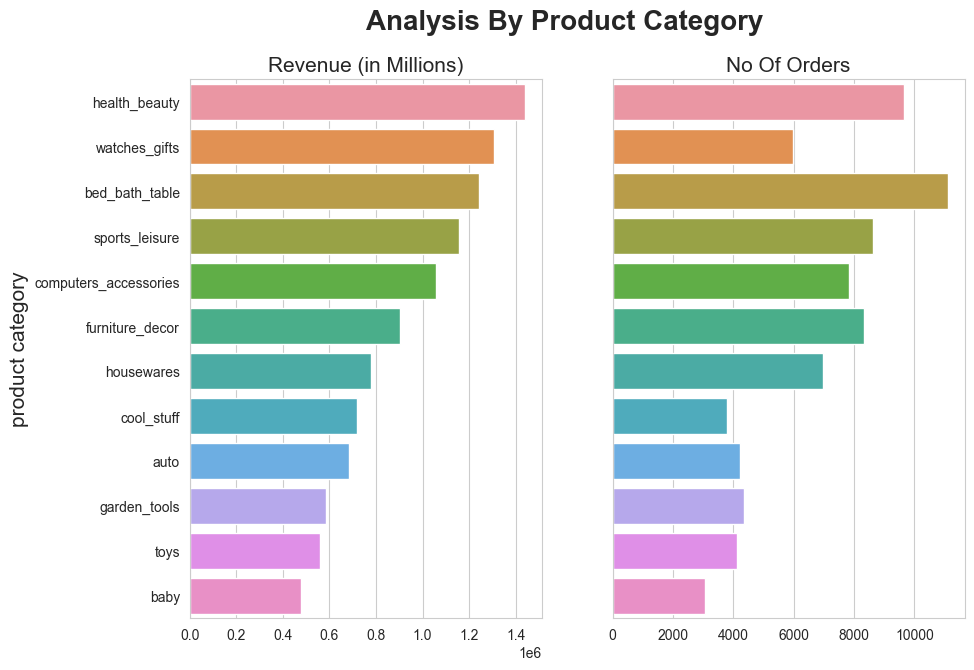

In [199]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 7), sharey=True)
fig.suptitle('Analysis By Product Category', fontsize=20, fontweight = 'bold')

sns.barplot(ax=ax[0], x='total_revenue', y= top12revenueGenerating.product_category_name_english, data = top12revenueGenerating)
ax[0].set_title('Revenue (in Millions)', fontsize = 15)
ax[0].set_ylabel('product category', fontsize = 15)

sns.barplot(ax=ax[1], x='order_id', y = top12revenueGenerating.product_category_name_english, data = top12revenueGenerating)
ax[1].set_title('No Of Orders', fontsize = 15)

for i in range(0,2):
    ax[i].set(xlabel=None)

for i in range(1,2):
    ax[i].set(ylabel=None)

In [200]:
bottom12revenueGenerating = orderedProductsAnalysis.sort_values(by = 'total_revenue', ascending = True)[:12]
bottom12revenueGenerating

,product_category_name_english,product_id,order_id,price,freight_value,total_revenue
61,security_and_services,2,2,283.29,41.22,324.51
29,fashion_childrens_clothes,8,8,569.85,95.51,665.36
11,cds_dvds_musicals,14,14,730.00,224.99,954.99
46,home_comfort_2,30,30,760.27,410.31,1170.58
35,flowers,33,33,1110.04,488.87,1598.91
23,diapers_and_hygiene,39,39,1567.59,573.68,2141.27
3,arts_and_craftmanship,24,24,1814.01,370.13,2184.14
52,la_cuisine,14,14,2054.99,333.55,2388.54
32,fashion_sport,30,30,2119.51,578.13,2697.64
27,fashio_female_clothing,48,48,2803.64,621.75,3425.39


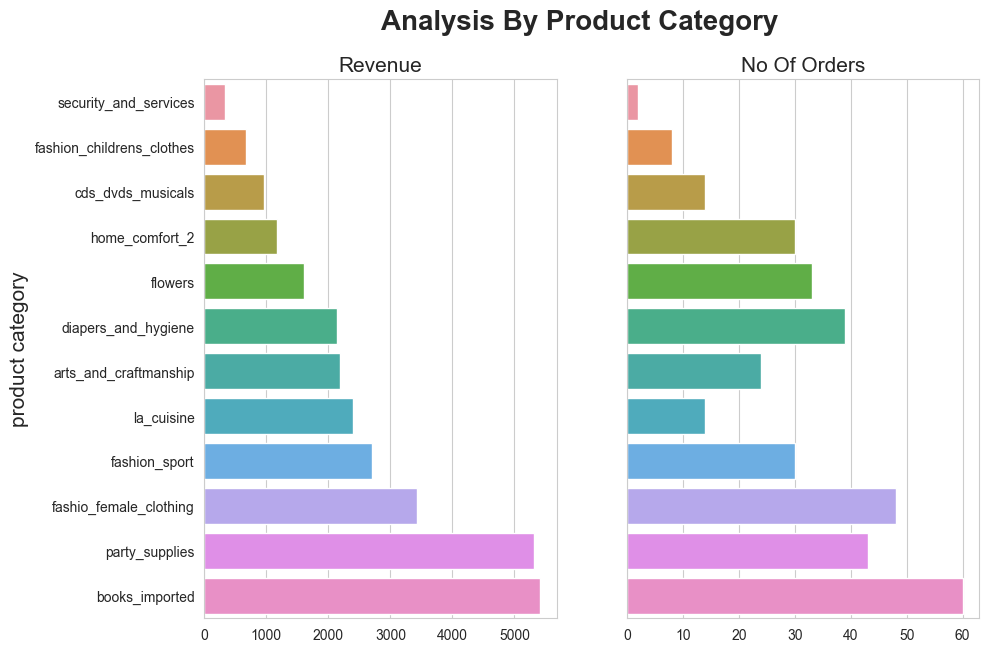

In [201]:
fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 7), sharey=True)
fig.suptitle('Analysis By Product Category', fontsize=20, fontweight = 'bold')

sns.barplot(ax=ax[0], x='total_revenue', y= bottom12revenueGenerating.product_category_name_english, data = bottom12revenueGenerating)
ax[0].set_title('Revenue', fontsize = 15)
ax[0].set_ylabel('product category', fontsize = 15)

sns.barplot(ax=ax[1], x='order_id', y = bottom12revenueGenerating.product_category_name_english, data = bottom12revenueGenerating)
ax[1].set_title('No Of Orders', fontsize = 15)

for i in range(0,2):
    ax[i].set(xlabel=None)

for i in range(1,2):
    ax[i].set(ylabel=None)

In [202]:
overseasCustomers = customerDensity[customerDensity.geolocation_lat > 10]
overseasCustomers.head()

,customer_unique_id,customer_zip_code_prefix,geolocation_lat,geolocation_lng
3830,3fbfe90197db709a78d7e0eaabe0aac0,47310,38.268205,-7.803886
4887,a8563d0be40211e2527f8b80c24f4845,28595,43.684961,-7.411080
5111,aef278d3c4350b0d32907d429421f071,68447,42.428884,-6.873344
14955,c037aa753c0787f6e28b2d5c5e40d997,68447,42.428884,-6.873344
16444,f570b38fd1007c094f293aadb09bcedf,68447,42.428884,-6.873344


In [203]:
# create a map centered on your coordinates
m = folium.Map(location = overseasCustomers[['geolocation_lat', 'geolocation_lng']].values.tolist()[0], zoom_start = 13)

# create a list of coordinates
coordinates = overseasCustomers[['geolocation_lat', 'geolocation_lng']].values.tolist()

# create a heatmap layer with the list of coordinates
heat_layer = HeatMap(coordinates)

# add the heatmap layer to the map
heat_layer.add_to(m)

# display the map
m

In [204]:
#overseasCustomers.to_csv('E:/overseasCustomers.csv')

In [205]:
overseasAnalysis = overseasCustomers[['customer_unique_id']].merge(customers, on = 'customer_unique_id').merge(orders, on = 'customer_id').merge(orderItems, on = 'order_id').merge(products, on = 'product_id').merge(productCategoryTranslation, on = 'product_category_name')
overseasAnalysis.head()

,customer_unique_id,customer_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,product_category_name_english
0,3fbfe90197db709a78d7e0eaabe0aac0,d92a2fbf56a1e0f231a58f7a1e9ca540,47310,santana do sobrado,BA,ed7774b614a7ad220649f09dc6a4c043,delivered,2017-11-16 23:27:21,2017-11-16 23:50:57,2017-11-17 22:32:25,2017-12-11 14:14:54,2017-12-13,1416,0,23,1,24,1,1a980a10bed1d765e2eb2ad3608a63a1,dbc22125167c298ef99da25668e1011f,2017-11-22 23:50:57,36.90,17.92,malas_acessorios,45.0,217.0,1.0,850.0,45.0,10.0,31.0,luggage_accessories
1,a8563d0be40211e2527f8b80c24f4845,4457d60c844b9cec4abec3a9507f23a5,28595,portela,RJ,a85ce89cbcc514dfe135de0036be45db,delivered,2017-08-21 16:17:56,2017-08-23 02:50:25,2017-08-23 15:33:02,2017-09-19 10:52:56,2017-09-13,37949,0,26,-7,28,1,7a10781637204d8d10485c71a6108a2e,4869f7a5dfa277a7dca6462dcf3b52b2,2017-08-29 02:50:25,229.90,16.36,relogios_presentes,42.0,236.0,1.0,342.0,18.0,13.0,15.0,watches_gifts
2,6e9d7c002cb4603011d3e83033b01878,2dd769df72fbd8448297d18c48df7b92,46560,ibiajara,BA,897ec6416d50126a9061626f0fc2d658,delivered,2017-04-20 15:05:38,2017-04-20 15:21:31,2017-04-24 07:52:21,2017-05-18 08:06:47,2017-05-22,953,3,24,3,27,1,1d54b96972338247c7341a2069e2bd96,6560211a19b47992c3666cc44a7e94c0,2017-04-27 15:21:31,45.00,20.80,relogios_presentes,59.0,184.0,1.0,150.0,16.0,2.0,20.0,watches_gifts
3,aef278d3c4350b0d32907d429421f071,d90af5c00814430fc3e212e8163bf2b8,68447,vila dos cabanos,PA,72fb560d115ecf3b15de9b853c02e505,delivered,2018-04-19 14:04:23,2018-04-19 14:34:54,2018-04-23 09:57:00,2018-06-06 20:32:22,2018-06-01,1831,3,44,-6,48,1,3fbc0ef745950c7932d5f2a446189725,06a2c3af7b3aee5d69171b0e14f0ee87,2018-04-25 14:31:42,64.99,18.33,beleza_saude,50.0,1257.0,1.0,350.0,19.0,12.0,13.0,health_beauty
4,2a4b1192846ec238d62df3838257bad9,88aac7b0942dcdb41ebabf7811b106fc,68275,porto trombetas,PA,4d5abe7999d76d1fb6237d3677706af0,delivered,2017-11-23 18:13:30,2017-11-23 18:55:39,2017-11-28 20:07:50,2017-12-19 08:58:58,2018-01-04,2529,5,20,15,25,1,187e7d92b8168c3661824809d0c5dffb,431af27f296bc6519d890aa5a05fdb11,2017-11-29 18:31:09,119.90,29.24,beleza_saude,30.0,1501.0,1.0,1900.0,27.0,9.0,18.0,health_beauty


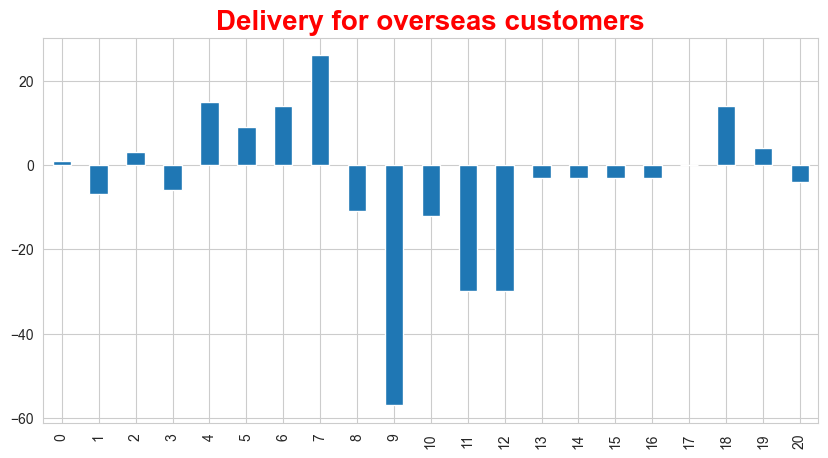

In [206]:
overseasAnalysis.delivered_estimated.plot(kind = 'bar', figsize = (10, 5))
plt.title('Delivery for overseas customers', fontsize=20, fontweight = 'bold',color='red')
plt.show()

In [207]:
#we can  clearly see there is late delivery 

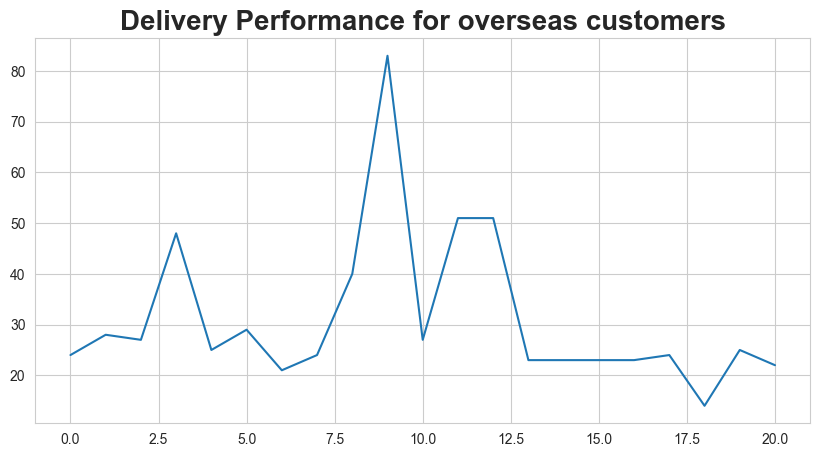

In [208]:
overseasAnalysis.purchased_delivered.plot(kind = 'line', figsize = (10, 5))
plt.title('Delivery Performance for overseas customers', fontsize=20, fontweight = 'bold')
plt.show()

In [209]:
overseasAnalysis.product_category_name_english.value_counts()

stationery             6
health_beauty          3
watches_gifts          2
auto                   2
luggage_accessories    1
art                    1
home_appliances        1
furniture_decor        1
bed_bath_table         1
cool_stuff             1
telephony              1
home_appliances_2      1
Name: product_category_name_english, dtype: int64

In [210]:
merged = customers.merge(orders, on = 'customer_id').merge(orderItems, on = 'order_id').merge(products, on = 'product_id').merge(geolocationMean, left_on = 'customer_zip_code_prefix', right_on = 'geolocation_zip_code_prefix').merge(payments, on = 'order_id').merge(sellers, on = 'seller_id').merge(productCategoryTranslation, on = 'product_category_name').merge(orderReviews, on = 'order_id', how = 'left')
merged.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_status,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,order_estimated_delivery_date,purchased_approved,approved_carrier,carrier_delivered,delivered_estimated,purchased_delivered,order_item_id,product_id,seller_id,shipping_limit_date,price,freight_value,product_category_name,product_name_lenght,product_description_lenght,product_photos_qty,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_zip_code_prefix,geolocation_lat,geolocation_lng,payment_sequential,payment_type,payment_installments,payment_value,seller_zip_code_prefix,seller_city,seller_state,product_category_name_english,review_id,review_score,review_comment_title,review_comment_message,review_creation_date,review_answer_timestamp
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,delivered,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,2017-06-05,997,6,1,10,8,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 15:22:12,124.99,21.88,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,14409,-20.468849,-47.382173,1,credit_card,2,146.87,8577,itaquaquecetuba,SP,office_furniture,88b8b52d46df026a9d1ad2136a59b30b,4.0,NaN,NaN,2017-05-26,2017-05-30 22:34:40
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19,86255,12,5,20,18,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,112.99,24.90,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,68030,-2.430314,-54.693217,1,credit_card,1,275.79,8577,itaquaquecetuba,SP,office_furniture,7fc63200f12eebb5f387856afdd63db8,1.0,NaN,"GOSTARIA DE UMA SOLUÇÃO, ESTOU PRECISANDO MUIT...",2017-11-29,2017-12-01 19:41:59
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,delivered,2017-11-09 00:50:13,2017-11-10 00:47:48,2017-11-22 01:43:37,2017-11-28 00:09:50,2017-12-19,86255,12,5,20,18,2,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-11-23 00:47:18,112.99,24.90,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,68030,-2.430314,-54.693217,1,credit_card,1,275.79,8577,itaquaquecetuba,SP,office_furniture,7fc63200f12eebb5f387856afdd63db8,1.0,NaN,"GOSTARIA DE UMA SOLUÇÃO, ESTOU PRECISANDO MUIT...",2017-11-29,2017-12-01 19:41:59
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,delivered,2017-05-07 20:11:26,2017-05-08 22:22:56,2017-05-19 20:16:31,2017-05-26 09:54:04,2017-06-12,7890,10,6,16,18,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2017-05-22 22:22:56,124.99,15.62,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,92480,-29.826454,-51.245676,1,credit_card,7,140.61,8577,itaquaquecetuba,SP,office_furniture,251191809e37c1cffc16865947c18a4d,3.0,NaN,"Produto compatível com seu valor, muito bonito...",2017-05-27,2017-05-28 02:43:16
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,delivered,2018-02-03 19:45:40,2018-02-04 22:29:19,2018-02-19 18:21:47,2018-02-28 21:09:00,2018-03-22,9819,14,9,21,25,1,a9516a079e37a9c9c36b9b78b10169e8,7c67e1448b00f6e969d365cea6b010ab,2018-02-18 21:29:19,106.99,30.59,moveis_escritorio,41.0,1141.0,1.0,8683.0,54.0,64.0,31.0,25931,-22.604835,-43.026500,1,credit_card,10,137.58,8577,itaquaquecetuba,SP,office_furniture,f7123bac5b91a0e2e38d8b41fd1206f4,4.0,NaN,Entregou antes do prazo,2018-03-01,2018-03-02 11:11:24


In [211]:
merged.shape

(112124, 48)

In [212]:
merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 112124 entries, 0 to 112123
Data columns (total 48 columns):
 #   Column                         Non-Null Count   Dtype         
---  ------                         --------------   -----         
 0   customer_id                    112124 non-null  object        
 1   customer_unique_id             112124 non-null  object        
 2   customer_zip_code_prefix       112124 non-null  object        
 3   customer_city                  112124 non-null  object        
 4   customer_state                 112124 non-null  object        
 5   order_id                       112124 non-null  object        
 6   order_status                   112124 non-null  object        
 7   order_purchase_timestamp       112124 non-null  datetime64[ns]
 8   order_approved_at              112124 non-null  datetime64[ns]
 9   order_delivered_carrier_date   112124 non-null  datetime64[ns]
 10  order_delivered_customer_date  112124 non-null  datetime64[ns]
 11  

In [213]:
merged.drop(columns = ['order_status', 'order_item_id', 'order_approved_at', 'order_delivered_carrier_date', 'order_delivered_customer_date', 'order_estimated_delivery_date', 'approved_carrier', 'carrier_delivered', 'seller_id', 'shipping_limit_date', 'product_category_name', 'product_name_lenght', 'product_description_lenght', 'product_photos_qty', 'geolocation_zip_code_prefix', 'payment_sequential', 'seller_zip_code_prefix', 'review_id', 'review_comment_title', 'review_comment_message', 'review_creation_date', 'review_answer_timestamp', 'seller_city', 'seller_state'], axis = 1, inplace = True)
merged.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,purchased_approved,delivered_estimated,purchased_delivered,product_id,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,product_category_name_english,review_score
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,997,10,8,a9516a079e37a9c9c36b9b78b10169e8,124.99,21.88,8683.0,54.0,64.0,31.0,-20.468849,-47.382173,credit_card,2,146.87,office_furniture,4.0
1,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,2017-11-09 00:50:13,86255,20,18,a9516a079e37a9c9c36b9b78b10169e8,112.99,24.90,8683.0,54.0,64.0,31.0,-2.430314,-54.693217,credit_card,1,275.79,office_furniture,1.0
2,8912fc0c3bbf1e2fbf35819e21706718,9eae34bbd3a474ec5d07949ca7de67c0,68030,santarem,PA,c1d2b34febe9cd269e378117d6681172,2017-11-09 00:50:13,86255,20,18,a9516a079e37a9c9c36b9b78b10169e8,112.99,24.90,8683.0,54.0,64.0,31.0,-2.430314,-54.693217,credit_card,1,275.79,office_furniture,1.0
3,f0ac8e5a239118859b1734e1087cbb1f,3c799d181c34d51f6d44bbbc563024db,92480,nova santa rita,RS,b1a5d5365d330d10485e0203d54ab9e8,2017-05-07 20:11:26,7890,16,18,a9516a079e37a9c9c36b9b78b10169e8,124.99,15.62,8683.0,54.0,64.0,31.0,-29.826454,-51.245676,credit_card,7,140.61,office_furniture,3.0
4,6bc8d08963a135220ed6c6d098831f84,23397e992b09769faf5e66f9e171a241,25931,mage,RJ,2e604b3614664aa66867856dba7e61b7,2018-02-03 19:45:40,9819,21,25,a9516a079e37a9c9c36b9b78b10169e8,106.99,30.59,8683.0,54.0,64.0,31.0,-22.604835,-43.026500,credit_card,10,137.58,office_furniture,4.0


In [214]:
final = merged.groupby('customer_unique_id', as_index=False).agg({'customer_zip_code_prefix'      : 'max',
                                                                  'customer_city'                 : 'max',
                                                                  'customer_state'                : 'max',
                                                                  'order_id'                      : 'nunique',
                                                                  'purchased_approved'            : 'mean',
                                                                  'delivered_estimated'           : 'min',
                                                                  'purchased_delivered'           : 'mean',
                                                                  'product_id'                    : 'nunique',
                                                                  'price'                         : 'sum',
                                                                  'freight_value'                 : 'sum',
                                                                  'product_weight_g'              : 'sum',
                                                                  'product_length_cm'             : 'sum',
                                                                  'product_height_cm'             : 'sum',
                                                                  'product_width_cm'              : 'sum',
                                                                  'geolocation_lat'               : 'mean',
                                                                  'geolocation_lng'               : 'mean',
                                                                  'payment_type'                  : 'max',
                                                                  'payment_installments'          : 'max',
                                                                  'payment_value'                 : 'sum',
                                                                  'review_score'                  : 'mean'})

final.head()

,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,purchased_approved,delivered_estimated,purchased_delivered,product_id,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,review_score
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,cajamar,SP,1,891.0,4,6.0,1,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,credit_card,8,141.90,5.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,osasco,SP,1,26057.0,4,3.0,1,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,credit_card,1,27.19,4.0
2,0000f46a3911fa3c0805444483337064,88115,sao jose,SC,1,0.0,1,25.0,1,69.00,17.22,1500.0,25.0,50.0,35.0,-27.532246,-48.618667,credit_card,8,86.22,3.0
3,0000f6ccb0745a6a4b88665a16c9f078,66812,belem,PA,1,1176.0,11,20.0,1,25.99,17.63,150.0,19.0,5.0,11.0,-1.304189,-48.476339,credit_card,4,43.62,4.0
4,0004aac84e0df4da2b147fca70cf8255,18040,sorocaba,SP,1,1270.0,7,13.0,1,180.00,16.89,6050.0,16.0,3.0,11.0,-23.496567,-47.462811,credit_card,6,196.89,5.0


In [215]:
final.rename(columns = {'order_id' : 'no_of_orders', 'product_id' : 'no_of_products'}, inplace = True)

In [216]:
final.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90528 entries, 0 to 90527
Data columns (total 21 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   customer_unique_id        90528 non-null  object 
 1   customer_zip_code_prefix  90528 non-null  int64  
 2   customer_city             90528 non-null  object 
 3   customer_state            90528 non-null  object 
 4   no_of_orders              90528 non-null  int64  
 5   purchased_approved        90528 non-null  float64
 6   delivered_estimated       90528 non-null  int64  
 7   purchased_delivered       90528 non-null  float64
 8   no_of_products            90528 non-null  int64  
 9   price                     90528 non-null  float64
 10  freight_value             90528 non-null  float64
 11  product_weight_g          90528 non-null  float64
 12  product_length_cm         90528 non-null  float64
 13  product_height_cm         90528 non-null  float64
 14  produc

In [217]:
#final.to_csv('E:/final.csv')

In [218]:
#merged.to_csv('E:/merge.csv')

In [219]:
#RFM ANALYSIS OF THE GIVEN DATA

In [220]:
recency = merged.groupby('customer_unique_id', as_index=False)['order_purchase_timestamp'].max()
recency.rename(columns={'order_purchase_timestamp':'LastPurchaseDate'},inplace = True)
recency.head()

,customer_unique_id,LastPurchaseDate
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42


In [221]:
recent_date = merged['order_purchase_timestamp'].dt.date.max()
print('The last recent date in  dataset is: ', recent_date)

The last recent date in  dataset is:  2018-08-29


In [222]:
recency['Recency'] = recency['LastPurchaseDate'].dt.date.apply(lambda x: (recent_date - x).days)
recency.head()

,customer_unique_id,LastPurchaseDate,Recency
0,0000366f3b9a7992bf8c76cfdf3221e2,2018-05-10 10:56:27,111
1,0000b849f77a49e4a4ce2b2a4ca5be3f,2018-05-07 11:11:27,114
2,0000f46a3911fa3c0805444483337064,2017-03-10 21:05:03,537
3,0000f6ccb0745a6a4b88665a16c9f078,2017-10-12 20:29:41,321
4,0004aac84e0df4da2b147fca70cf8255,2017-11-14 19:45:42,288


In [223]:
frequency = merged.groupby(["customer_unique_id"]).agg({"order_id":"nunique"}).reset_index()
frequency.rename(columns={'order_id':'Frequency'},inplace=True)
frequency.head()

,customer_unique_id,Frequency
0,0000366f3b9a7992bf8c76cfdf3221e2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,1
2,0000f46a3911fa3c0805444483337064,1
3,0000f6ccb0745a6a4b88665a16c9f078,1
4,0004aac84e0df4da2b147fca70cf8255,1


In [224]:
#the frequency is only one which means there is only one order 

In [225]:
monetary = merged.groupby('customer_unique_id', as_index=False)['payment_value'].sum()
monetary.rename(columns={'payment_value':'Monetary'},inplace=True)
monetary.head()

,customer_unique_id,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,27.19
2,0000f46a3911fa3c0805444483337064,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,43.62
4,0004aac84e0df4da2b147fca70cf8255,196.89


In [226]:
rfm = recency.merge(frequency, on='customer_unique_id')
rfm = rfm.merge(monetary, on='customer_unique_id').drop(columns='LastPurchaseDate')
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89


In [227]:
#moneytary is calculated by summing up of one or more orders

In [228]:
rfm[rfm.Recency == 0]

,customer_unique_id,Recency,Frequency,Monetary
1463,0421e7a23f21e5d54efed456aedbc513,0,1,119.42
4454,0c6d7218d5f3fa14514fd29865269993,0,1,178.25
12062,21dbe8eabd00b34492a939c540e2b1a7,0,1,14.29
13032,24ac2b4327e25baf39f2119e4228976a,0,1,93.75
32785,5c58de6fb80e93396e2f35642666b693,0,1,1021.92
43195,7a22d14aa3c3599238509ddca4b93b01,0,1,73.10
45280,7febafa06d9d8f232a900a2937f04338,0,1,61.29
62249,afbcfd0b9c5233e7ccc73428526fbb52,0,1,2486.25
64024,b4dcade04bc548b7e3b0243c801f8c26,0,1,106.95
64767,b701bebbdf478f5500348f03aff62121,0,1,33.23


In [229]:
rfm['Recency'] = rfm.Recency.apply(lambda x: 1 if x == 0 else x)

In [230]:
#recency value means people buy in last day of the purchase 
#**Observations:**
#1. The recency column had values 0, i.e., a customer came at the last day of the date which we took as the threshold to calculate recency. 
#2. 0 in recency should be treated or removed for creating the target variable, i.e., Churn and for further process of scaling or normalization, so the **0 is converted to 1 for our convenience**. 

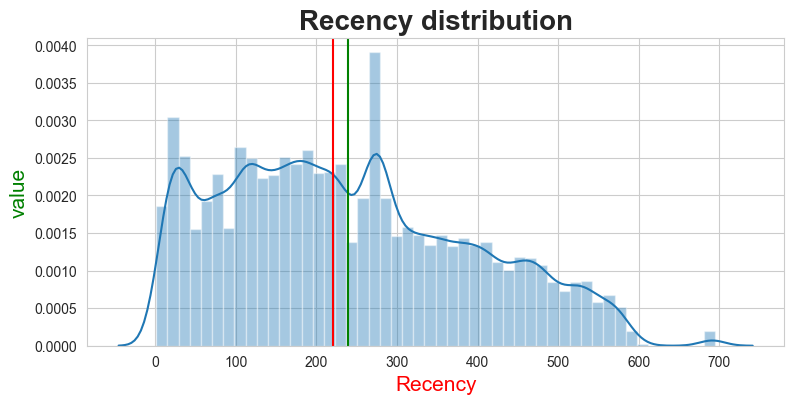

Mean of recency:  238.73377297631671
Median of recency:  220.0
Skewness of recency:  0.43585883202493925


In [231]:
plt.figure(figsize = (9, 4))
sns.distplot(rfm.Recency)
plt.axvline(rfm.Recency.mean(), c = 'green')
plt.axvline(rfm.Recency.median(), c = 'red')
plt.title('Recency distribution',fontweight='bold',fontsize=20)
plt.xlabel('Recency',fontsize=15,color='red')
plt.ylabel('value',fontsize=15,color='green')
plt.show()
print('Mean of recency: ', rfm.Recency.mean())
print('Median of recency: ', rfm.Recency.median())
print('Skewness of recency: ', rfm.Recency.skew())

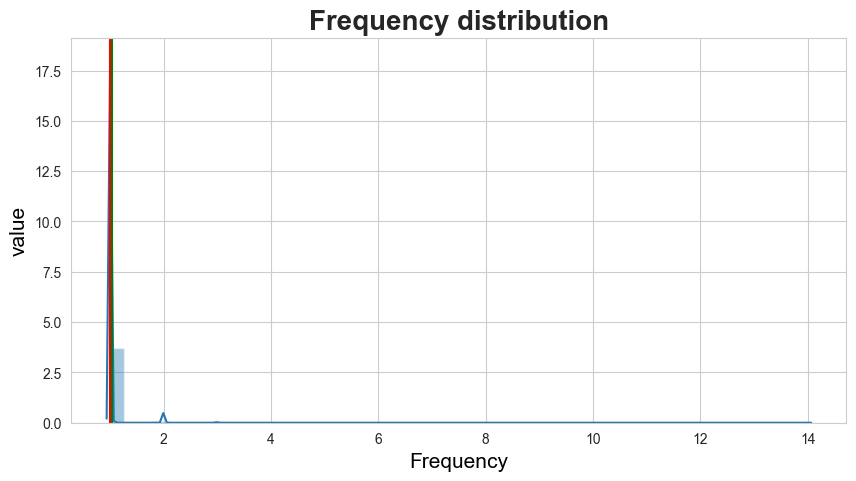

Mean of frequency:  1.0328958996111701
Median of frequency:  1.0
Skewness of frequency:  10.676600298052568


In [232]:
plt.figure(figsize = (10, 5))
sns.distplot(rfm.Frequency)
plt.axvline(rfm.Frequency.mean(), c = 'green')
plt.axvline(rfm.Frequency.median(), c = 'red')
plt.title('Frequency distribution',fontweight='bold',fontsize=20)
plt.xlabel('Frequency',fontsize=15,color='black')
plt.ylabel('value',fontsize=15,color='black')
plt.show()
print('Mean of frequency: ', rfm.Frequency.mean())
print('Median of frequency: ', rfm.Frequency.median())
print('Skewness of frequency: ', rfm.Frequency.skew())

In [233]:
Q1 = np.quantile(rfm.Frequency, 0.25)
Q3 = np.quantile(rfm.Frequency, 0.75)
IQR = Q3 - Q1
frequencyDistribution = rfm[~((rfm.Frequency < Q1 - 1.5 * IQR) | (rfm.Frequency > Q3 + 1.5 * IQR))]
frequencyDistribution.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89


In [234]:
frequencyDistribution.Frequency.describe()

count    87850.0
mean         1.0
std          0.0
min          1.0
25%          1.0
50%          1.0
75%          1.0
max          1.0
Name: Frequency, dtype: float64

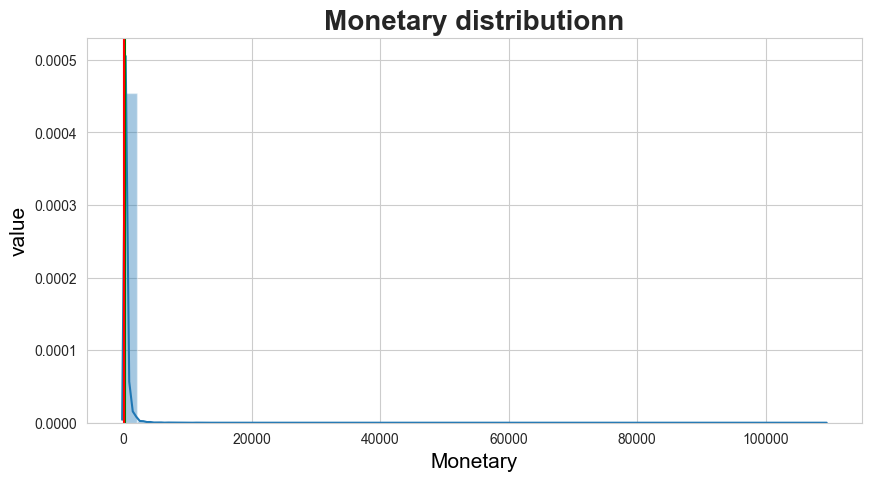

Mean of monetary:  213.36403256451038
Median of monetary:  112.99
Skewness of monetary:  69.45531310765217


In [235]:
plt.figure(figsize = (10, 5))
sns.distplot(rfm.Monetary)
plt.axvline(rfm.Monetary.mean(), c = 'green')
plt.axvline(rfm.Monetary.median(), c = 'red')
plt.title('Monetary distributionn',fontweight='bold',fontsize=20)
plt.xlabel('Monetary',fontsize=15,color='black')
plt.ylabel('value',fontsize=15,color='black')
plt.show()
print('Mean of monetary: ', rfm.Monetary.mean())
print('Median of monetary: ', rfm.Monetary.median())
print('Skewness of monetary: ', rfm.Monetary.skew())

In [236]:
Q1 = np.quantile(rfm.Monetary, 0.25)
Q3 = np.quantile(rfm.Monetary, 0.75)
IQR = Q3 - Q1
monetaryDistribution = rfm[~((rfm.Monetary < Q1 - 1.5 * IQR) | (rfm.Monetary > Q3 + 1.5 * IQR))]
monetaryDistribution.head()

,customer_unique_id,Recency,Frequency,Monetary
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19
2,0000f46a3911fa3c0805444483337064,537,1,86.22
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89


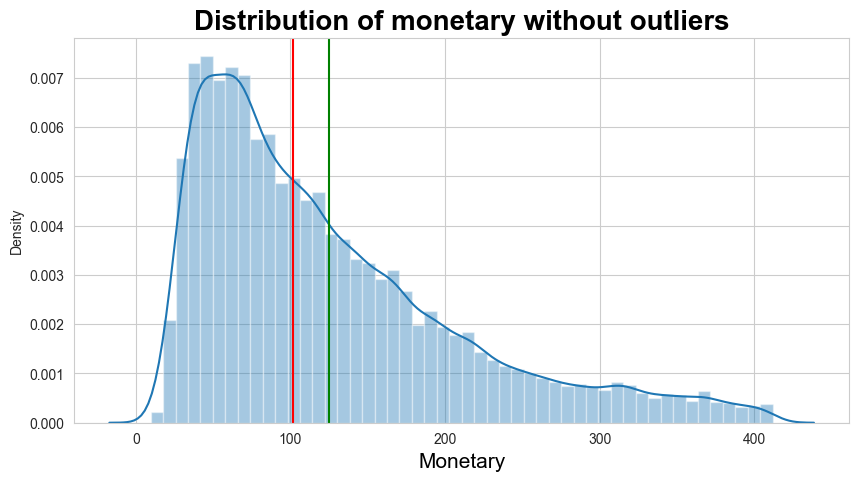

In [237]:
plt.figure(figsize=(10, 5))
sns.distplot(monetaryDistribution.Monetary)
plt.axvline(monetaryDistribution.Monetary.mean(), c = 'green')
plt.axvline(monetaryDistribution.Monetary.median(), c = 'red')
plt.xlabel('Monetary',color='black',fontsize=15)
plt.title('Distribution of monetary without outliers',color='black',fontsize=20,fontweight='bold')
plt.show()

In [238]:
monetaryDistribution.Monetary.describe()

count    81665.000000
mean       125.150342
std         85.615531
min          9.590000
25%         60.000000
50%        101.340000
75%        167.200000
max        411.910000
Name: Monetary, dtype: float64

In [239]:
#the average value is 124 and median value is 101 brazil dollars 

In [240]:
ll_r = rfm.Recency.quantile(0.25)
mid_r = rfm.Recency.quantile(0.50)
ul_r = rfm.Recency.quantile(0.75)
print(ll_r, mid_r, ul_r)

115.0 220.0 347.0


In [241]:
def recency_label(recent):
    if recent <= ll_r:
        return 1
    elif (recent > ll_r) and (recent <= mid_r):
        return 2
    elif (recent > mid_r) and (recent <= ul_r):
        return 3
    elif recent > ul_r:
        return 4

In [242]:
#divide into 4 class

In [243]:
rfm['recency_label'] = rfm.Recency.apply(recency_label)
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3


In [244]:
ll_m = rfm.Monetary.quantile(0.25)
mid_m = rfm.Monetary.quantile(0.50)
ul_m = rfm.Monetary.quantile(0.75)
print(ll_m, mid_m, ul_m)

63.837500000000006 112.99 203.08


In [245]:
def monetary_label(money):
    if money <= ll_m:
        return 4
    elif (money > ll_m) and (money <= mid_m):
        return 3
    elif (money > mid_m) and (money <= ul_m):
        return 2
    elif money > ul_m:
        return 1

In [246]:
rfm['monetary_label'] = rfm.Monetary.apply(monetary_label)
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2


In [247]:
#**Monetary label breakdown:**<br>
#1 - These are the customers who spend large amount. (Monetary value within the 25% quantile)<br>
#2 - These are the customers who spend good amount. (Monetary value between 25% and 50% quantile)<br>
#3 - These are the customers who spend moderately. (Monetary value between 50% and 75% quantile)<br>
#4 - These are the customers who spend the least. (Monetary value more than 75% quantile)

In [248]:
#**Recency label breakdown:**<br>
#1 - These are the customers who whose visit date(s) are the most recent. (Recency value within the 25% quantile)<br>
#2 - These are the customers who whose visit date(s) are not very recent. (Recency value between 25% and 50% quantile)<br>
#3 - These are the customers who whose visit date(s) are somewhat recent. (Recency value between 50% and 75% quantile)<br>
#4 - These are the customers who whose visit date(s) are the oldest. (Recency value more than 75% quantile)

In [249]:
rfm.Frequency.value_counts()

1     87850
2      2462
3       171
4        28
5         9
6         3
7         3
9         1
14        1
Name: Frequency, dtype: int64

In [250]:
def frequency_label(frequent):
    if frequent == 1:
        return 1
    elif frequent == 2:
        return 2
    elif frequent == 3:
        return 3
    elif frequent > 3:
        return 4

In [251]:
rfm['frequency_label'] = rfm.Frequency.apply(frequency_label)
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label,frequency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4,1
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3,1
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4,1
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2,1


In [252]:
#**Frequency label breakdown:**<br>
#1 - These are the most frequent customers. (Frequency > 3)
#2 - These are the frequent frequent customers. (Frequency = 3)
#3 - These are the somewhat frequent customers. (Frequency = 2)
#4 - These are the least frequent customers. (Frequency = 1)|

In [253]:
rfm['Rank'] = list(zip(rfm.recency_label,rfm.frequency_label,rfm.monetary_label))
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label,frequency_label,Rank
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2,1,"(1, 1, 2)"
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4,1,"(1, 1, 4)"
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3,1,"(4, 1, 3)"
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4,1,"(3, 1, 4)"
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2,1,"(3, 1, 2)"


In [254]:
rfm.recency_label.value_counts()

1    22754
4    22595
3    22594
2    22585
Name: recency_label, dtype: int64

In [255]:
rfm.frequency_label.value_counts()

1    87850
2     2462
3      171
4       45
Name: frequency_label, dtype: int64

In [256]:
rfm['rank_rm'] = list(zip(rfm.recency_label, rfm.monetary_label))
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label,frequency_label,Rank,rank_rm
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2,1,"(1, 1, 2)","(1, 2)"
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4,1,"(1, 1, 4)","(1, 4)"
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3,1,"(4, 1, 3)","(4, 3)"
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4,1,"(3, 1, 4)","(3, 4)"
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2,1,"(3, 1, 2)","(3, 2)"


In [257]:
rfm.rank_rm.value_counts()

(1, 2)    5887
(3, 3)    5849
(4, 3)    5827
(1, 1)    5763
(2, 4)    5741
(4, 4)    5720
(2, 2)    5700
(3, 1)    5681
(2, 1)    5647
(1, 4)    5640
(4, 1)    5540
(3, 2)    5533
(3, 4)    5531
(4, 2)    5508
(2, 3)    5497
(1, 3)    5464
Name: rank_rm, dtype: int64

In [258]:
#RM analysis value in the column 
#1. (Recency - 1, Monetary - 1) - They are very recent and have spend a lot of money
#2. (Recency - 1, Monetary - 2) - They are very recent and have spend a good amount of money
#3. (Recency - 2, Monetary - 1) - They are recent and have spend a lot of money
#4. (Recency - 2, Monetary - 2) - They are recent and have spend a good of money
#5. (Recency - 1, Monetary - 3) - They are very recent and have spend a decent of money

### The least important ranks:
#1. (Recency - 4, Monetary - 4) - they are old customers and spent  not at all money 
#2. (Recency - 4, Monetary - 3) - They are not at all recent and spend a a decent amount of money
#3. (Recency - 4, Monetary - 2) - They are not at all recent and spend a good amount of money
#4. (Recency - 3, Monetary - 4) - They are not very recent and spend a negligible amount of money
#5. (Recency - 3, Monetary - 3) - They are not very recent and spend a decent amount of money

In [259]:
a=rfm['Rank'].value_counts()

In [260]:
#from the above we can clearly understand that the r-1,2,3,4(new,very recent,recent,old)
#frequency(1,2,3,4)=(buy one time,two time ,3 time time,frequent customers)
#monetary(1,2,3,4)=(spend large amount of money,large money,decent_money,not atall money)

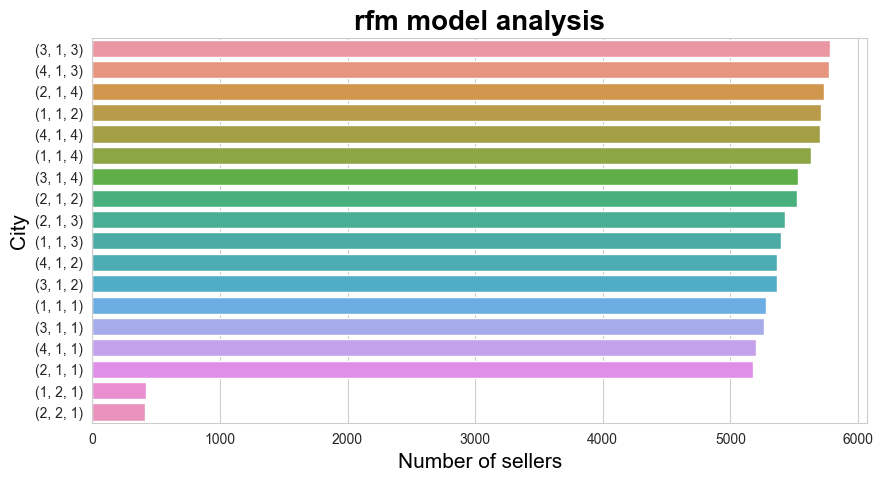

In [261]:
plt.figure(figsize=(10, 5))
sns.barplot(y = rfm.Rank.value_counts().index[:18], x = rfm.Rank.value_counts().values[:18])
plt.xlabel('Number of sellers',color='black',fontsize=15)
plt.ylabel('City',color='black',fontsize=15)
plt.title('rfm model analysis',color='black',fontsize=20,fontweight='bold')
plt.show()

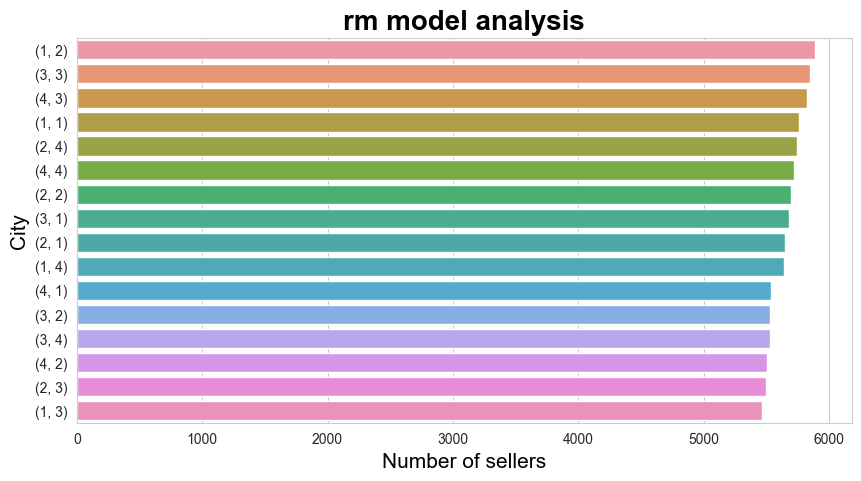

In [262]:
plt.figure(figsize=(10, 5))
sns.barplot(y = rfm.rank_rm.value_counts().index[:16], x = rfm.rank_rm.value_counts().values[:16])
plt.xlabel('Number of sellers',color='black',fontsize=15)
plt.ylabel('City',color='black',fontsize=15)
plt.title('rm model analysis',color='black',fontsize=20,fontweight='bold')
plt.show()

In [263]:
#we can clearly get the value through rm models

In [264]:
rfm['Churn'] = rfm.Recency.apply(lambda x: 1 if x > rfm.Recency.mean() else 0)
rfm.head()

,customer_unique_id,Recency,Frequency,Monetary,recency_label,monetary_label,frequency_label,Rank,rank_rm,Churn
0,0000366f3b9a7992bf8c76cfdf3221e2,111,1,141.90,1,2,1,"(1, 1, 2)","(1, 2)",0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,114,1,27.19,1,4,1,"(1, 1, 4)","(1, 4)",0
2,0000f46a3911fa3c0805444483337064,537,1,86.22,4,3,1,"(4, 1, 3)","(4, 3)",1
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,3,4,1,"(3, 1, 4)","(3, 4)",1
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,3,2,1,"(3, 1, 2)","(3, 2)",1


In [265]:
final = final.merge(rfm[['customer_unique_id', 'Recency', 'Monetary', 'Frequency', 'Churn','Rank','rank_rm','recency_label','monetary_label','frequency_label']], on = 'customer_unique_id')
final.head()

,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,no_of_orders,purchased_approved,delivered_estimated,purchased_delivered,no_of_products,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,review_score,Recency,Monetary,Frequency,Churn,Rank,rank_rm,recency_label,monetary_label,frequency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,7787,cajamar,SP,1,891.0,4,6.0,1,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,credit_card,8,141.90,5.0,111,141.90,1,0,"(1, 1, 2)","(1, 2)",1,2,1
1,0000b849f77a49e4a4ce2b2a4ca5be3f,6053,osasco,SP,1,26057.0,4,3.0,1,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,credit_card,1,27.19,4.0,114,27.19,1,0,"(1, 1, 4)","(1, 4)",1,4,1
2,0000f46a3911fa3c0805444483337064,88115,sao jose,SC,1,0.0,1,25.0,1,69.00,17.22,1500.0,25.0,50.0,35.0,-27.532246,-48.618667,credit_card,8,86.22,3.0,537,86.22,1,1,"(4, 1, 3)","(4, 3)",4,3,1
3,0000f6ccb0745a6a4b88665a16c9f078,66812,belem,PA,1,1176.0,11,20.0,1,25.99,17.63,150.0,19.0,5.0,11.0,-1.304189,-48.476339,credit_card,4,43.62,4.0,321,43.62,1,1,"(3, 1, 4)","(3, 4)",3,4,1
4,0004aac84e0df4da2b147fca70cf8255,18040,sorocaba,SP,1,1270.0,7,13.0,1,180.00,16.89,6050.0,16.0,3.0,11.0,-23.496567,-47.462811,credit_card,6,196.89,5.0,288,196.89,1,1,"(3, 1, 2)","(3, 2)",3,2,1


In [266]:
#final.to_csv('Final_rfm.csv')

In [267]:
final['Churn'] = final.Churn.astype('int')

Skewness of customer_zip_code_prefix: 0.7815398325835958
Standard deviation of customer_zip_code_prefix: 29806.841040442094


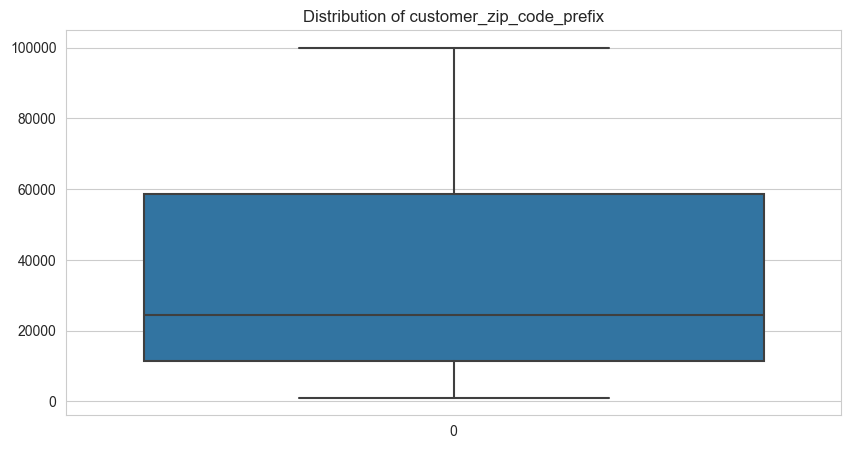

Skewness of no_of_orders: 10.676600298052568
Standard deviation of no_of_orders: 0.20649360862520988


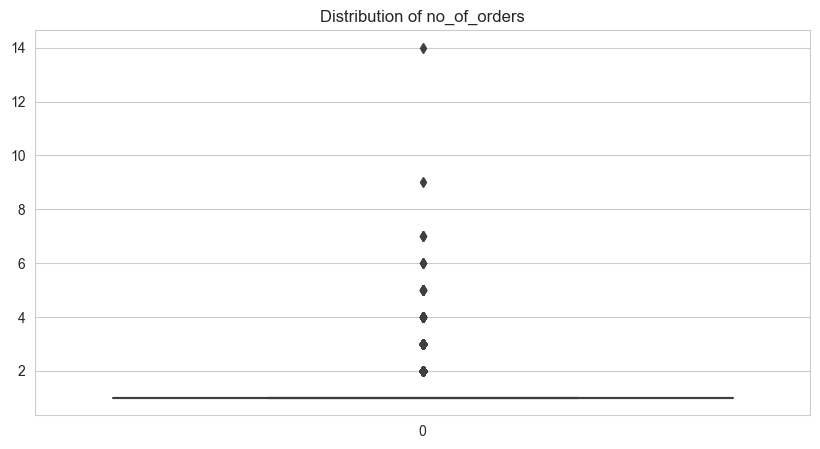

Skewness of purchased_approved: 1.6936650724829136
Standard deviation of purchased_approved: 23397.795858621448


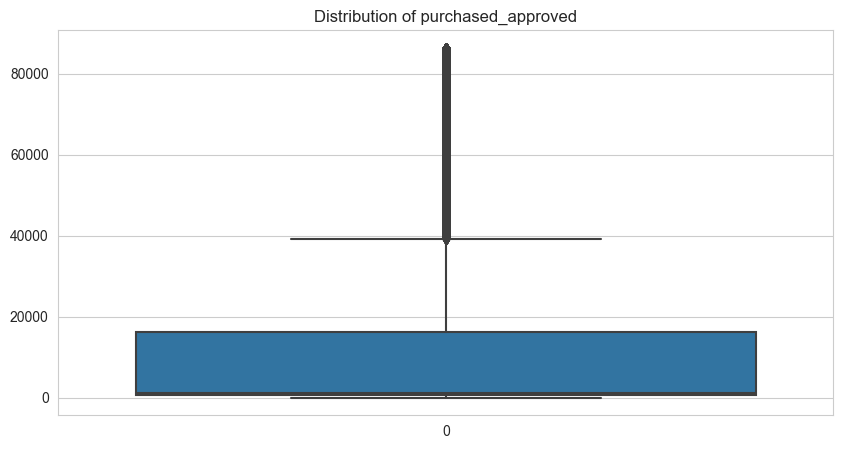

Skewness of delivered_estimated: -2.101764866389134
Standard deviation of delivered_estimated: 10.203242967048714


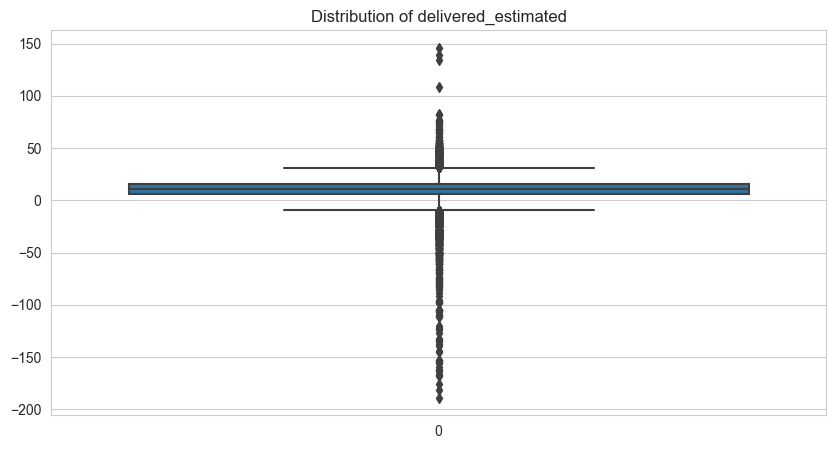

Skewness of purchased_delivered: 3.8851370289773977
Standard deviation of purchased_delivered: 9.568493285019958


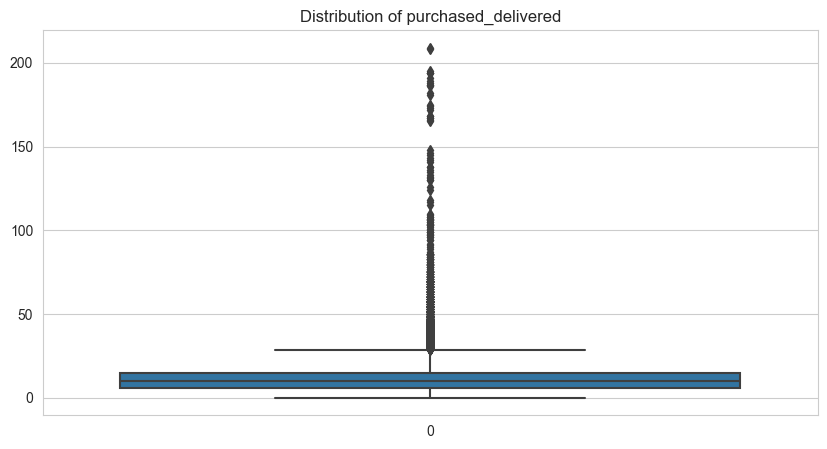

Skewness of no_of_products: 7.414378109080429
Standard deviation of no_of_products: 0.31373679944646404


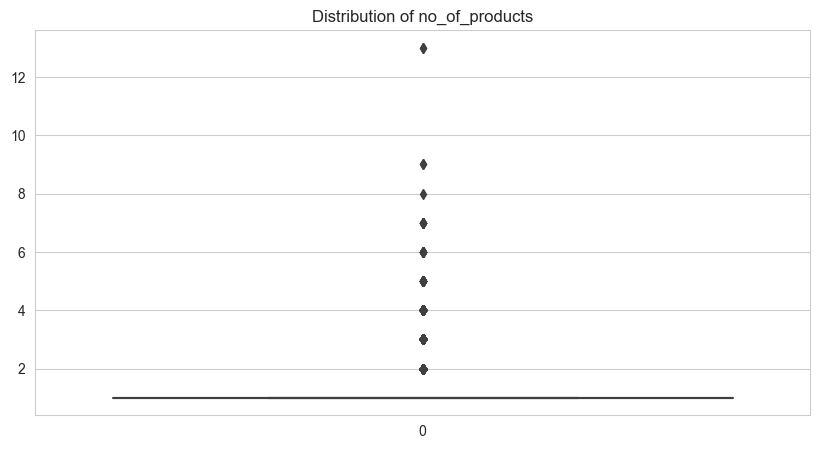

Skewness of price: 11.673286142641638
Standard deviation of price: 245.648186085988


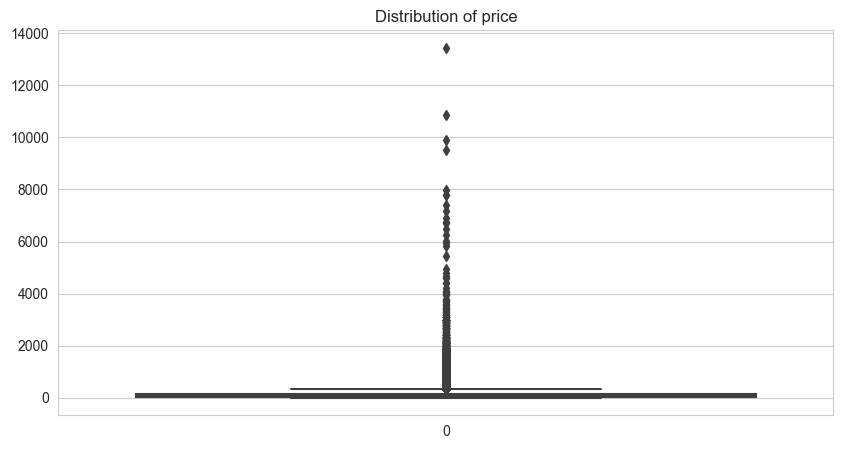

Skewness of freight_value: 13.404015071051449
Standard deviation of freight_value: 27.167210233851918


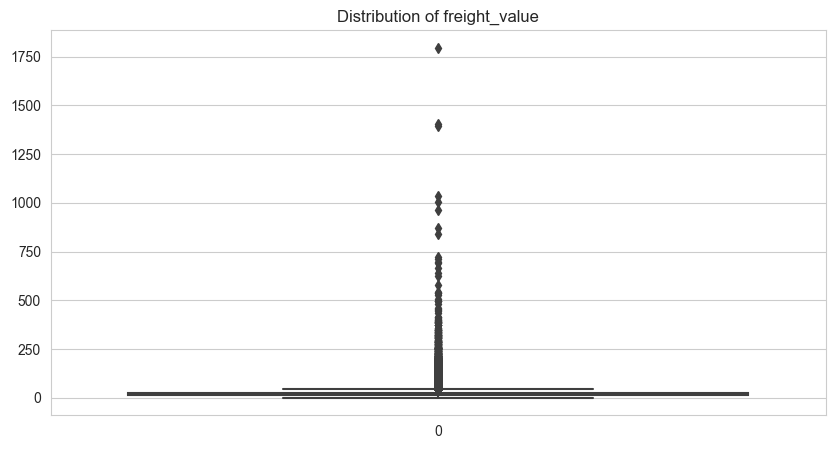

Skewness of product_weight_g: 12.103747627805273
Standard deviation of product_weight_g: 5870.34220607922


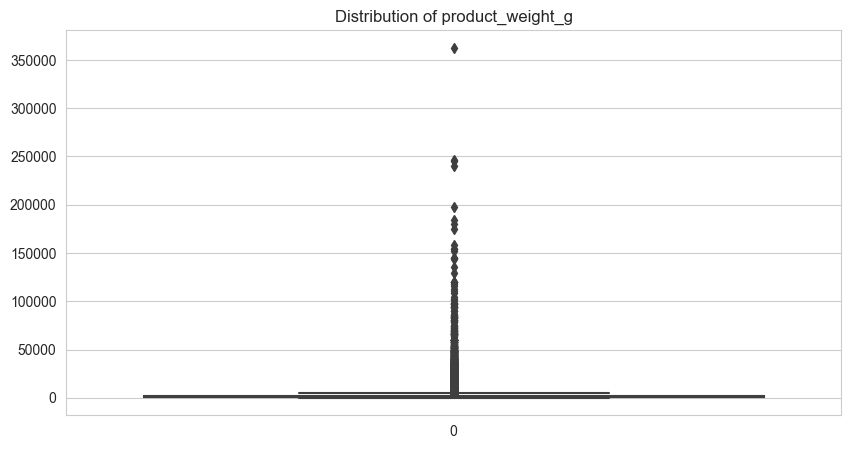

Skewness of product_length_cm: 15.455335601801671
Standard deviation of product_length_cm: 36.29532910933294


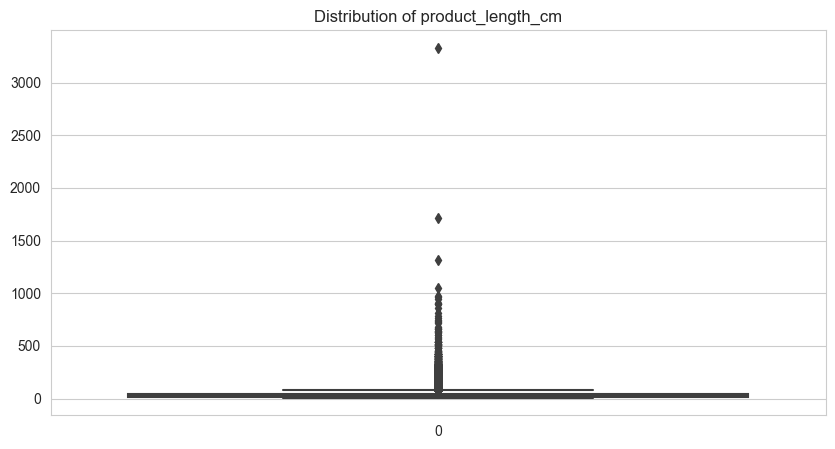

Skewness of product_height_cm: 14.319354023915139
Standard deviation of product_height_cm: 25.548808834973286


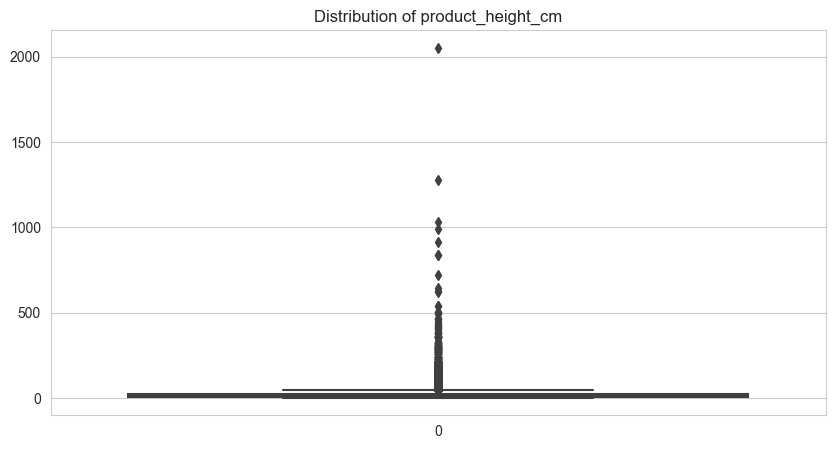

Skewness of product_width_cm: 15.990696995659524
Standard deviation of product_width_cm: 26.913001114896332


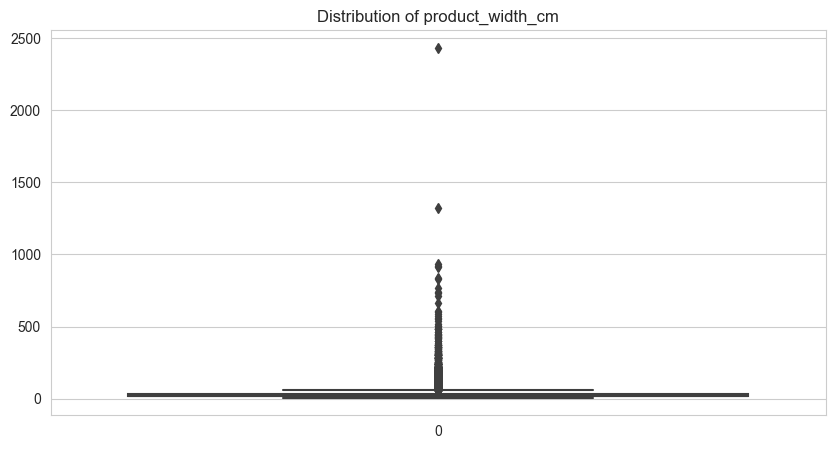

Skewness of geolocation_lat: 1.773152155669881
Standard deviation of geolocation_lat: 5.683911483397394


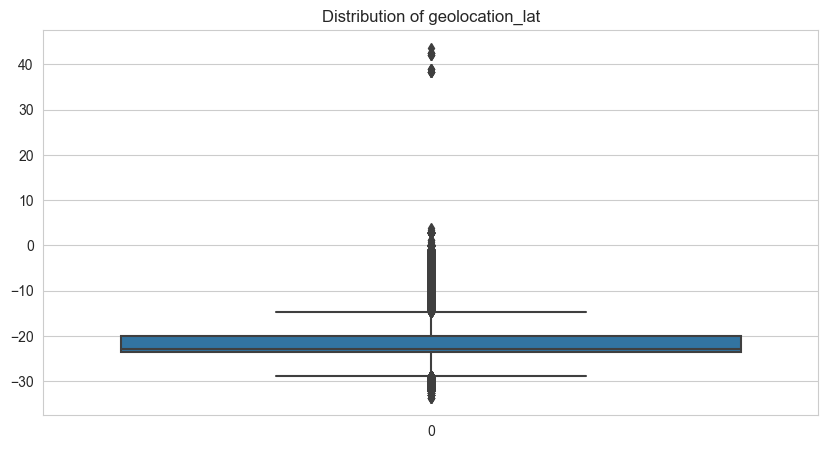

Skewness of geolocation_lng: 0.1892069766164438
Standard deviation of geolocation_lng: 4.09557910461328


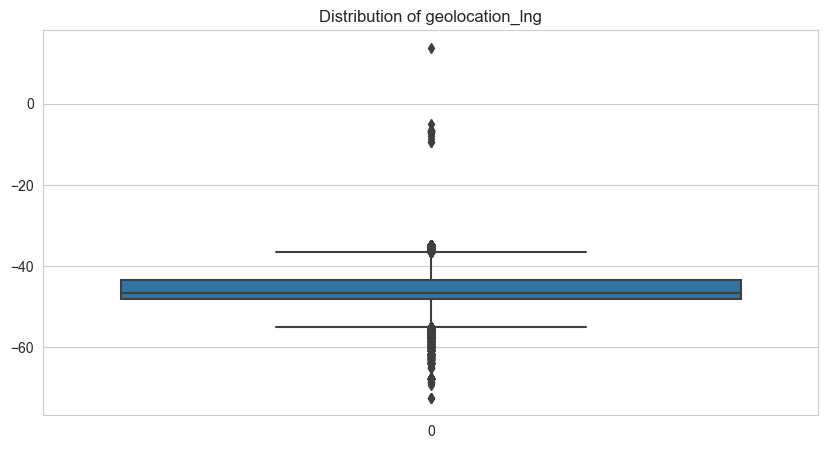

Skewness of payment_installments: 1.5985424567820286
Standard deviation of payment_installments: 2.728462973751188


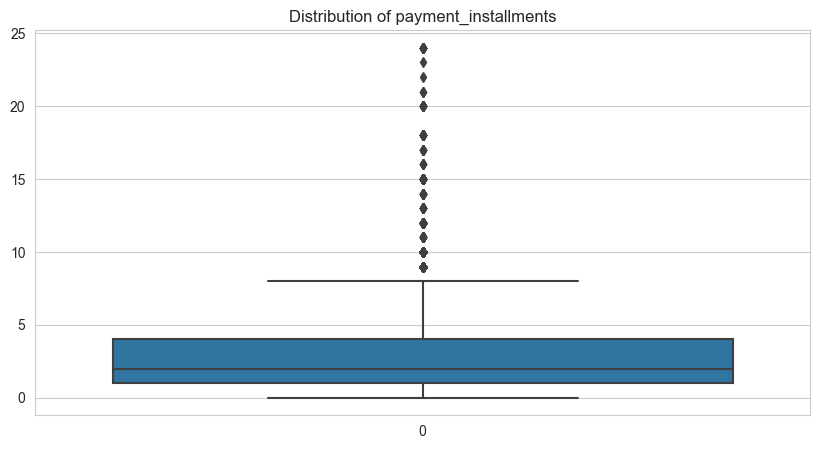

Skewness of payment_value: 69.45531310765217
Standard deviation of payment_value: 651.671327312369


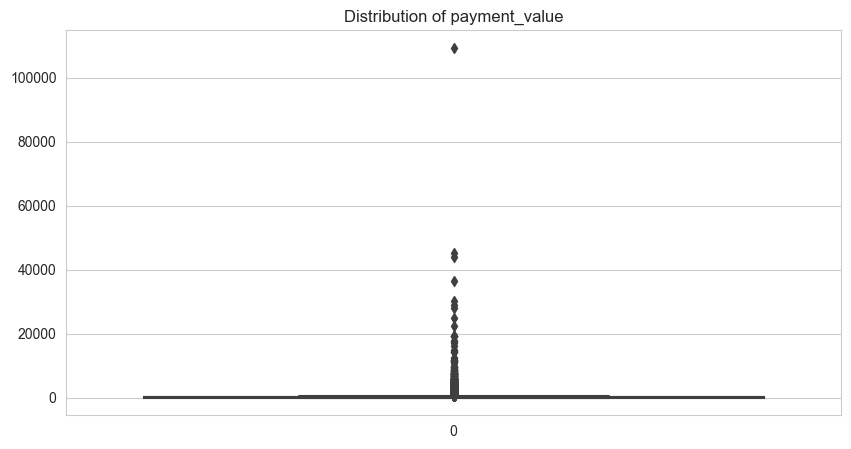

Skewness of review_score: -1.4753617649468038
Standard deviation of review_score: 1.2805415501520054


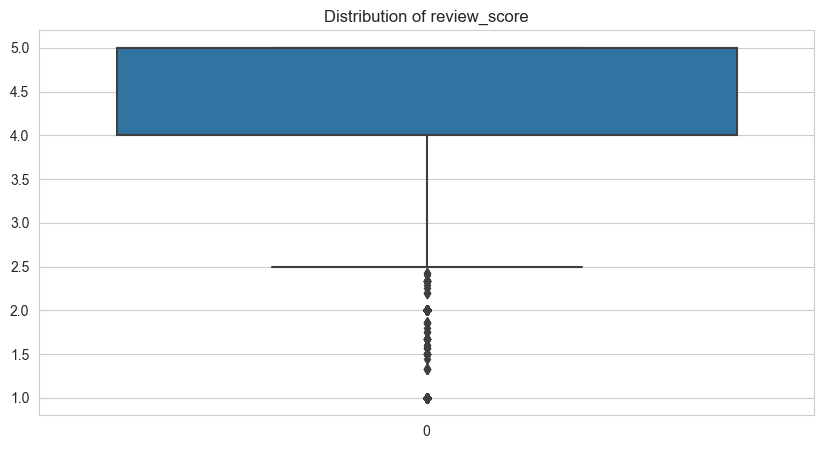

Skewness of Recency: 0.43585883202493925
Standard deviation of Recency: 152.38669351592222


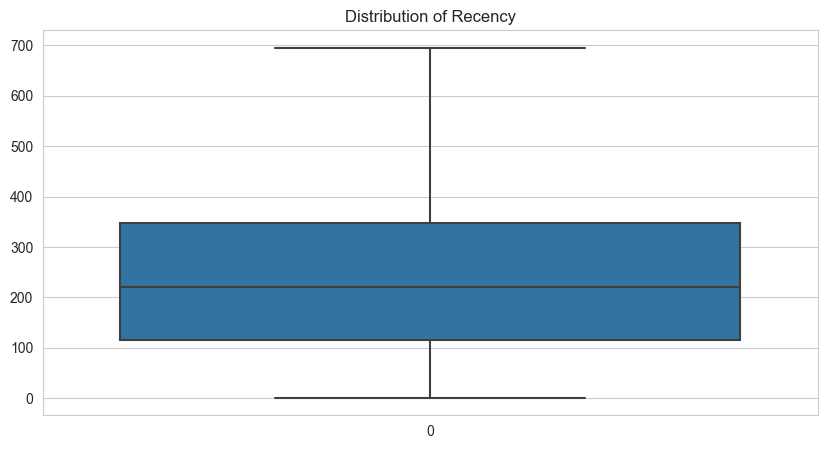

Skewness of Monetary: 69.45531310765217
Standard deviation of Monetary: 651.671327312369


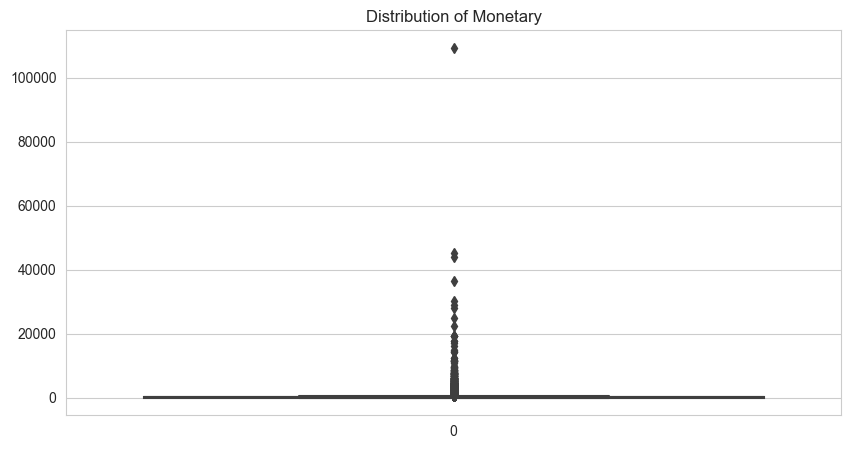

Skewness of Frequency: 10.676600298052568
Standard deviation of Frequency: 0.20649360862520988


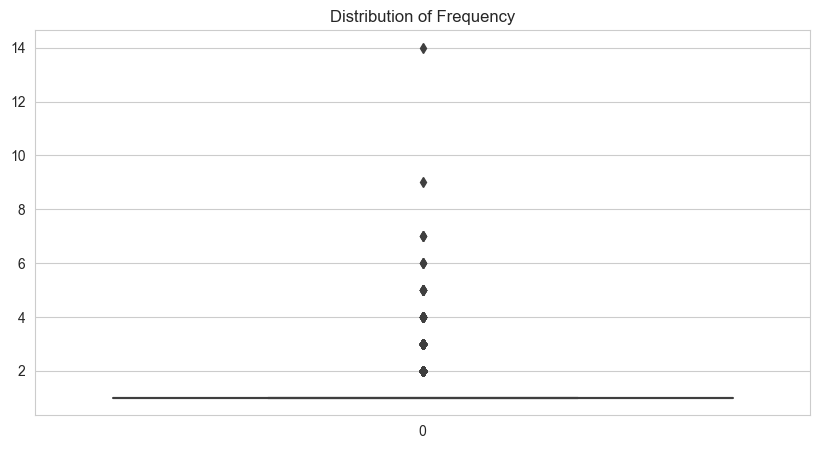

Skewness of Churn: 0.18446057597496182
Standard deviation of Churn: 0.4978896849076802


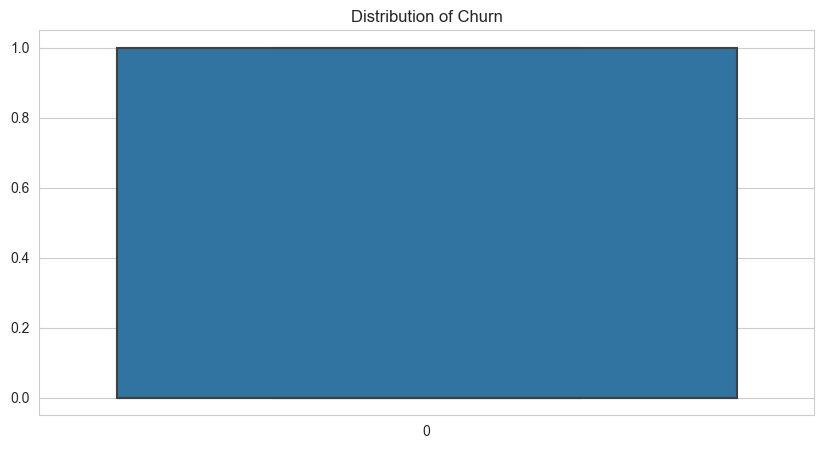

Skewness of recency_label: 0.0027075579320597677
Standard deviation of recency_label: 1.1188766774624876


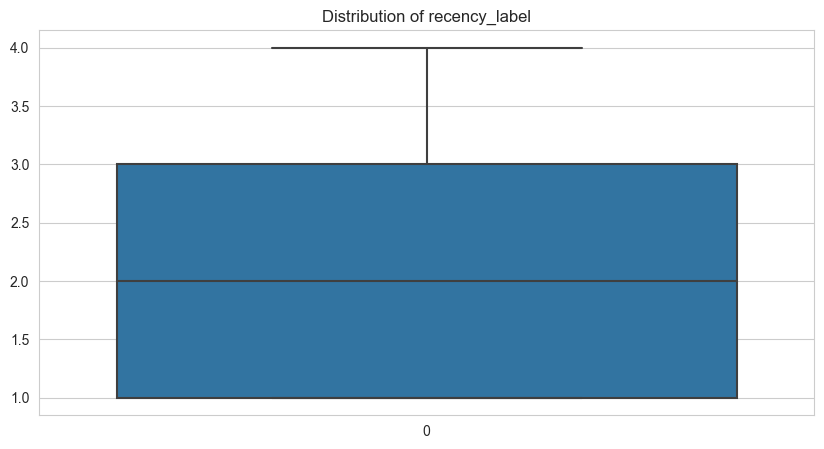

Skewness of monetary_label: -0.0001422766647447003
Standard deviation of monetary_label: 1.1180302816945955


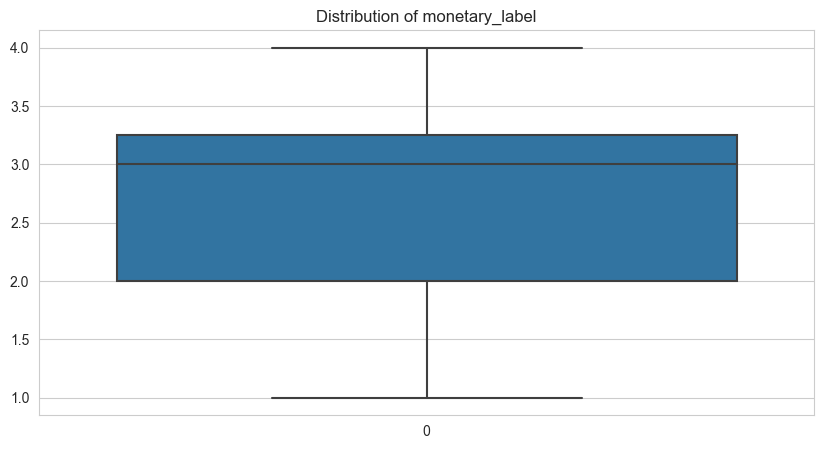

Skewness of frequency_label: 6.969597737221585
Standard deviation of frequency_label: 0.19537623285909483


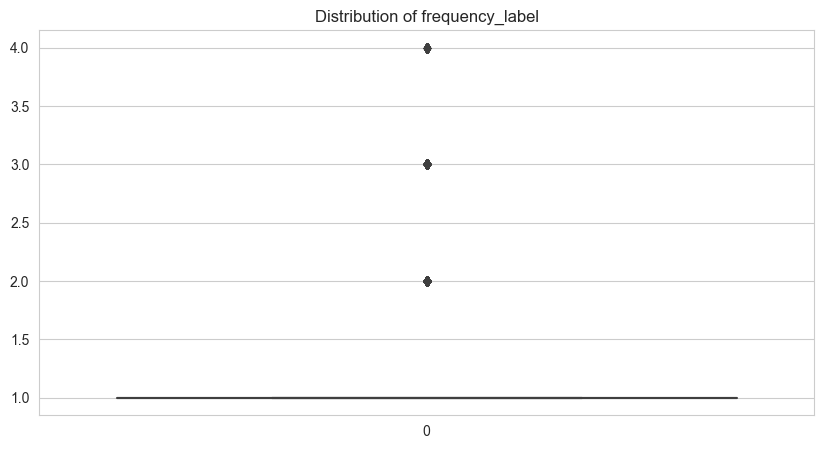

In [268]:
for col in final.select_dtypes(include = np.number).columns:
    plt.figure(figsize = (10, 5))
    print(f'Skewness of {col}: {final[col].skew()}')
    print(f'Standard deviation of {col}: {final[col].std()}')
    sns.boxplot(final[col])
    plt.title(f'Distribution of {col}')
    plt.show()

In [269]:
#final.drop(columns = ['customer_zip_code_prefix', 'no_of_orders', 'no_of_products', 'Frequency'], axis = 1, inplace = True)

In [270]:
#these are the values who doesnot add values to the column 

In [271]:
final_outlierTreated = final.copy()

In [272]:
for i in final_outlierTreated.select_dtypes(include = np.number).columns:
    q1 = final_outlierTreated[i].quantile(0.25)
    q3 = final_outlierTreated[i].quantile(0.75)
    iqr = q3 - q1
    ul = q3 + 1.5*iqr
    ll = q1 - 1.5*iqr
    final_outlierTreated[i] = np.where(final_outlierTreated[i]>ul,ul,final_outlierTreated[i])
    final_outlierTreated[i] = np.where(final_outlierTreated[i]<ll,ll,final_outlierTreated[i])

Skewness of customer_zip_code_prefix: 0.7815398325835958
Standard deviation of customer_zip_code_prefix: 29806.841040442094


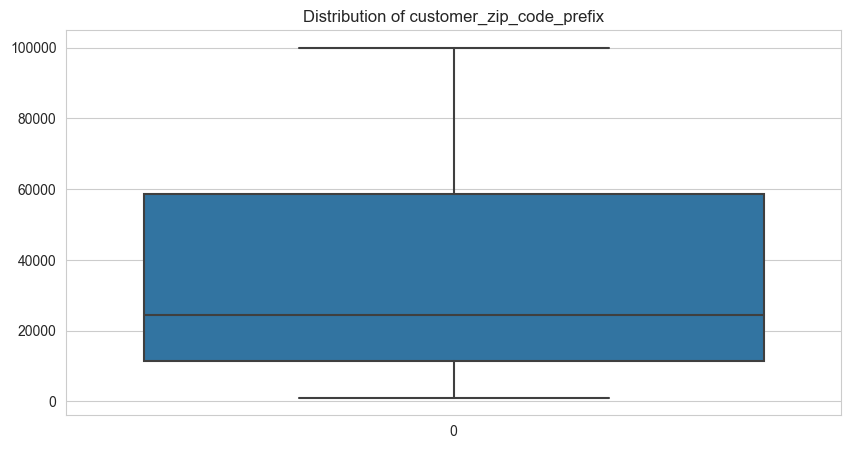

Skewness of no_of_orders: 0
Standard deviation of no_of_orders: 0.0


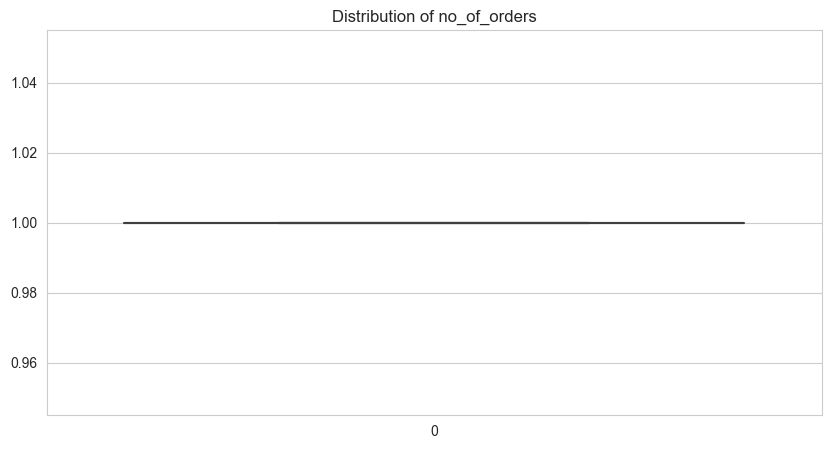

Skewness of purchased_approved: 1.2164391823519571
Standard deviation of purchased_approved: 15172.694355588796


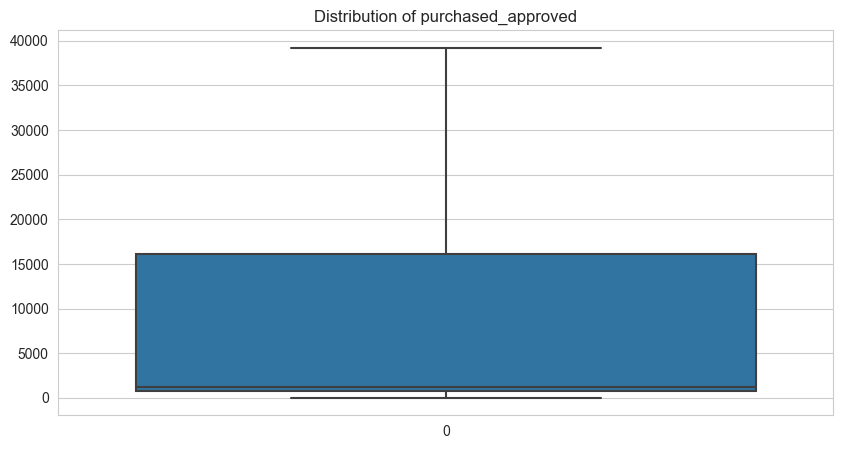

Skewness of delivered_estimated: -0.09874592372345704
Standard deviation of delivered_estimated: 8.274096249346677


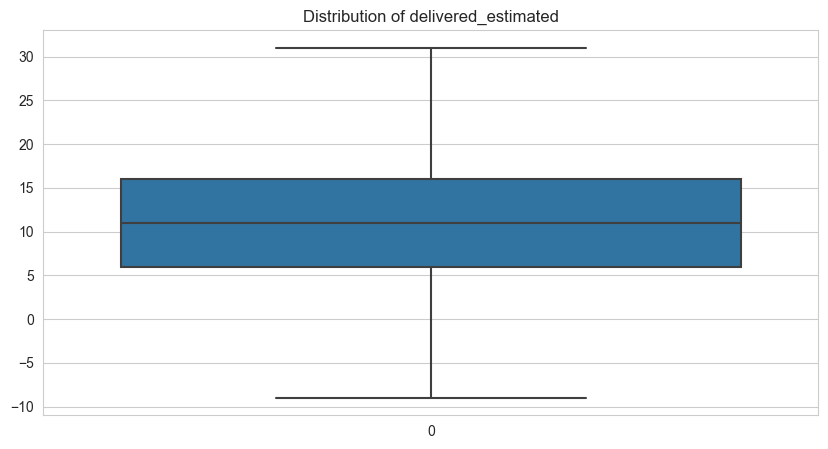

Skewness of purchased_delivered: 0.8756235891449513
Standard deviation of purchased_delivered: 7.115413212826002


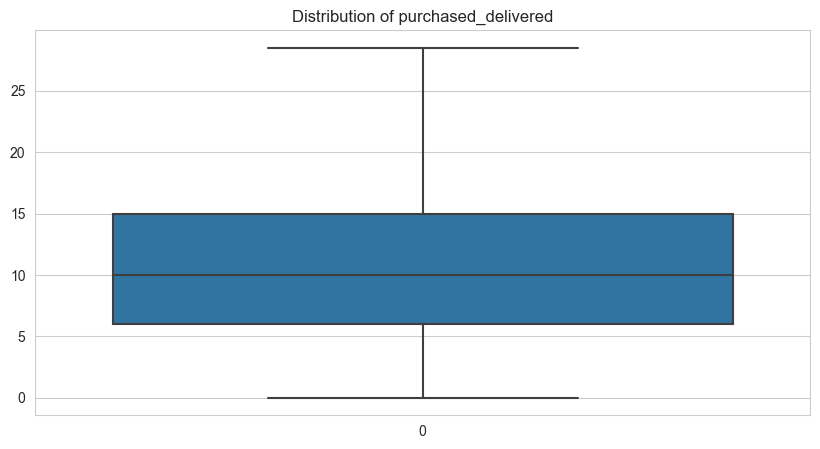

Skewness of no_of_products: 0
Standard deviation of no_of_products: 0.0


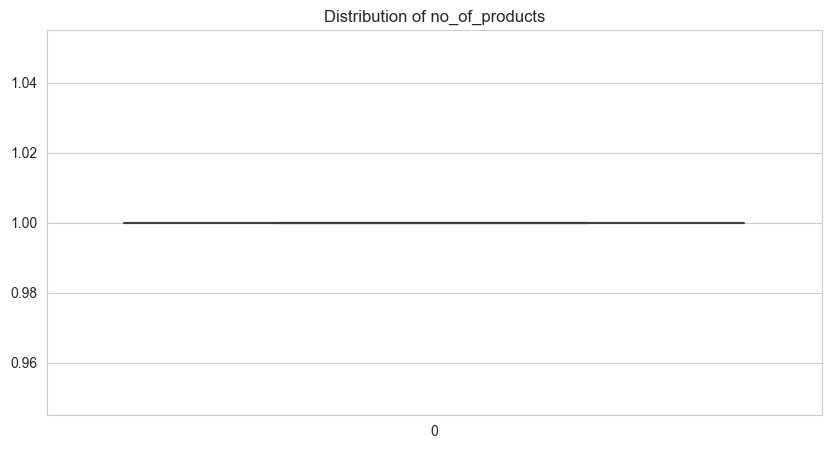

Skewness of price: 1.0575440832229996
Standard deviation of price: 92.37410737993144


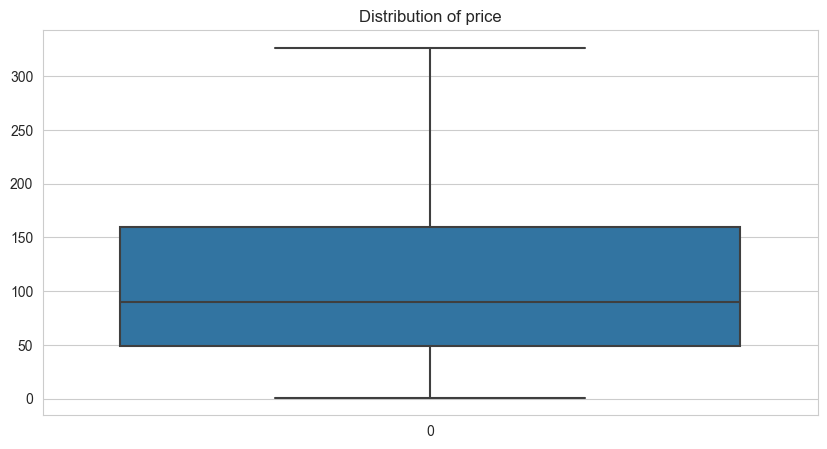

Skewness of freight_value: 0.9876807384042335
Standard deviation of freight_value: 11.171536270494622


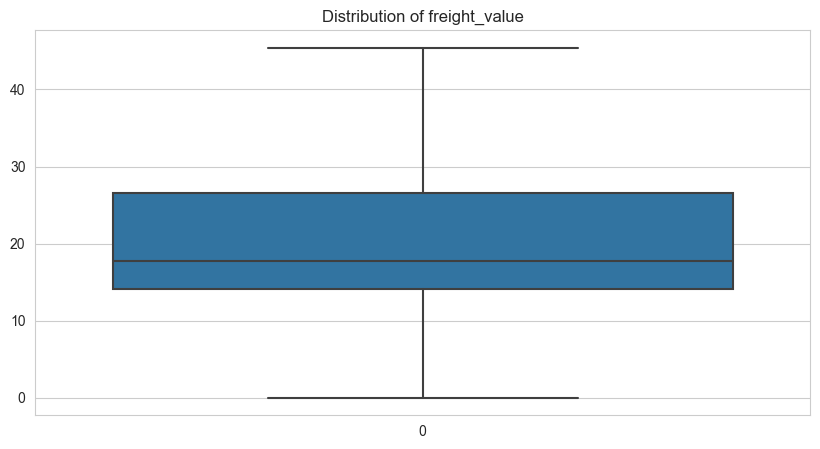

Skewness of product_weight_g: 1.1879390847711517
Standard deviation of product_weight_g: 1781.0525535942934


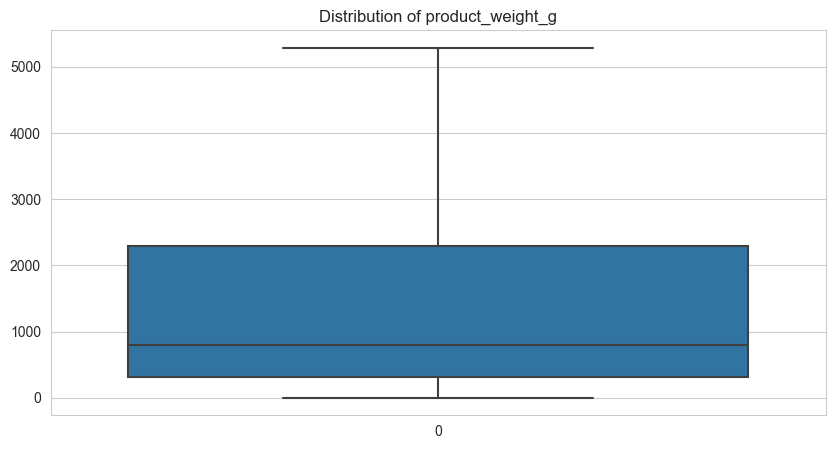

Skewness of product_length_cm: 1.1430465457339416
Standard deviation of product_length_cm: 19.238935199326814


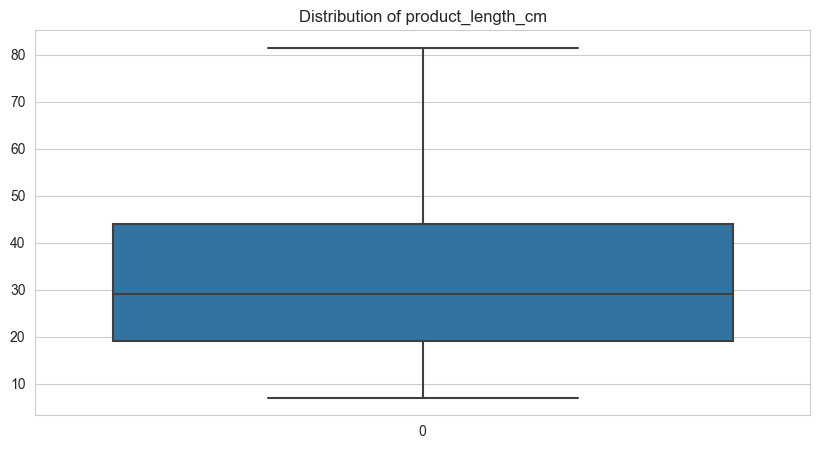

Skewness of product_height_cm: 0.97901647343929
Standard deviation of product_height_cm: 12.659453216679367


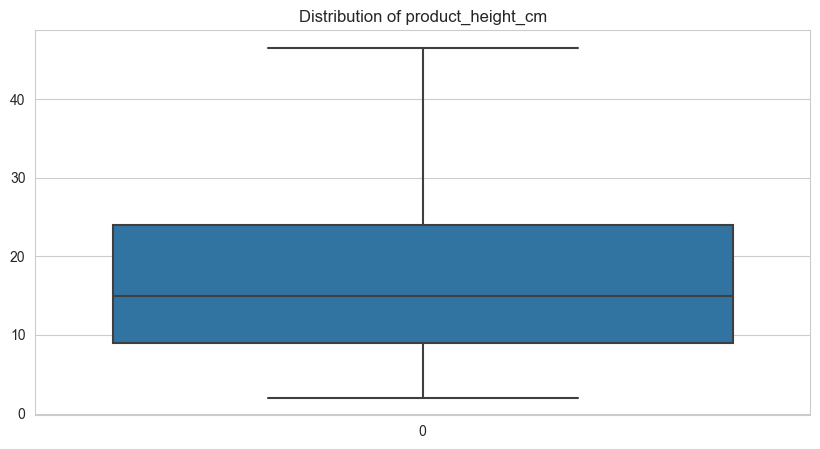

Skewness of product_width_cm: 1.122604493778157
Standard deviation of product_width_cm: 14.514932303921142


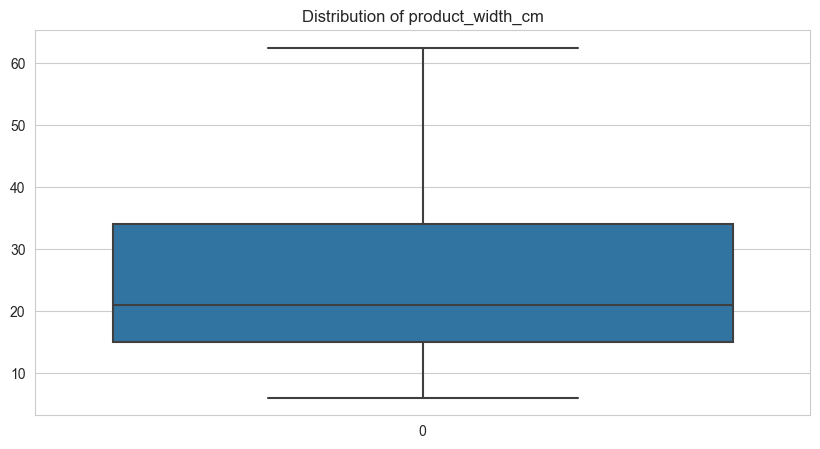

Skewness of geolocation_lat: 0.5304176530164698
Standard deviation of geolocation_lat: 3.67046321972773


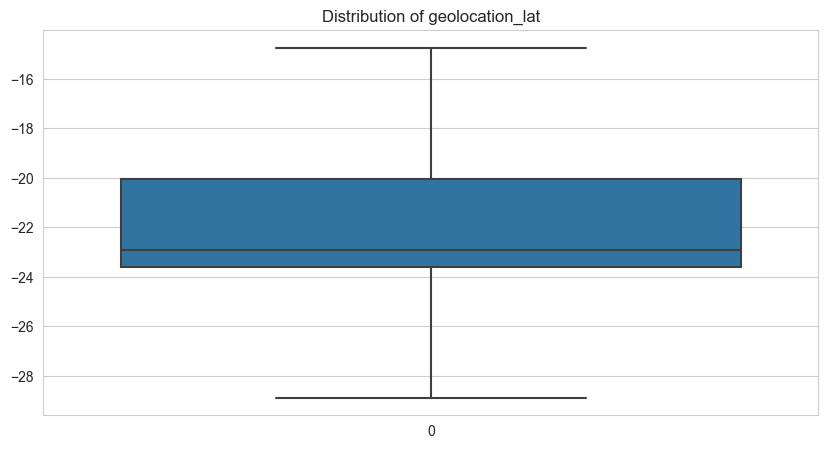

Skewness of geolocation_lng: 0.27977758204145975
Standard deviation of geolocation_lng: 3.801224553495541


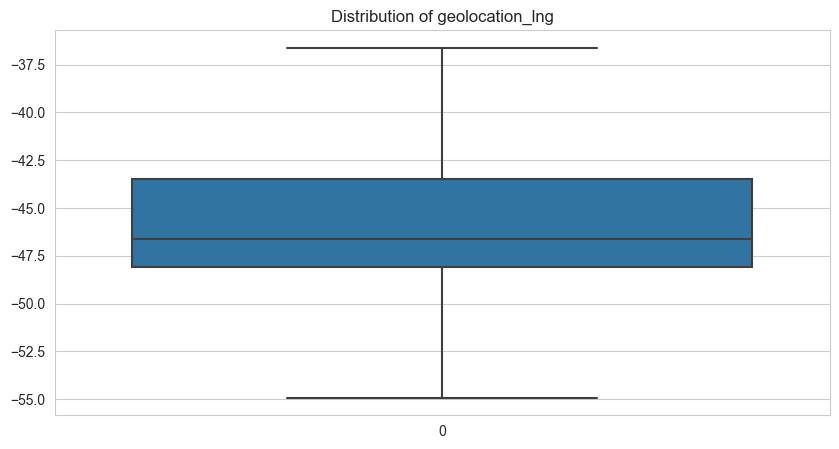

Skewness of payment_installments: 1.2118688690198518
Standard deviation of payment_installments: 2.4396707220778495


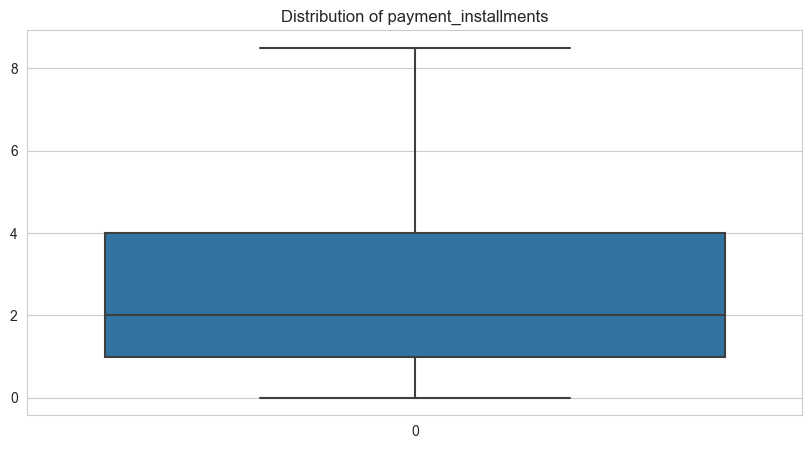

Skewness of payment_value: 1.0955798184308276
Standard deviation of payment_value: 117.7993255451284


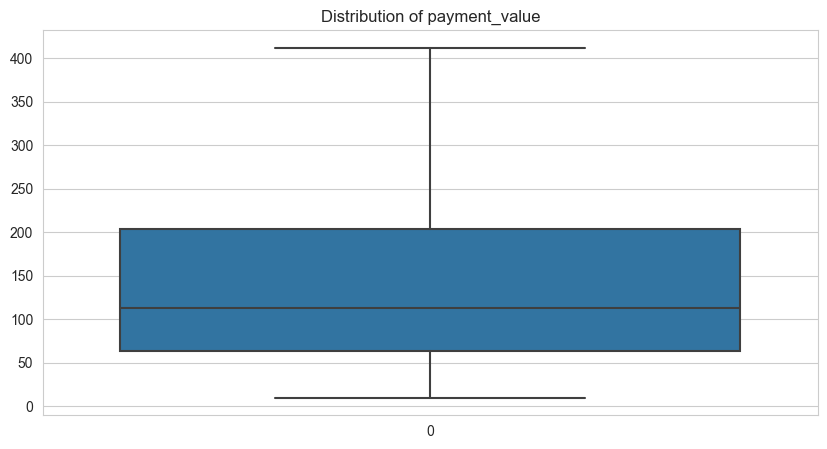

Skewness of review_score: -0.9578616204856851
Standard deviation of review_score: 0.928450874289621


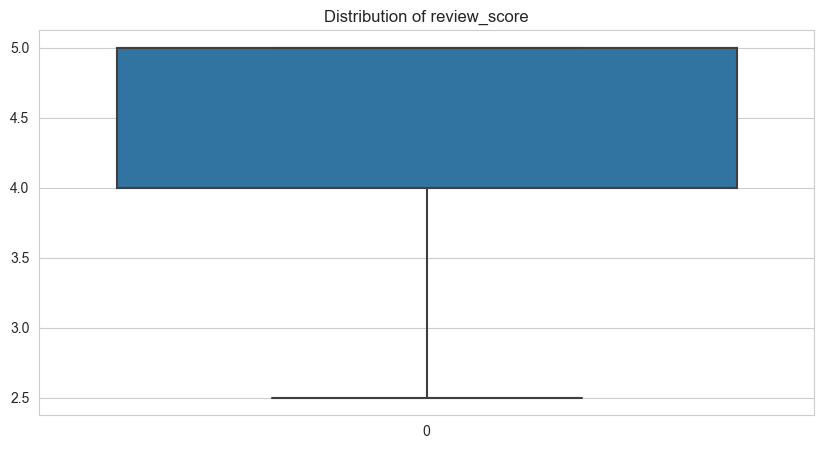

Skewness of Recency: 0.43585883202493925
Standard deviation of Recency: 152.38669351592222


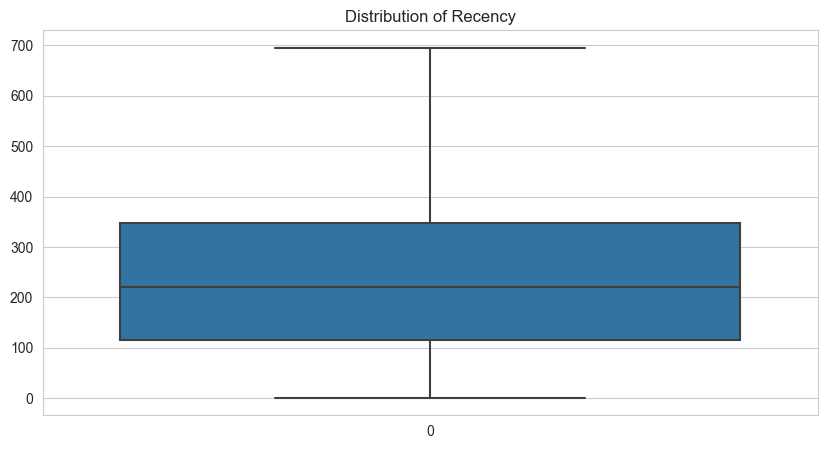

Skewness of Monetary: 1.0955798184308276
Standard deviation of Monetary: 117.7993255451284


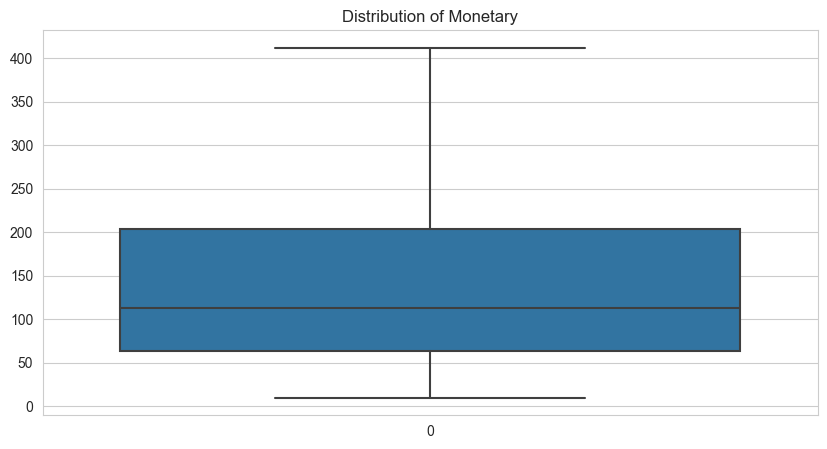

Skewness of Frequency: 0
Standard deviation of Frequency: 0.0


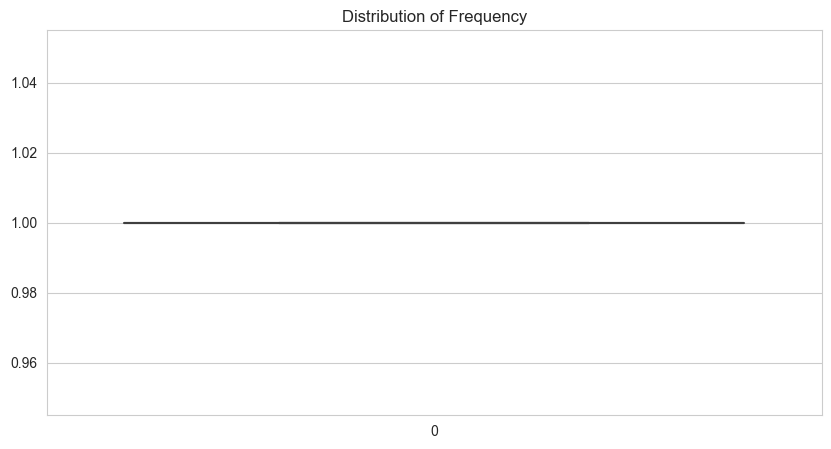

Skewness of Churn: 0.18446057597496182
Standard deviation of Churn: 0.4978896849076802


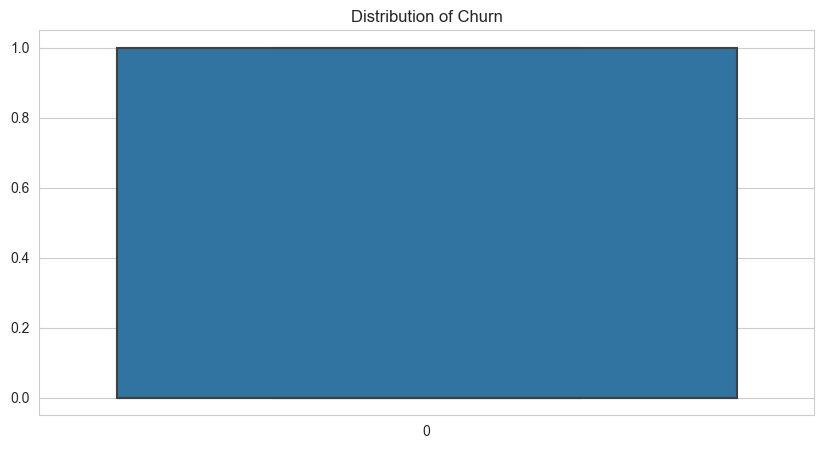

Skewness of recency_label: 0.0027075579320597677
Standard deviation of recency_label: 1.1188766774624876


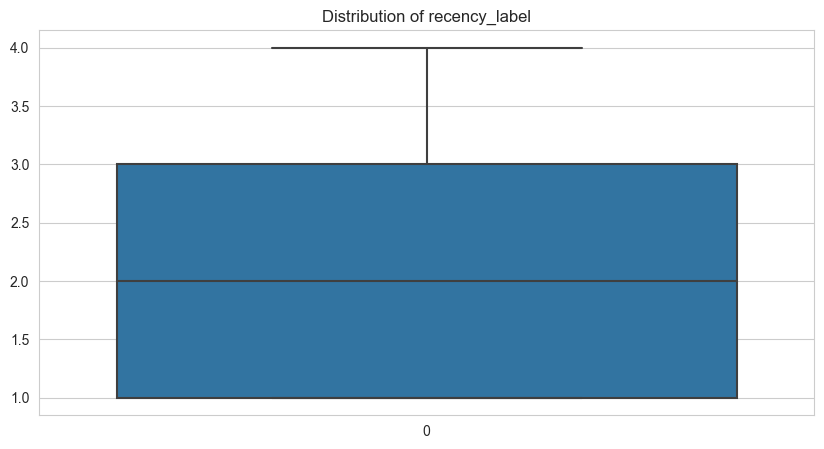

Skewness of monetary_label: -0.0001422766647447003
Standard deviation of monetary_label: 1.1180302816945955


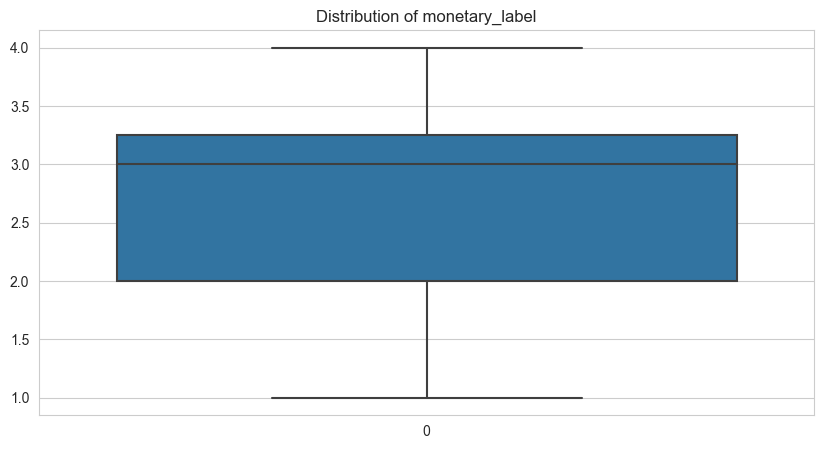

Skewness of frequency_label: 0
Standard deviation of frequency_label: 0.0


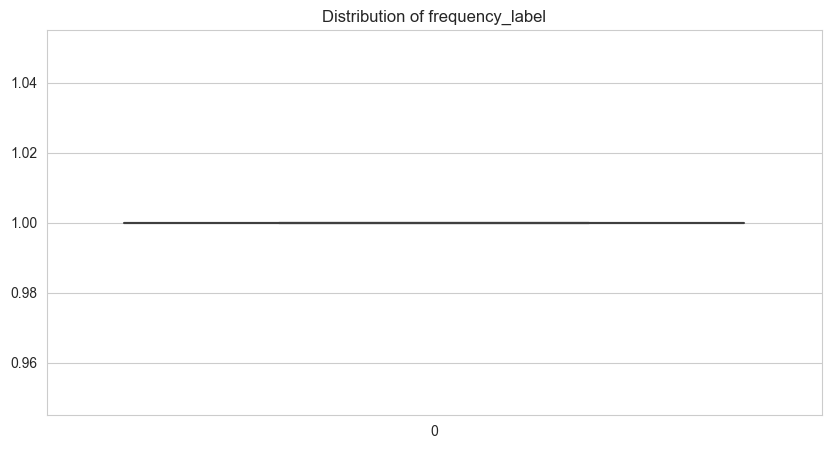

In [273]:
for col in final_outlierTreated.select_dtypes(include = np.number).columns:
    plt.figure(figsize = (10, 5))
    print(f'Skewness of {col}: {final_outlierTreated[col].skew()}')
    print(f'Standard deviation of {col}: {final_outlierTreated[col].std()}')
    sns.boxplot(final_outlierTreated[col])
    plt.title(f'Distribution of {col}')
    plt.show()

In [274]:
final_outlierTreated.shape

(90528, 30)

In [275]:
final_outlierTreated.isna().sum() / len(final) * 100

customer_unique_id          0.000000
customer_zip_code_prefix    0.000000
customer_city               0.000000
customer_state              0.000000
no_of_orders                0.000000
purchased_approved          0.000000
delivered_estimated         0.000000
purchased_delivered         0.000000
no_of_products              0.000000
price                       0.000000
freight_value               0.000000
product_weight_g            0.000000
product_length_cm           0.000000
product_height_cm           0.000000
product_width_cm            0.000000
geolocation_lat             0.000000
geolocation_lng             0.000000
payment_type                0.000000
payment_installments        0.000000
payment_value               0.000000
review_score                0.650627
Recency                     0.000000
Monetary                    0.000000
Frequency                   0.000000
Churn                       0.000000
Rank                        0.000000
rank_rm                     0.000000
r

In [276]:
final_outlierTreated.drop(columns = ['review_score'], axis = 1, inplace = True)

In [277]:
#85% of review score is Nan so we are dropping it 

In [278]:
final_outlierTreated.Churn.value_counts(normalize = True) * 100

0.0    54.591949
1.0    45.408051
Name: Churn, dtype: float64

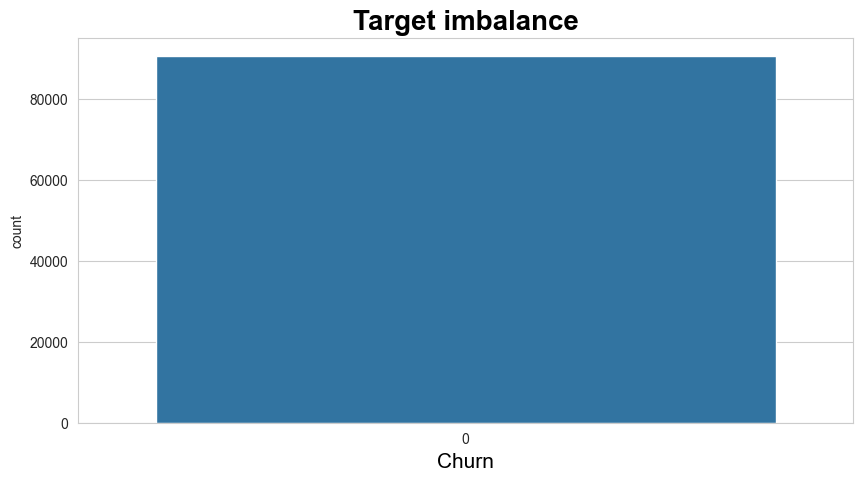

In [279]:
plt.figure(figsize=(10, 5))
sns.countplot(final_outlierTreated.Churn)
plt.xlabel('Churn',color='black',fontsize=15)
plt.title('Target imbalance',color='black',fontsize=20,fontweight='bold')
plt.show()

In [280]:
# target is balanced so we dont upsampling the data

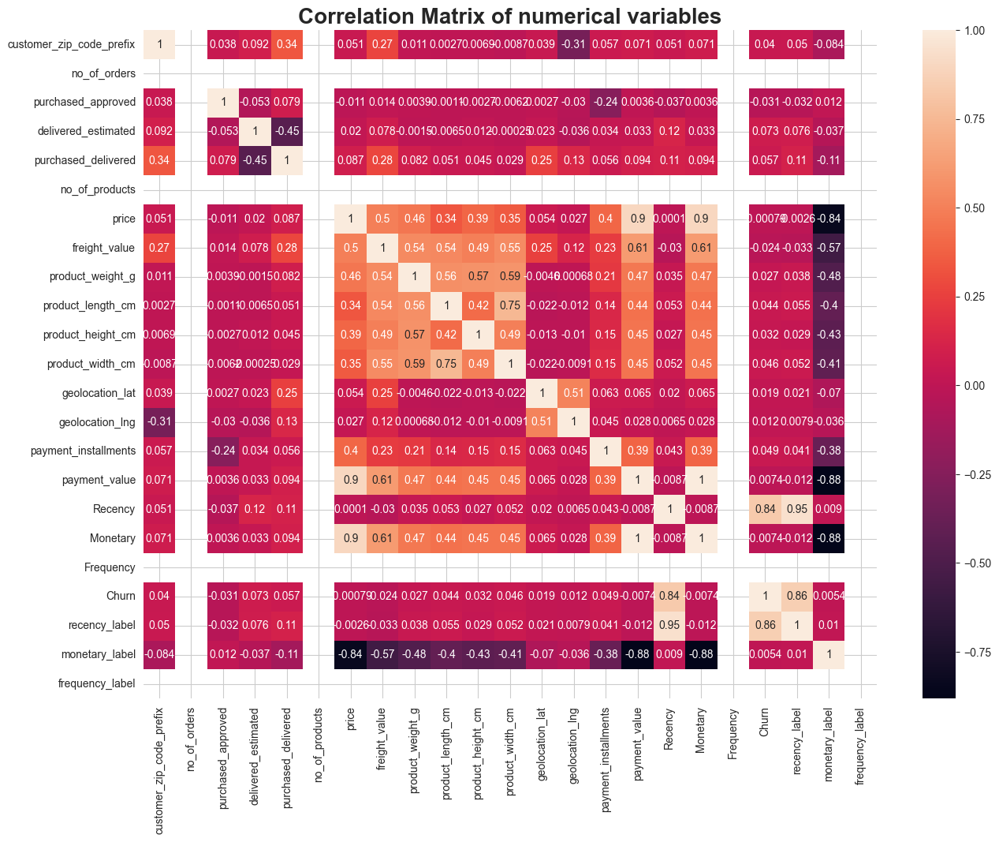

In [281]:
plt.figure(figsize=(15,11))
sns.heatmap(final_outlierTreated.corr(), annot = True)
plt.title('Correlation Matrix of numerical variables',fontsize=20,fontweight='bold')
plt.show()

In [282]:
#from the above table we can clearly

In [283]:
final_outlierTreated.drop(columns = ['customer_zip_code_prefix', 'no_of_orders', 'no_of_products', 'Frequency'], axis = 1, inplace = True)


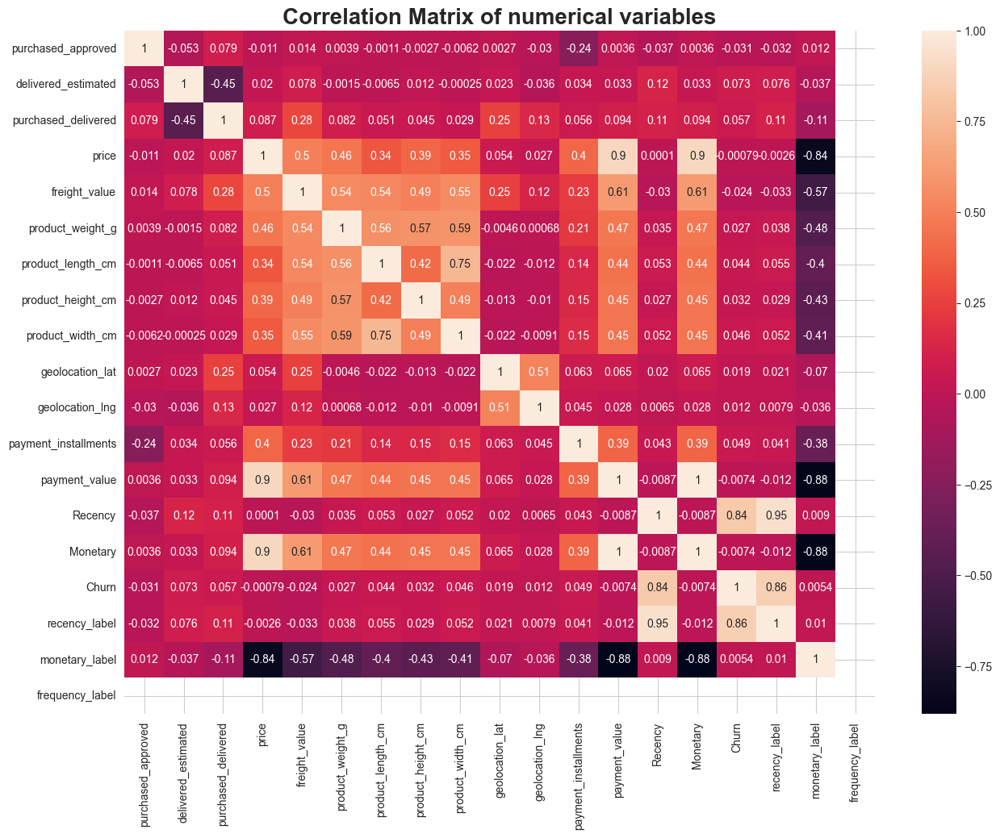

In [284]:
plt.figure(figsize=(15,11))
sns.heatmap(final_outlierTreated.corr(), annot = True)
plt.title('Correlation Matrix of numerical variables',fontsize=20,fontweight='bold')
plt.show()

In [285]:
import pycaret as py

In [286]:
from pycaret.classification import*

In [287]:
#model=setup(final_outlierTreated,target='Churn')

In [288]:
#compare_models()

In [289]:
final_outlierTreated

,customer_unique_id,customer_city,customer_state,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,Recency,Monetary,Churn,Rank,rank_rm,recency_label,monetary_label,frequency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,891.000,4.0,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,credit_card,8.0,141.90000,111.0,141.90000,0.0,"(1, 1, 2)","(1, 2)",1.0,2.0,1.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,SP,26057.000,4.0,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,credit_card,1.0,27.19000,114.0,27.19000,0.0,"(1, 1, 4)","(1, 4)",1.0,4.0,1.0
2,0000f46a3911fa3c0805444483337064,sao jose,SC,0.000,1.0,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-27.532246,-48.618667,credit_card,8.0,86.22000,537.0,86.22000,1.0,"(4, 1, 3)","(4, 3)",4.0,3.0,1.0
3,0000f6ccb0745a6a4b88665a16c9f078,belem,PA,1176.000,11.0,20.0,25.99,17.63,150.0,19.0,5.0,11.0,-14.737871,-48.476339,credit_card,4.0,43.62000,321.0,43.62000,1.0,"(3, 1, 4)","(3, 4)",3.0,4.0,1.0
4,0004aac84e0df4da2b147fca70cf8255,sorocaba,SP,1270.000,7.0,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-23.496567,-47.462811,credit_card,6.0,196.89000,288.0,196.89000,1.0,"(3, 1, 2)","(3, 2)",3.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90523,fffcf5a5ff07b0908bd4e2dbc735a684,sanharo,PE,880.000,26.0,27.0,326.40,45.40,5288.0,81.5,46.5,62.5,-14.737871,-36.625202,credit_card,8.5,411.94375,447.0,411.94375,1.0,"(4, 1, 1)","(4, 1)",4.0,1.0,1.0
90524,fffea47cd6d3cc0a88bd621562a9d061,feira de santana,BA,504.000,2.0,28.5,64.89,19.69,1720.0,33.0,36.0,27.0,-14.737871,-38.952416,credit_card,1.0,84.58000,262.0,84.58000,1.0,"(3, 1, 3)","(3, 3)",3.0,3.0,1.0
90525,ffff371b4d645b6ecea244b27531430a,sinop,MT,808.000,29.0,14.0,89.90,22.56,600.0,17.0,15.0,13.0,-14.737871,-54.921403,credit_card,1.0,112.46000,568.0,112.46000,1.0,"(4, 1, 3)","(4, 3)",4.0,3.0,1.0
90526,ffff5962728ec6157033ef9805bacc48,bom jesus do norte,ES,2466.000,13.0,11.0,115.00,18.69,444.0,20.0,14.0,16.0,-21.120385,-41.665221,credit_card,5.0,133.69000,119.0,133.69000,0.0,"(2, 1, 2)","(2, 2)",2.0,2.0,1.0


In [290]:
#total 204 city present

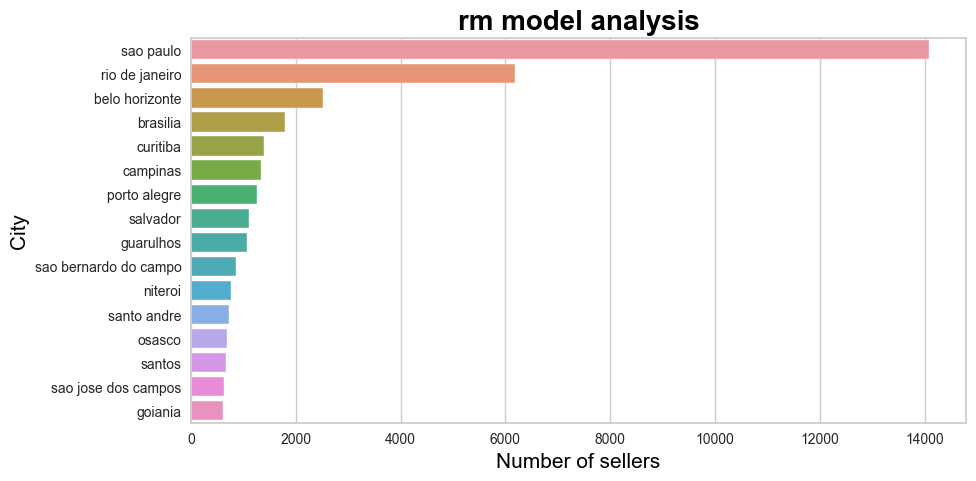

In [291]:
plt.figure(figsize=(10, 5))
sns.barplot(y = final_outlierTreated.customer_city.value_counts().index[:16], x = final_outlierTreated.customer_city.value_counts().values[:16])
plt.xlabel('Number of sellers',color='black',fontsize=15)
plt.ylabel('City',color='black',fontsize=15)
plt.title('rm model analysis',color='black',fontsize=20,fontweight='bold')
plt.show()

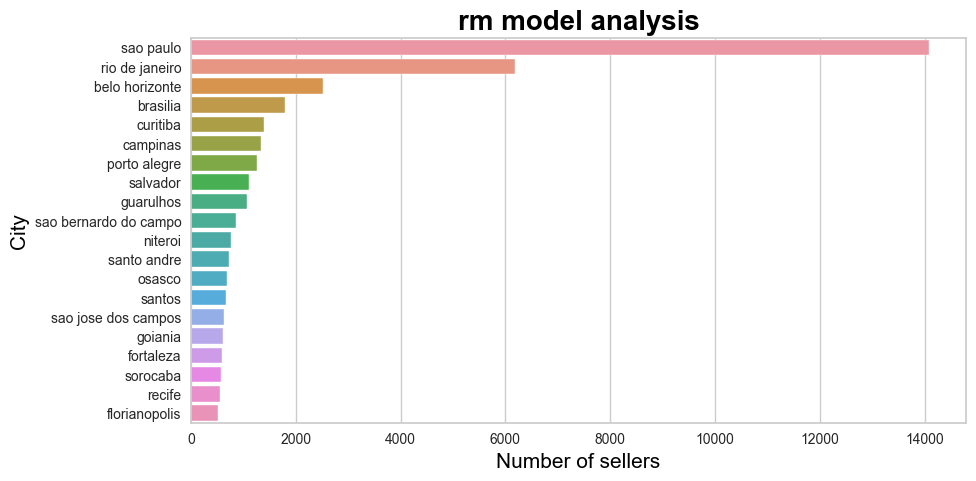

In [292]:
plt.figure(figsize=(10, 5))
sns.barplot(y = final_outlierTreated.customer_city.value_counts().index[:20], x = final_outlierTreated.customer_city.value_counts().values[:20])
plt.xlabel('Number of sellers',color='black',fontsize=15)
plt.ylabel('City',color='black',fontsize=15)
plt.title('rm model analysis',color='black',fontsize=20,fontweight='bold')
plt.show()

In [293]:
final_outlierTreated


,customer_unique_id,customer_city,customer_state,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,Recency,Monetary,Churn,Rank,rank_rm,recency_label,monetary_label,frequency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,891.000,4.0,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,credit_card,8.0,141.90000,111.0,141.90000,0.0,"(1, 1, 2)","(1, 2)",1.0,2.0,1.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,SP,26057.000,4.0,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,credit_card,1.0,27.19000,114.0,27.19000,0.0,"(1, 1, 4)","(1, 4)",1.0,4.0,1.0
2,0000f46a3911fa3c0805444483337064,sao jose,SC,0.000,1.0,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-27.532246,-48.618667,credit_card,8.0,86.22000,537.0,86.22000,1.0,"(4, 1, 3)","(4, 3)",4.0,3.0,1.0
3,0000f6ccb0745a6a4b88665a16c9f078,belem,PA,1176.000,11.0,20.0,25.99,17.63,150.0,19.0,5.0,11.0,-14.737871,-48.476339,credit_card,4.0,43.62000,321.0,43.62000,1.0,"(3, 1, 4)","(3, 4)",3.0,4.0,1.0
4,0004aac84e0df4da2b147fca70cf8255,sorocaba,SP,1270.000,7.0,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-23.496567,-47.462811,credit_card,6.0,196.89000,288.0,196.89000,1.0,"(3, 1, 2)","(3, 2)",3.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90523,fffcf5a5ff07b0908bd4e2dbc735a684,sanharo,PE,880.000,26.0,27.0,326.40,45.40,5288.0,81.5,46.5,62.5,-14.737871,-36.625202,credit_card,8.5,411.94375,447.0,411.94375,1.0,"(4, 1, 1)","(4, 1)",4.0,1.0,1.0
90524,fffea47cd6d3cc0a88bd621562a9d061,feira de santana,BA,504.000,2.0,28.5,64.89,19.69,1720.0,33.0,36.0,27.0,-14.737871,-38.952416,credit_card,1.0,84.58000,262.0,84.58000,1.0,"(3, 1, 3)","(3, 3)",3.0,3.0,1.0
90525,ffff371b4d645b6ecea244b27531430a,sinop,MT,808.000,29.0,14.0,89.90,22.56,600.0,17.0,15.0,13.0,-14.737871,-54.921403,credit_card,1.0,112.46000,568.0,112.46000,1.0,"(4, 1, 3)","(4, 3)",4.0,3.0,1.0
90526,ffff5962728ec6157033ef9805bacc48,bom jesus do norte,ES,2466.000,13.0,11.0,115.00,18.69,444.0,20.0,14.0,16.0,-21.120385,-41.665221,credit_card,5.0,133.69000,119.0,133.69000,0.0,"(2, 1, 2)","(2, 2)",2.0,2.0,1.0


In [294]:
final_outlierTreated.columns

Index(['customer_unique_id', 'customer_city', 'customer_state',
       'purchased_approved', 'delivered_estimated', 'purchased_delivered',
       'price', 'freight_value', 'product_weight_g', 'product_length_cm',
       'product_height_cm', 'product_width_cm', 'geolocation_lat',
       'geolocation_lng', 'payment_type', 'payment_installments',
       'payment_value', 'Recency', 'Monetary', 'Churn', 'Rank', 'rank_rm',
       'recency_label', 'monetary_label', 'frequency_label'],
      dtype='object')

In [295]:
final_outlierTreated.drop(columns=['Rank','rank_rm'],axis=1,inplace=True)

In [296]:
final_outlierTreated


,customer_unique_id,customer_city,customer_state,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,Recency,Monetary,Churn,recency_label,monetary_label,frequency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,891.000,4.0,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-23.333580,-46.823060,credit_card,8.0,141.90000,111.0,141.90000,0.0,1.0,2.0,1.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,SP,26057.000,4.0,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-23.545029,-46.781482,credit_card,1.0,27.19000,114.0,27.19000,0.0,1.0,4.0,1.0
2,0000f46a3911fa3c0805444483337064,sao jose,SC,0.000,1.0,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-27.532246,-48.618667,credit_card,8.0,86.22000,537.0,86.22000,1.0,4.0,3.0,1.0
3,0000f6ccb0745a6a4b88665a16c9f078,belem,PA,1176.000,11.0,20.0,25.99,17.63,150.0,19.0,5.0,11.0,-14.737871,-48.476339,credit_card,4.0,43.62000,321.0,43.62000,1.0,3.0,4.0,1.0
4,0004aac84e0df4da2b147fca70cf8255,sorocaba,SP,1270.000,7.0,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-23.496567,-47.462811,credit_card,6.0,196.89000,288.0,196.89000,1.0,3.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90523,fffcf5a5ff07b0908bd4e2dbc735a684,sanharo,PE,880.000,26.0,27.0,326.40,45.40,5288.0,81.5,46.5,62.5,-14.737871,-36.625202,credit_card,8.5,411.94375,447.0,411.94375,1.0,4.0,1.0,1.0
90524,fffea47cd6d3cc0a88bd621562a9d061,feira de santana,BA,504.000,2.0,28.5,64.89,19.69,1720.0,33.0,36.0,27.0,-14.737871,-38.952416,credit_card,1.0,84.58000,262.0,84.58000,1.0,3.0,3.0,1.0
90525,ffff371b4d645b6ecea244b27531430a,sinop,MT,808.000,29.0,14.0,89.90,22.56,600.0,17.0,15.0,13.0,-14.737871,-54.921403,credit_card,1.0,112.46000,568.0,112.46000,1.0,4.0,3.0,1.0
90526,ffff5962728ec6157033ef9805bacc48,bom jesus do norte,ES,2466.000,13.0,11.0,115.00,18.69,444.0,20.0,14.0,16.0,-21.120385,-41.665221,credit_card,5.0,133.69000,119.0,133.69000,0.0,2.0,2.0,1.0


In [297]:
transformed_data = final_outlierTreated.copy()
transformed_data['Churn'] = transformed_data['Churn'].astype('object')

In [298]:
transformed_data.skew()

purchased_approved      1.216439
delivered_estimated    -0.098746
purchased_delivered     0.875624
price                   1.057544
freight_value           0.987681
product_weight_g        1.187939
product_length_cm       1.143047
product_height_cm       0.979016
product_width_cm        1.122604
geolocation_lat         0.530418
geolocation_lng         0.279778
payment_installments    1.211869
payment_value           1.095580
Recency                 0.435859
Monetary                1.095580
Churn                   0.184461
recency_label           0.002708
monetary_label         -0.000142
frequency_label         0.000000
dtype: float64

In [299]:
transformed_data.describe()

,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_installments,payment_value,Recency,Monetary,recency_label,monetary_label,frequency_label
count,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.000000,90528.0
mean,10218.379244,10.918180,11.544891,118.326475,21.445156,1635.126580,34.429966,18.084836,26.467855,-21.859878,-46.111407,2.837614,153.228395,238.733773,153.228395,2.497415,2.500066,1.0
std,15172.694356,8.274096,7.115413,92.374107,11.171536,1781.052554,19.238935,12.659453,14.514932,3.670463,3.801225,2.439671,117.799326,152.386694,117.799326,1.118877,1.118030,0.0
min,0.000000,-9.000000,0.000000,0.850000,0.000000,0.000000,7.000000,2.000000,6.000000,-28.882827,-54.921403,0.000000,9.590000,1.000000,9.590000,1.000000,1.000000,1.0
25%,756.000000,6.000000,6.000000,48.900000,14.100000,308.000000,19.000000,9.000000,15.000000,-23.578469,-48.060327,1.000000,63.837500,115.000000,63.837500,1.000000,2.000000,1.0
50%,1164.000000,11.000000,10.000000,89.900000,17.690000,800.000000,29.000000,15.000000,21.000000,-22.898404,-46.614879,2.000000,112.990000,220.000000,112.990000,2.000000,3.000000,1.0
75%,16142.250000,16.000000,15.000000,159.900000,26.620000,2300.000000,44.000000,24.000000,34.000000,-20.042230,-43.486277,4.000000,203.080000,347.000000,203.080000,3.000000,3.250000,1.0
max,39221.625000,31.000000,28.500000,326.400000,45.400000,5288.000000,81.500000,46.500000,62.500000,-14.737871,-36.625202,8.500000,411.943750,695.000000,411.943750,4.000000,4.000000,1.0


In [300]:
pt = PowerTransformer(method = 'yeo-johnson')
for var in transformed_data:
    if var in ['delivered_estimated','geolocation_lat','geolocation_lng']:
        transformed_data[var] = pt.fit_transform(transformed_data[[var]])

In [301]:
 transformed_data.skew()

purchased_approved      1.216439
delivered_estimated     0.102573
purchased_delivered     0.875624
price                   1.057544
freight_value           0.987681
product_weight_g        1.187939
product_length_cm       1.143047
product_height_cm       0.979016
product_width_cm        1.122604
geolocation_lat         0.032696
geolocation_lng        -0.013325
payment_installments    1.211869
payment_value           1.095580
Recency                 0.435859
Monetary                1.095580
Churn                   0.184461
recency_label           0.002708
monetary_label         -0.000142
frequency_label         0.000000
dtype: float64

In [302]:
#pt = PowerTransformer(method='box-cox')
#for var in transformed_data.select_dtypes(include=np.number):
#    if var not in ['delivered_estimated','geolocation_lat','geolocation_lng']:
#        transformed_data[var] = pt.fit_transform(0.001 + transformed_data[[var]])

In [303]:
transformed_data.head()


,customer_unique_id,customer_city,customer_state,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,Recency,Monetary,Churn,recency_label,monetary_label,frequency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar,SP,891.0,-0.866609,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-0.339009,-0.147663,credit_card,8.0,141.90,111.0,141.90,0.0,1.0,2.0,1.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,SP,26057.0,-0.866609,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-0.403676,-0.136448,credit_card,1.0,27.19,114.0,27.19,0.0,1.0,4.0,1.0
2,0000f46a3911fa3c0805444483337064,sao jose,SC,0.0,-1.214404,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-1.742476,-0.641800,credit_card,8.0,86.22,537.0,86.22,1.0,4.0,3.0,1.0
3,0000f6ccb0745a6a4b88665a16c9f078,belem,PA,1176.0,-0.016225,20.0,25.99,17.63,150.0,19.0,5.0,11.0,1.762773,-0.601932,credit_card,4.0,43.62,321.0,43.62,1.0,3.0,4.0,1.0
4,0004aac84e0df4da2b147fca70cf8255,sorocaba,SP,1270.0,-0.506891,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-0.388799,-0.321518,credit_card,6.0,196.89,288.0,196.89,1.0,3.0,2.0,1.0


In [304]:
def state_encoding(state):
    if state in ['RS', 'SC', 'PR']:
        return 'southern'
    elif state in ['SP', 'RJ', 'MG', 'ES']:
        return 'southeastern'
    elif state in ['MT', 'MS', 'GO', 'DF']:
        return 'centralwestern'
    elif state in ['MA', 'PI', 'CE', 'RN', 'PB', 'PE', 'AL', 'SE', 'BA']:
        return 'northeastern'
    else: 
        return 'northern'

In [305]:
transformed_data['customer_state'] = transformed_data['customer_state'].apply(state_encoding)

In [306]:
features = transformed_data.copy()
features.head()

,customer_unique_id,customer_city,customer_state,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,payment_value,Recency,Monetary,Churn,recency_label,monetary_label,frequency_label
0,0000366f3b9a7992bf8c76cfdf3221e2,cajamar,southeastern,891.0,-0.866609,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-0.339009,-0.147663,credit_card,8.0,141.90,111.0,141.90,0.0,1.0,2.0,1.0
1,0000b849f77a49e4a4ce2b2a4ca5be3f,osasco,southeastern,26057.0,-0.866609,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-0.403676,-0.136448,credit_card,1.0,27.19,114.0,27.19,0.0,1.0,4.0,1.0
2,0000f46a3911fa3c0805444483337064,sao jose,southern,0.0,-1.214404,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-1.742476,-0.641800,credit_card,8.0,86.22,537.0,86.22,1.0,4.0,3.0,1.0
3,0000f6ccb0745a6a4b88665a16c9f078,belem,northern,1176.0,-0.016225,20.0,25.99,17.63,150.0,19.0,5.0,11.0,1.762773,-0.601932,credit_card,4.0,43.62,321.0,43.62,1.0,3.0,4.0,1.0
4,0004aac84e0df4da2b147fca70cf8255,sorocaba,southeastern,1270.0,-0.506891,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-0.388799,-0.321518,credit_card,6.0,196.89,288.0,196.89,1.0,3.0,2.0,1.0


In [307]:
features.drop(columns = ['customer_unique_id', 'customer_city', 'payment_value'], axis = 1, inplace = True)

In [308]:
#payment is the monetary value so it must be dropped 


In [309]:
features

,customer_state,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,Recency,Monetary,Churn,recency_label,monetary_label,frequency_label
0,southeastern,891.000,-0.866609,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-0.339009,-0.147663,credit_card,8.0,111.0,141.90000,0.0,1.0,2.0,1.0
1,southeastern,26057.000,-0.866609,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-0.403676,-0.136448,credit_card,1.0,114.0,27.19000,0.0,1.0,4.0,1.0
2,southern,0.000,-1.214404,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-1.742476,-0.641800,credit_card,8.0,537.0,86.22000,1.0,4.0,3.0,1.0
3,northern,1176.000,-0.016225,20.0,25.99,17.63,150.0,19.0,5.0,11.0,1.762773,-0.601932,credit_card,4.0,321.0,43.62000,1.0,3.0,4.0,1.0
4,southeastern,1270.000,-0.506891,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-0.388799,-0.321518,credit_card,6.0,288.0,196.89000,1.0,3.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90523,northeastern,880.000,1.887712,27.0,326.40,45.40,5288.0,81.5,46.5,62.5,1.762773,2.296510,credit_card,8.5,447.0,411.94375,1.0,4.0,1.0,1.0
90524,northeastern,504.000,-1.100359,28.5,64.89,19.69,1720.0,33.0,36.0,27.0,1.762773,1.792765,credit_card,1.0,262.0,84.58000,1.0,3.0,3.0,1.0
90525,centralwestern,808.000,2.276663,14.0,89.90,22.56,600.0,17.0,15.0,13.0,1.762773,-2.528450,credit_card,1.0,568.0,112.46000,1.0,4.0,3.0,1.0
90526,southeastern,2466.000,0.232586,11.0,115.00,18.69,444.0,20.0,14.0,16.0,0.300000,1.165312,credit_card,5.0,119.0,133.69000,0.0,2.0,2.0,1.0


In [310]:
features['Churn']=features['Churn'].astype(int)

In [311]:
features

,customer_state,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_type,payment_installments,Recency,Monetary,Churn,recency_label,monetary_label,frequency_label
0,southeastern,891.000,-0.866609,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-0.339009,-0.147663,credit_card,8.0,111.0,141.90000,0,1.0,2.0,1.0
1,southeastern,26057.000,-0.866609,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-0.403676,-0.136448,credit_card,1.0,114.0,27.19000,0,1.0,4.0,1.0
2,southern,0.000,-1.214404,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-1.742476,-0.641800,credit_card,8.0,537.0,86.22000,1,4.0,3.0,1.0
3,northern,1176.000,-0.016225,20.0,25.99,17.63,150.0,19.0,5.0,11.0,1.762773,-0.601932,credit_card,4.0,321.0,43.62000,1,3.0,4.0,1.0
4,southeastern,1270.000,-0.506891,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-0.388799,-0.321518,credit_card,6.0,288.0,196.89000,1,3.0,2.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90523,northeastern,880.000,1.887712,27.0,326.40,45.40,5288.0,81.5,46.5,62.5,1.762773,2.296510,credit_card,8.5,447.0,411.94375,1,4.0,1.0,1.0
90524,northeastern,504.000,-1.100359,28.5,64.89,19.69,1720.0,33.0,36.0,27.0,1.762773,1.792765,credit_card,1.0,262.0,84.58000,1,3.0,3.0,1.0
90525,centralwestern,808.000,2.276663,14.0,89.90,22.56,600.0,17.0,15.0,13.0,1.762773,-2.528450,credit_card,1.0,568.0,112.46000,1,4.0,3.0,1.0
90526,southeastern,2466.000,0.232586,11.0,115.00,18.69,444.0,20.0,14.0,16.0,0.300000,1.165312,credit_card,5.0,119.0,133.69000,0,2.0,2.0,1.0


In [312]:
features['payment_type'].value_counts()

credit_card    67738
boleto         17918
voucher         3477
debit_card      1395
Name: payment_type, dtype: int64

In [313]:
features['customer_state'].value_counts()

southeastern      62218
southern          12963
northeastern       8553
centralwestern     5104
northern           1690
Name: customer_state, dtype: int64

In [314]:
rfm_churn=pd.get_dummies(features,columns=['payment_type','customer_state'])

In [315]:
rfm_churn

,purchased_approved,delivered_estimated,purchased_delivered,price,freight_value,product_weight_g,product_length_cm,product_height_cm,product_width_cm,geolocation_lat,geolocation_lng,payment_installments,Recency,Monetary,Churn,recency_label,monetary_label,frequency_label,payment_type_boleto,payment_type_credit_card,payment_type_debit_card,payment_type_voucher,customer_state_centralwestern,customer_state_northeastern,customer_state_northern,customer_state_southeastern,customer_state_southern
0,891.000,-0.866609,6.0,129.90,12.00,1500.0,34.0,7.0,32.0,-0.339009,-0.147663,8.0,111.0,141.90000,0,1.0,2.0,1.0,0,1,0,0,0,0,0,1,0
1,26057.000,-0.866609,3.0,18.90,8.29,375.0,26.0,11.0,18.0,-0.403676,-0.136448,1.0,114.0,27.19000,0,1.0,4.0,1.0,0,1,0,0,0,0,0,1,0
2,0.000,-1.214404,25.0,69.00,17.22,1500.0,25.0,46.5,35.0,-1.742476,-0.641800,8.0,537.0,86.22000,1,4.0,3.0,1.0,0,1,0,0,0,0,0,0,1
3,1176.000,-0.016225,20.0,25.99,17.63,150.0,19.0,5.0,11.0,1.762773,-0.601932,4.0,321.0,43.62000,1,3.0,4.0,1.0,0,1,0,0,0,0,1,0,0
4,1270.000,-0.506891,13.0,180.00,16.89,5288.0,16.0,3.0,11.0,-0.388799,-0.321518,6.0,288.0,196.89000,1,3.0,2.0,1.0,0,1,0,0,0,0,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
90523,880.000,1.887712,27.0,326.40,45.40,5288.0,81.5,46.5,62.5,1.762773,2.296510,8.5,447.0,411.94375,1,4.0,1.0,1.0,0,1,0,0,0,1,0,0,0
90524,504.000,-1.100359,28.5,64.89,19.69,1720.0,33.0,36.0,27.0,1.762773,1.792765,1.0,262.0,84.58000,1,3.0,3.0,1.0,0,1,0,0,0,1,0,0,0
90525,808.000,2.276663,14.0,89.90,22.56,600.0,17.0,15.0,13.0,1.762773,-2.528450,1.0,568.0,112.46000,1,4.0,3.0,1.0,0,1,0,0,1,0,0,0,0
90526,2466.000,0.232586,11.0,115.00,18.69,444.0,20.0,14.0,16.0,0.300000,1.165312,5.0,119.0,133.69000,0,2.0,2.0,1.0,0,1,0,0,0,0,0,1,0


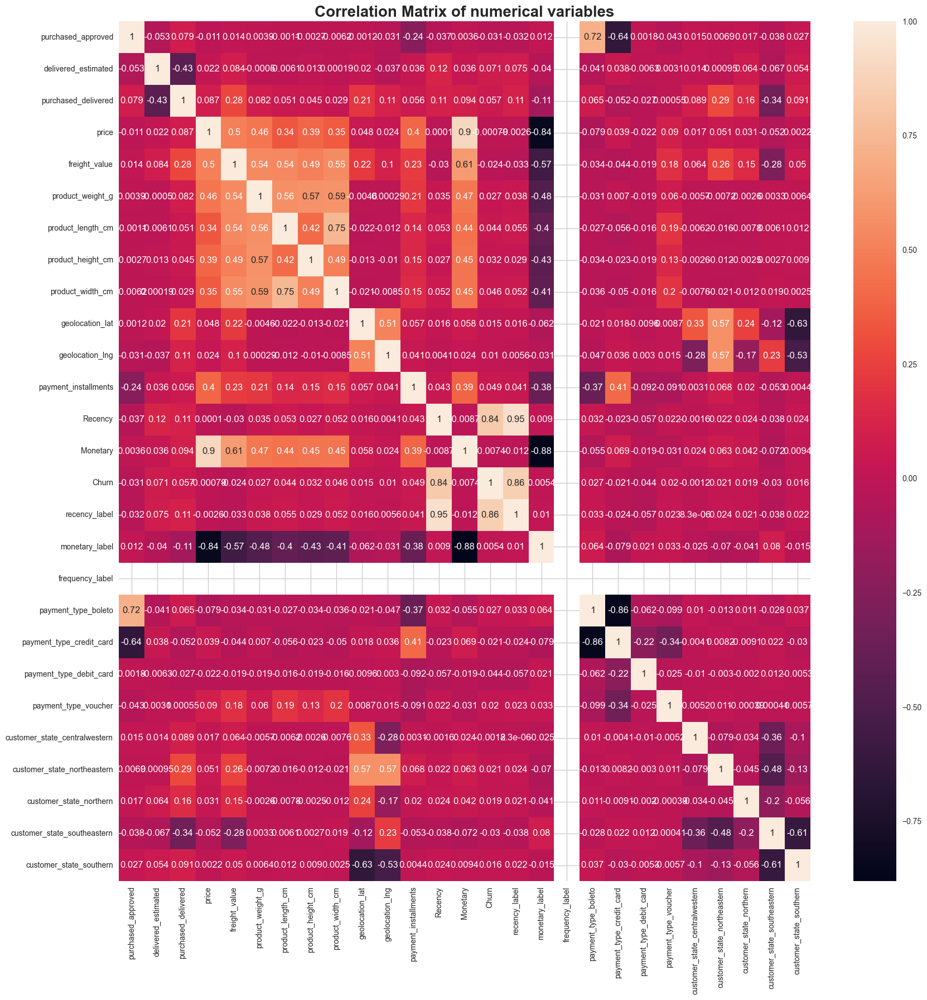

In [316]:
plt.figure(figsize=(20,20))
sns.heatmap(rfm_churn.corr(), annot = True)
plt.title('Correlation Matrix of numerical variables',fontsize=20,fontweight='bold')
plt.show()

In [317]:
model=setup(data=rfm_churn,target='Churn',fold=15)

,Description,Value
0,Session id,7368
1,Target,Churn
2,Target type,Binary
3,Original data shape,"(90528, 27)"
4,Transformed data shape,"(90528, 27)"
5,Transformed train set shape,"(63369, 27)"
6,Transformed test set shape,"(27159, 27)"
7,Numeric features,26
8,Preprocess,True
9,Imputation type,simple


In [318]:
exclude=['dt','rf','ada','gbc','xgboost','lightgbm','et']
best=compare_models(exclude=exclude)



,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
nb,Naive Bayes,0.9554,0.9993,1.0000,0.9106,0.9532,0.9108,0.9145,1.0693
ridge,Ridge Classifier,0.9553,0.0000,0.9995,0.9107,0.9530,0.9105,0.9141,1.0807
lda,Linear Discriminant Analysis,0.9553,0.9948,0.9995,0.9107,0.9530,0.9105,0.9141,1.1787
knn,K Neighbors Classifier,0.9519,0.9901,0.9370,0.9562,0.9465,0.9028,0.9030,1.4747
lr,Logistic Regression,0.9472,0.9911,0.9489,0.9357,0.9423,0.8936,0.8937,4.1693
svm,SVM - Linear Kernel,0.7950,0.0000,0.8618,0.7517,0.7921,0.5934,0.6177,1.5307
dummy,Dummy Classifier,0.5459,0.5000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0740
qda,Quadratic Discriminant Analysis,0.4954,0.4948,0.4876,0.4248,0.4097,-0.0097,-0.0110,1.1333


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9560,0.9996,1.0000,0.9116,0.9538,0.9119,0.9155
1,0.9602,0.9993,1.0000,0.9195,0.9580,0.9204,0.9233
2,0.9531,0.9994,1.0000,0.9064,0.9509,0.9063,0.9103
3,0.9484,0.9993,1.0000,0.8979,0.9462,0.8969,0.9017
4,0.9583,0.9995,1.0000,0.9160,0.9562,0.9166,0.9198
5,0.9524,0.9992,1.0000,0.9052,0.9502,0.9049,0.9090
6,0.9583,0.9992,1.0000,0.9160,0.9562,0.9166,0.9198
7,0.9536,0.9991,1.0000,0.9073,0.9514,0.9072,0.9112
8,0.9595,0.9993,1.0000,0.9182,0.9573,0.9190,0.9220


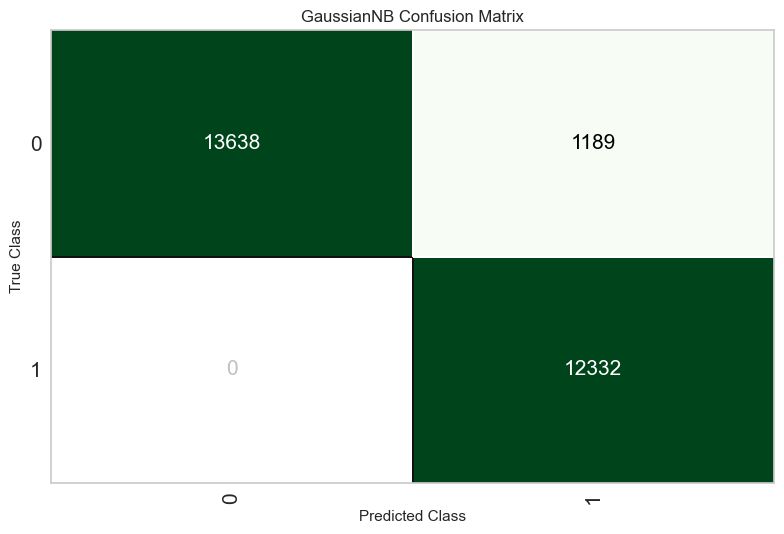

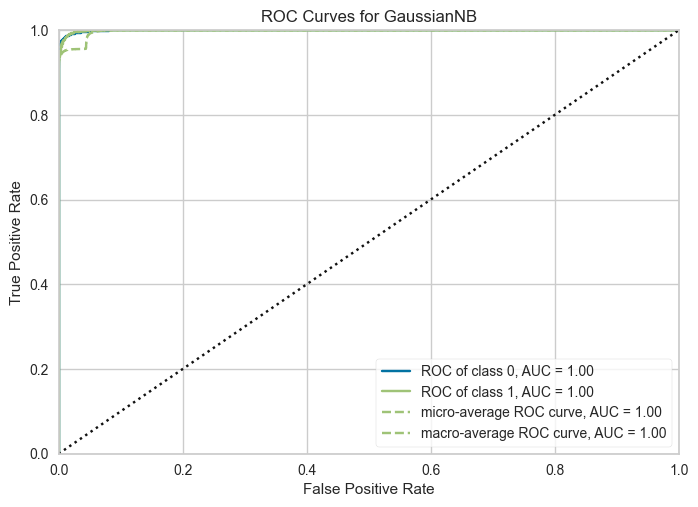

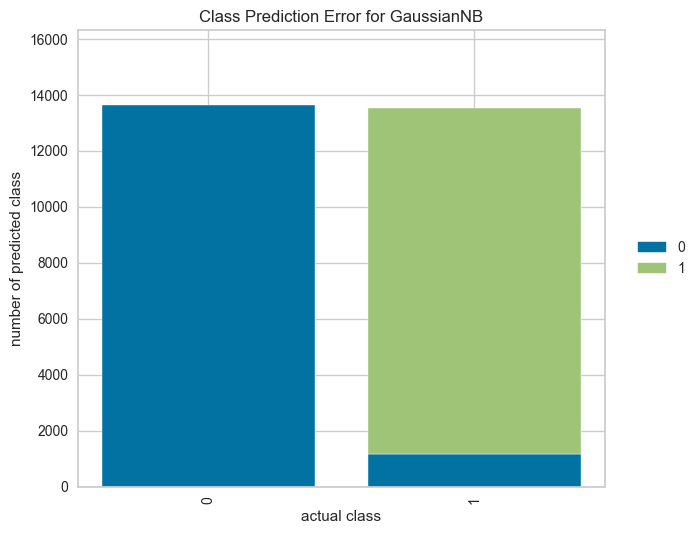

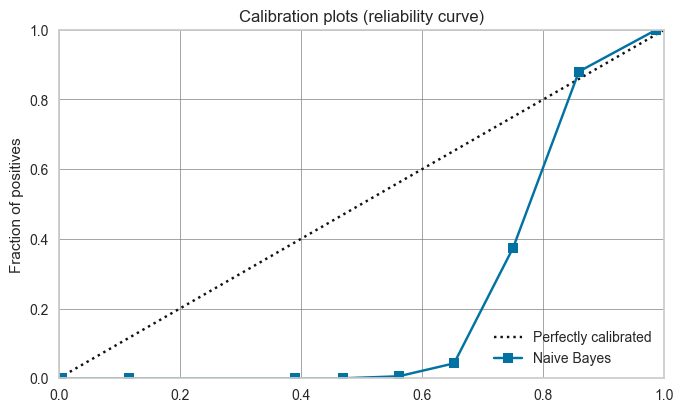

In [319]:
model1=create_model('nb')
plot_model(model1,plot='confusion_matrix')
plot_model(model1,plot='auc')
plot_model(model1,plot='error')
plot_model(model1,plot='calibration')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9560,0.0000,0.9995,0.9120,0.9537,0.9119,0.9154
1,0.9602,0.0000,0.9995,0.9199,0.9580,0.9204,0.9232
2,0.9531,0.0000,1.0000,0.9064,0.9509,0.9063,0.9103
3,0.9491,0.0000,1.0000,0.8992,0.9469,0.8983,0.9030
4,0.9583,0.0000,0.9995,0.9164,0.9561,0.9166,0.9197
5,0.9527,0.0000,1.0000,0.9056,0.9505,0.9054,0.9094
6,0.9581,0.0000,0.9995,0.9160,0.9559,0.9161,0.9193
7,0.9541,0.0000,0.9984,0.9093,0.9518,0.9081,0.9118
8,0.9595,0.0000,0.9995,0.9186,0.9573,0.9190,0.9219


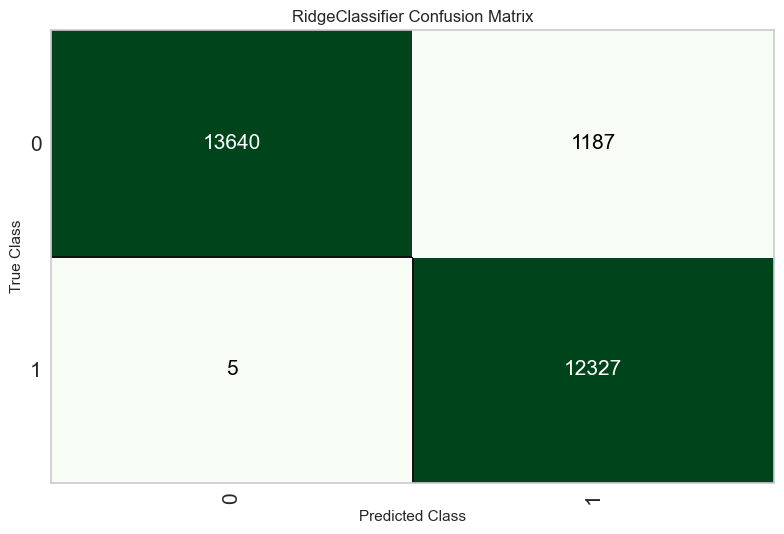

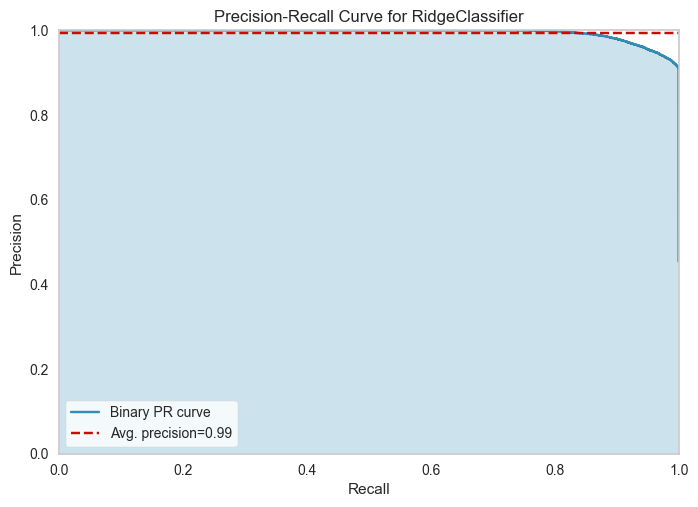

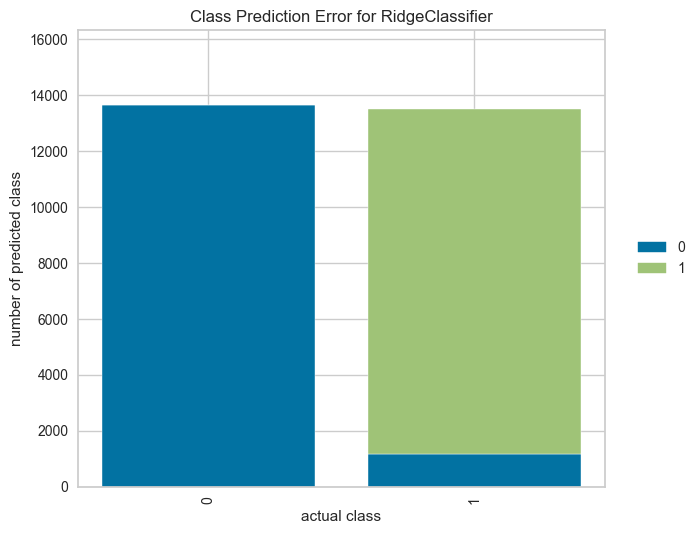

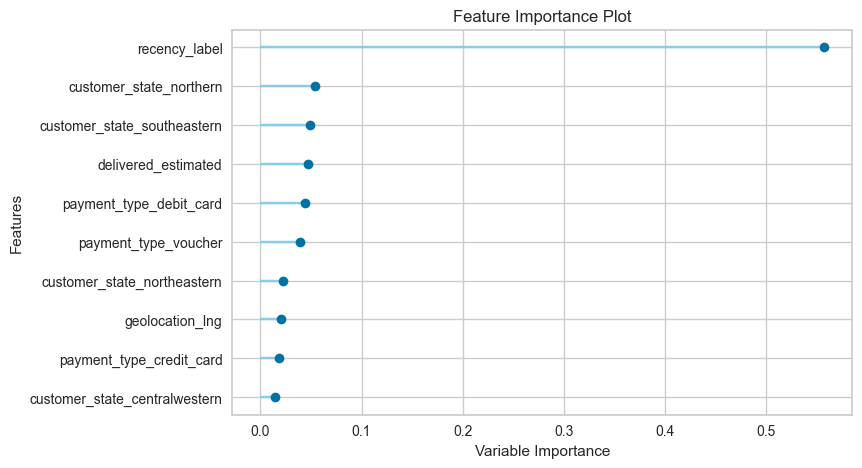

In [320]:
model2=create_model('ridge')
plot_model(model2,plot='confusion_matrix')

plot_model(model2,plot='pr')
plot_model(model2,plot='error')
plot_model(model2,plot='feature')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9560,0.9949,0.9995,0.9120,0.9537,0.9119,0.9154
1,0.9602,0.9953,0.9995,0.9199,0.9580,0.9204,0.9232
2,0.9531,0.9946,1.0000,0.9064,0.9509,0.9063,0.9103
3,0.9491,0.9938,1.0000,0.8992,0.9469,0.8983,0.9030
4,0.9583,0.9939,0.9995,0.9164,0.9561,0.9166,0.9197
5,0.9527,0.9944,1.0000,0.9056,0.9505,0.9054,0.9094
6,0.9581,0.9954,0.9995,0.9160,0.9559,0.9161,0.9193
7,0.9541,0.9953,0.9984,0.9093,0.9518,0.9081,0.9118
8,0.9595,0.9948,0.9995,0.9186,0.9573,0.9190,0.9219


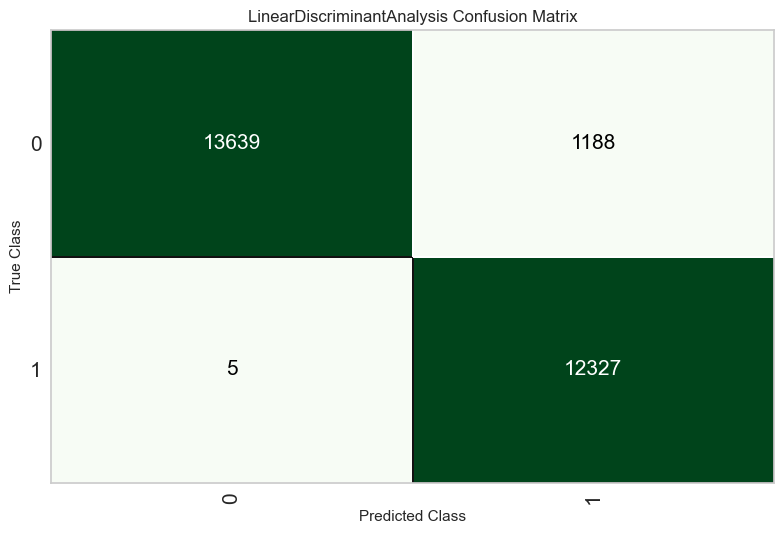

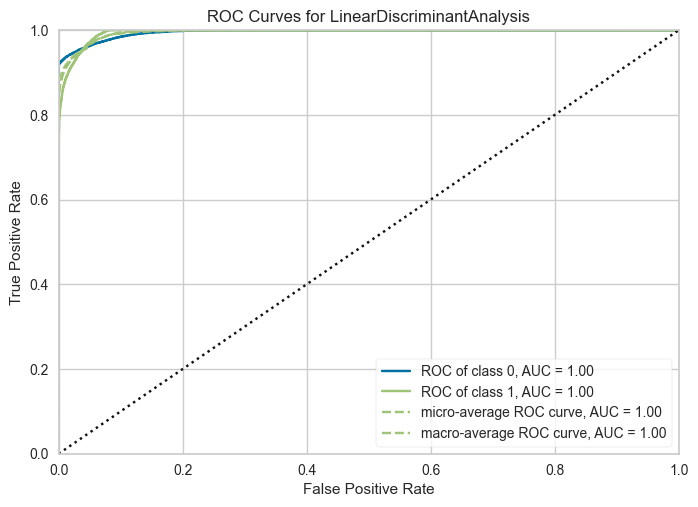

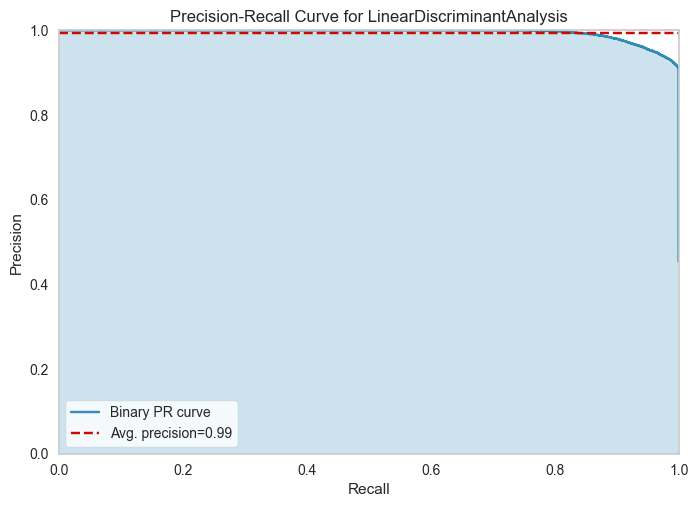

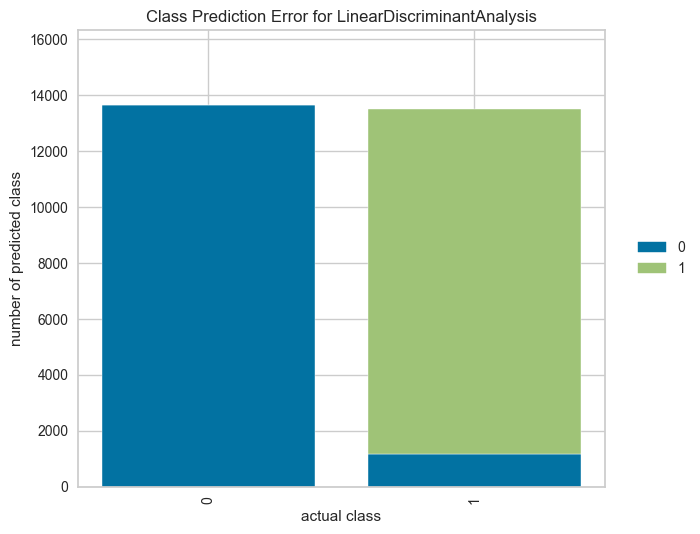

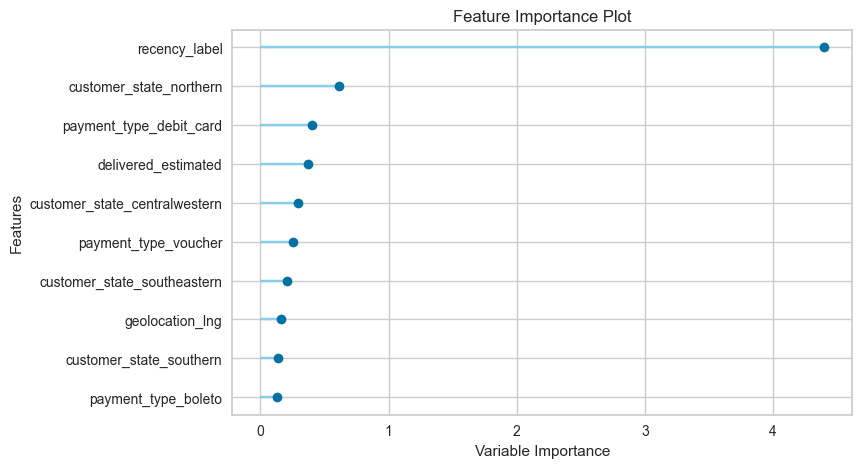

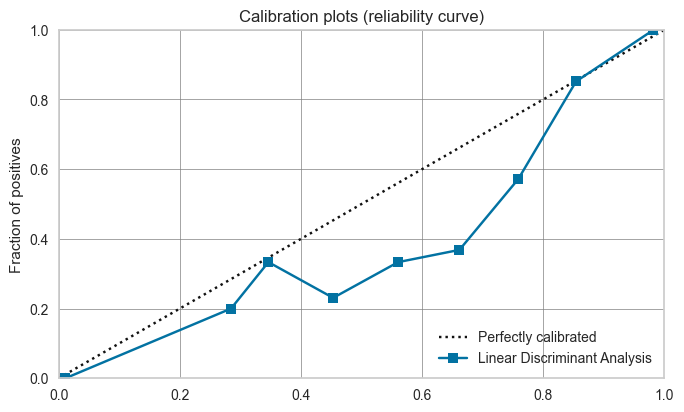

In [321]:
model3=create_model('lda')
plot_model(model3,plot='confusion_matrix')
plot_model(model3,plot='auc')
plot_model(model3,plot='pr')
plot_model(model3,plot='error')
plot_model(model3,plot='feature')
plot_model(model3,plot='calibration')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9453,0.9888,0.9234,0.9547,0.9388,0.8894,0.8898
1,0.9534,0.9904,0.9442,0.9527,0.9484,0.9059,0.9059
2,0.9531,0.9901,0.9437,0.9526,0.9481,0.9054,0.9054
3,0.9503,0.9899,0.9327,0.9567,0.9446,0.8995,0.8998
4,0.9515,0.9905,0.9338,0.9583,0.9459,0.9019,0.9022
5,0.9522,0.9884,0.9375,0.9564,0.9468,0.9034,0.9036
6,0.9517,0.9905,0.9390,0.9539,0.9464,0.9025,0.9026
7,0.9529,0.9897,0.9390,0.9565,0.9477,0.9049,0.9050
8,0.9517,0.9898,0.9396,0.9535,0.9465,0.9025,0.9026


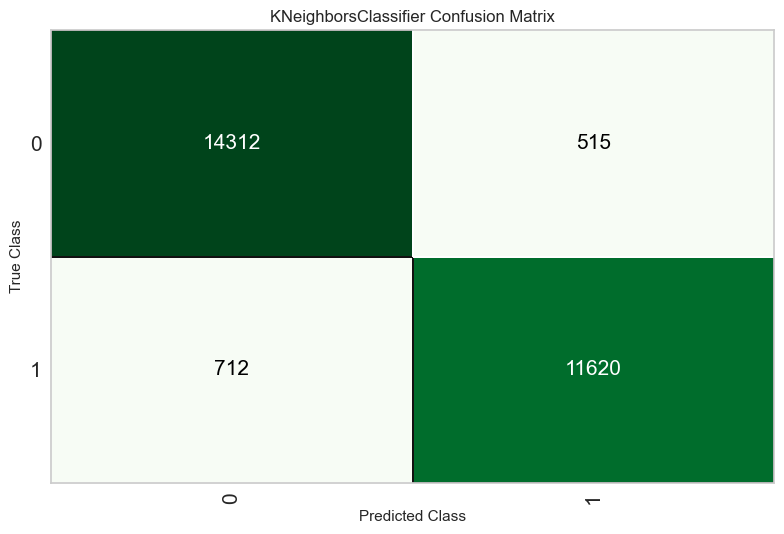

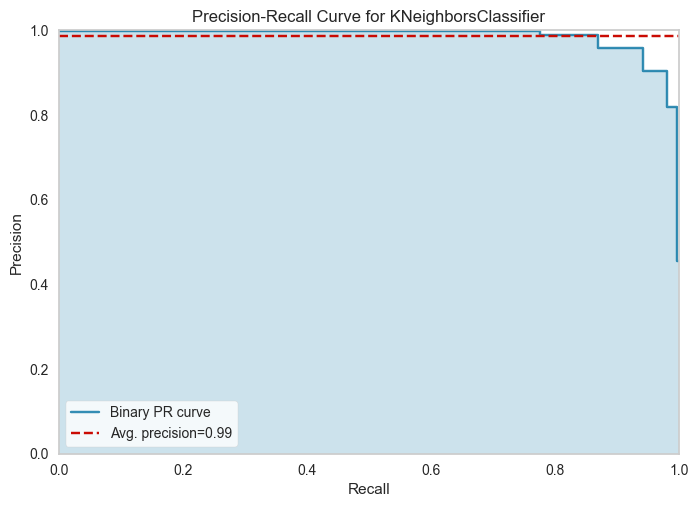

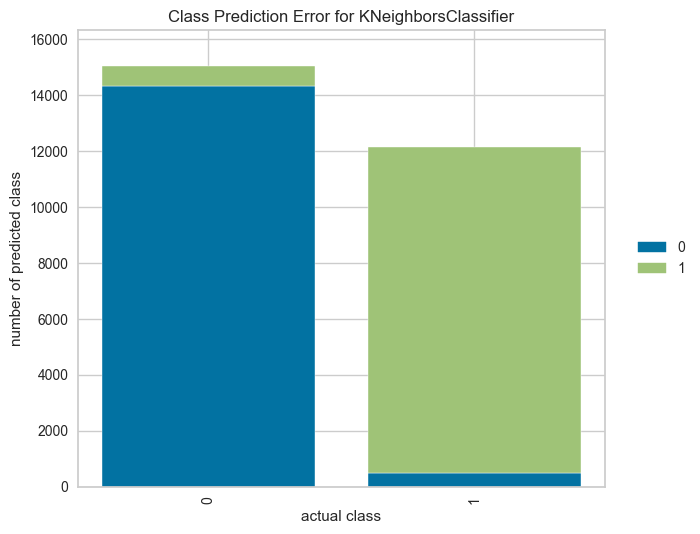

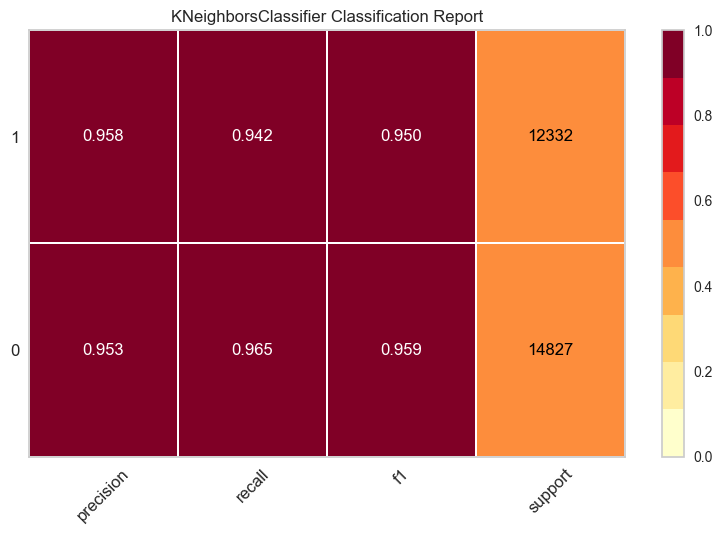

,Parameters
algorithm,auto
leaf_size,30
metric,minkowski
metric_params,None
n_jobs,-1
n_neighbors,5
p,2
weights,uniform


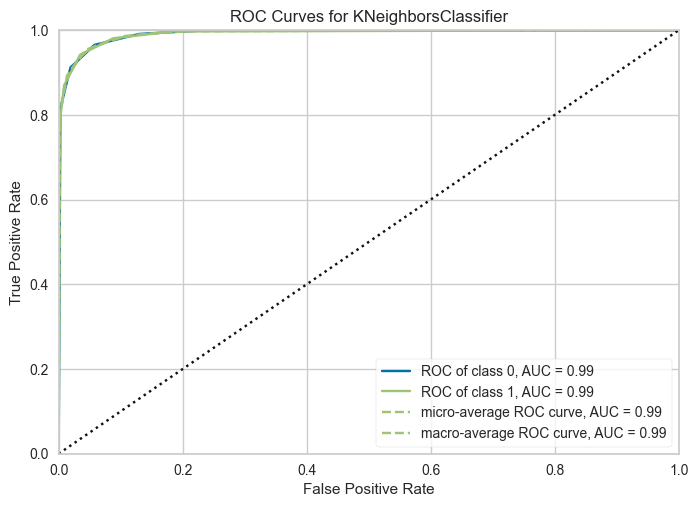

In [322]:
model4=create_model('knn')
plot_model(model4,plot='confusion_matrix')
plot_model(model4,plot='pr')
plot_model(model4,plot='error')
plot_model(model4,plot='class_report')
plot_model(model4,plot='parameter')
plot_model(model4,plot='auc')

,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.9477,0.9907,0.9442,0.9408,0.9425,0.8945,0.8945
1,0.9477,0.9910,0.9453,0.9399,0.9426,0.8945,0.8946
2,0.9444,0.9908,0.9458,0.9326,0.9392,0.8879,0.8880
3,0.9479,0.9912,0.9562,0.9310,0.9434,0.8952,0.8955
4,0.9475,0.9904,0.9463,0.9385,0.9424,0.8941,0.8941
5,0.9467,0.9907,0.9557,0.9291,0.9422,0.8928,0.8932
6,0.9529,0.9919,0.9495,0.9470,0.9482,0.9050,0.9050
7,0.9484,0.9912,0.9474,0.9395,0.9434,0.8960,0.8960
8,0.9486,0.9917,0.9521,0.9360,0.9439,0.8966,0.8967


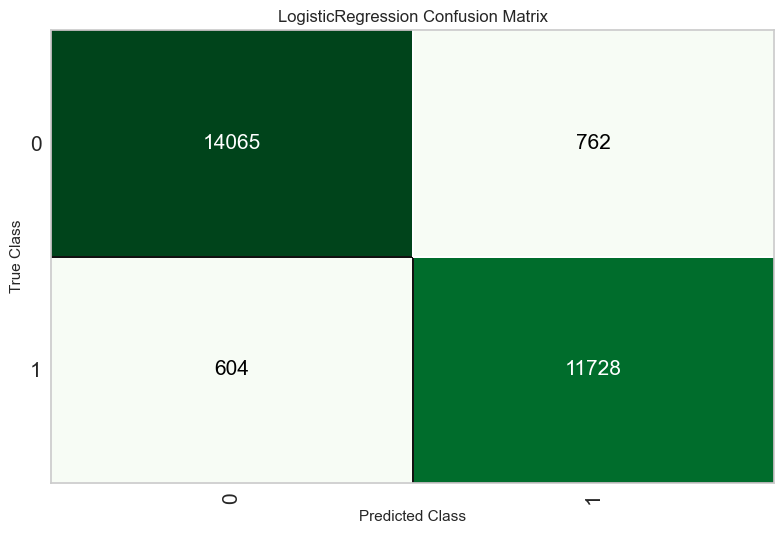

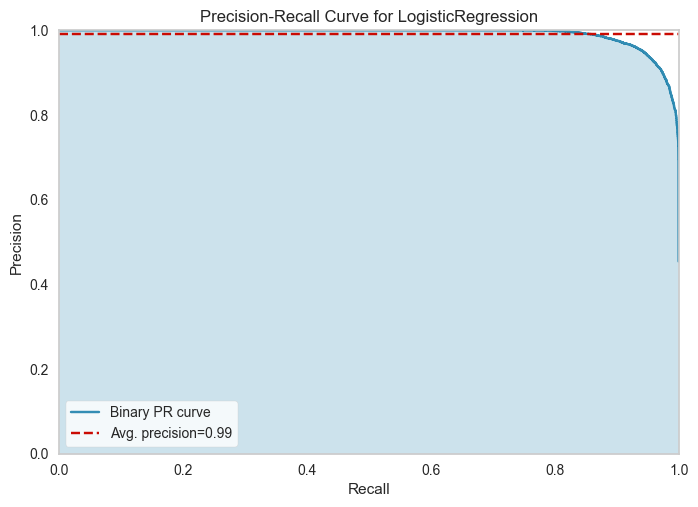

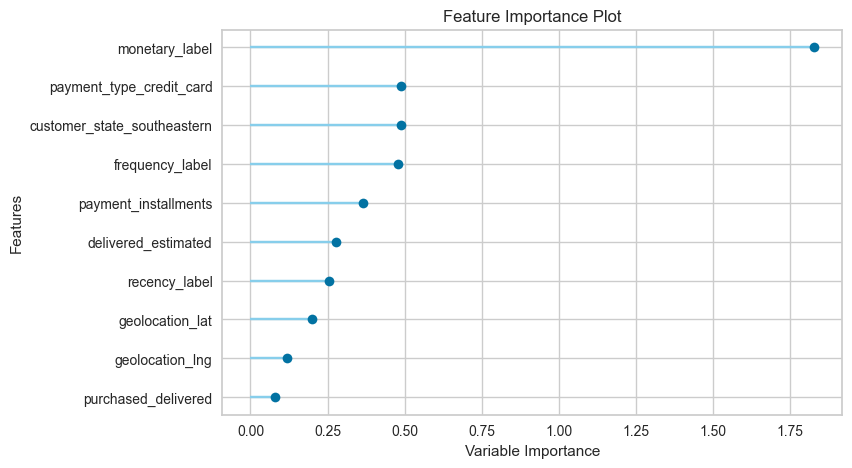

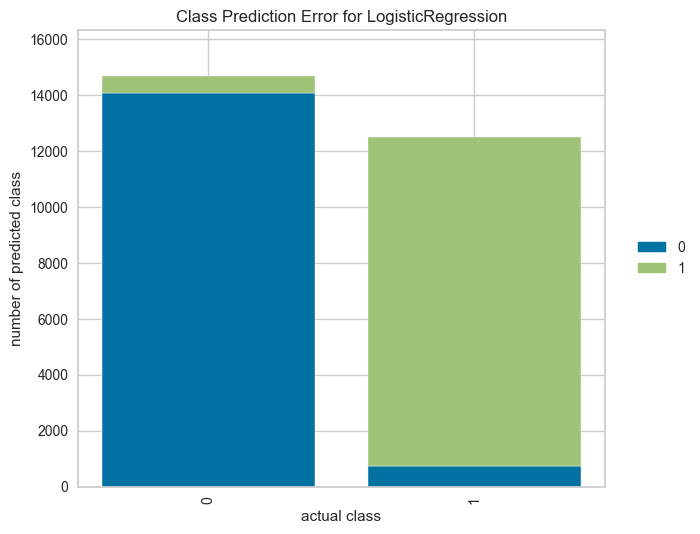

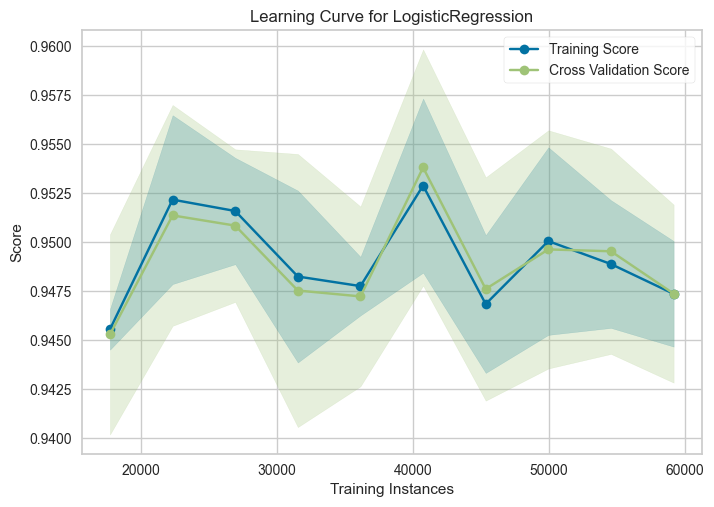

In [323]:
model5=create_model('lr')
plot_model(model5,plot='confusion_matrix')
plot_model(model5,plot='pr')
plot_model(model5,plot='feature')
plot_model(model5,plot='error')
plot_model(model5,plot='learning')


,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC
Fold,,,,,,,
0,0.7967,0.0000,0.7101,0.8180,0.7603,0.5853,0.5897
1,0.7948,0.0000,0.6966,0.8242,0.7550,0.5806,0.5867
2,0.8575,0.0000,0.9072,0.8041,0.8525,0.7157,0.7205
3,0.7254,0.0000,0.9599,0.6296,0.7604,0.4696,0.5289
4,0.8192,0.0000,0.7535,0.8325,0.7910,0.6324,0.6348
5,0.8620,0.0000,0.9104,0.8095,0.8570,0.7246,0.7292
6,0.7148,0.0000,0.9771,0.6176,0.7568,0.4515,0.5244
7,0.8215,0.0000,0.9255,0.7440,0.8249,0.6473,0.6634
8,0.8069,0.0000,0.9573,0.7145,0.8183,0.6213,0.6518


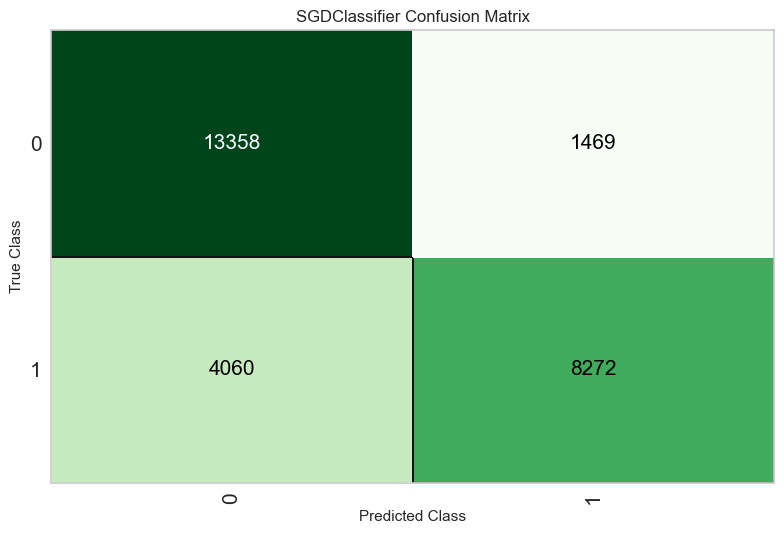

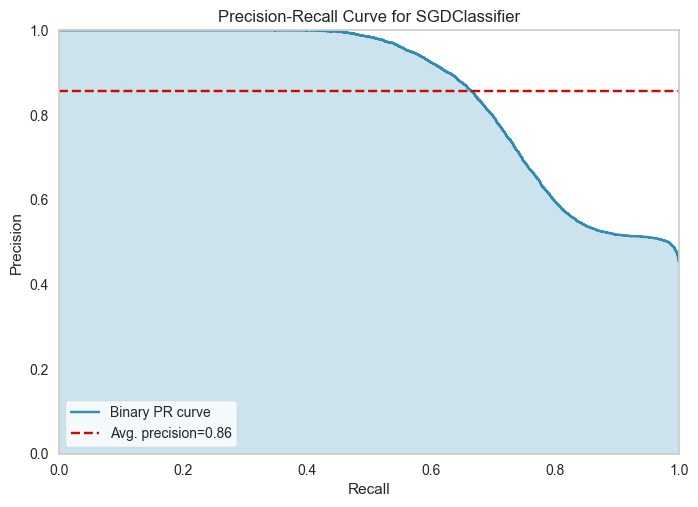

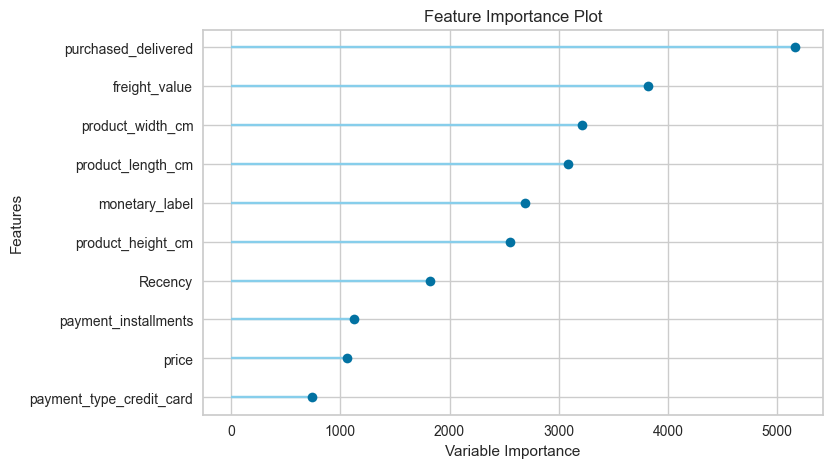

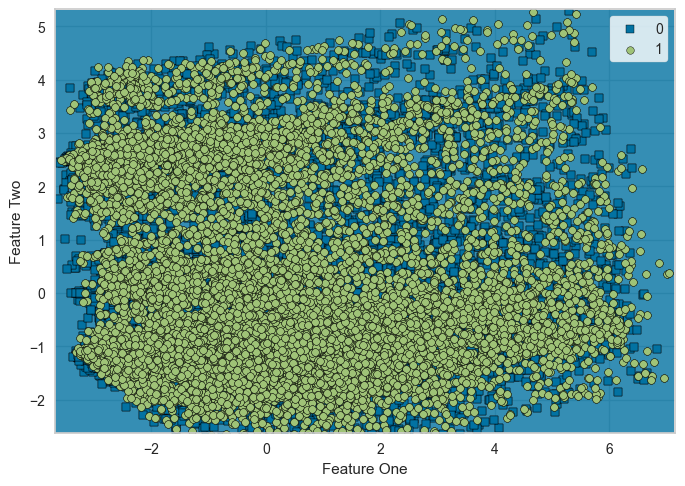

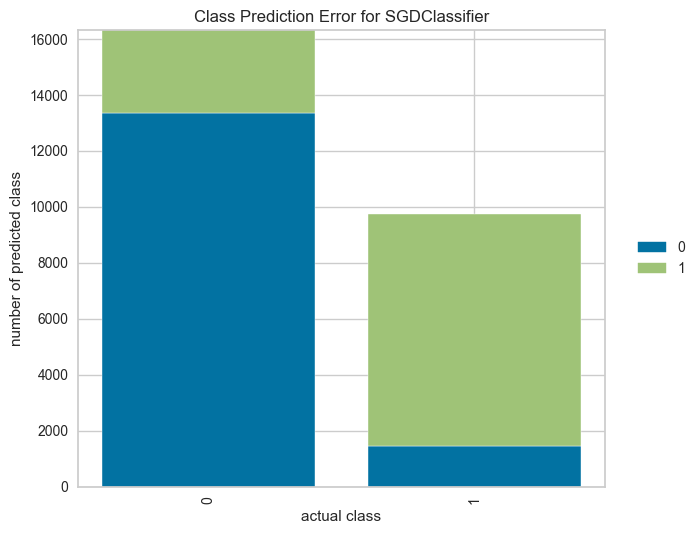

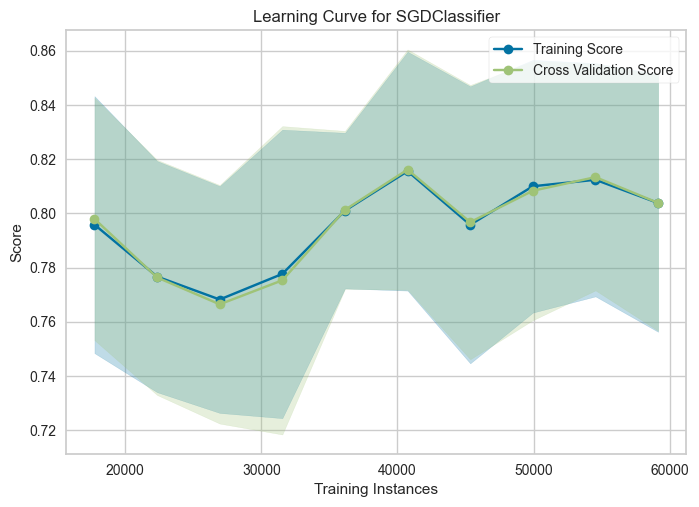

In [324]:
model6=create_model('svm')
plot_model(model6,plot='confusion_matrix')
plot_model(model6,plot='pr')
plot_model(model6,plot='feature')
plot_model(model6,plot='boundary')
plot_model(model6,plot='error')
plot_model(model6,plot='learning')